**Analysis LegendPLex Serum Cytokines ANTICIPATE Covid**



# Install and import packages

In [3]:
pip install imgaug==0.2.5

In [5]:
pip install matplotlib==3.4.3

In [6]:
pip install squarify

In [7]:
pip install lifelines

In [8]:
pip install statsmodels

In [9]:
#import
import pandas as pd
import matplotlib.colors as colors
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scanpy.external as sce
import anndata
import math
import scipy.stats
from scipy.spatial import distance
from scipy.cluster import hierarchy

In [10]:
#pseudonymization
def pseudonymize_data(df,df_map,id_col,split = True, drop_columns=[]):
  'replace primary pseudonyms with secondary pseudonyms for publication'
  if split ==True:
    #map secondary ids with dictionary
    map_dict = df_map['secondary_ID'].to_dict()
    sec_id = df[id_col].str.split('_', expand=True)[0].map(map_dict)
    timepoint = df[id_col].str.split('_', expand=True)[1]
    #join secondary ids and timepoints to obtain secondary sample ids
    sec_sample_id = sec_id + ['_']*len(sec_id)+ timepoint
    df.loc[:,id_col] = list(sec_sample_id)
    df = df.drop(columns=drop_columns)
  if split ==False:
    #map secondary ids with dictionary
    map_dict = df_map['secondary_ID'].to_dict()
    sec_id = df[id_col].map(map_dict)
    df.loc[:,id_col] = list(sec_id)
  return df

In [11]:

def corr_cov_matrix_cluster(df, markers=['all_markers'], metric='spearman',clustering_method = 'average', linkage_distance=1.6):
  'calculate a covariance/correlation matrix with hierarchical clustering'

  #define markers to correlate
  if markers == ['all_markers']:
    markers = list(df.index)

  # Filter out genes not present data
  marker_cytokines_filtered = []
  for marker in markers:
    if marker in df.columns:   
      marker_cytokines_filtered.append(marker)

  # Filter out genes not present in data
  a = np.std(df.loc[:,df.columns.isin(marker_cytokines_filtered)], axis=0)
  b = pd.DataFrame(a.T, index=a[df.columns.isin(marker_cytokines_filtered)].index)
  c = b[0]!=0
  d = b[c]
  e = b[0]==0
  f = b[e]
  marker_cytokines_filtered_nonzeroSD = d

  #marker gene list
  marker_cytokines_filtered_nonzeroSD = list(marker_cytokines_filtered_nonzeroSD.index)
    
  #calculate covariance or corrcoef 
  if metric == 'spearman':             
    subsetcluster_cov = np.corrcoef(df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
  elif metric == 'covariance':            
    subsetcluster_cov = np.cov(df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
  else:
    print('please set variable <subsetcluster_cov> to either: spearman, covariance or covariance_log')
  subsetcluster_df = pd.DataFrame(subsetcluster_cov, index=marker_cytokines_filtered_nonzeroSD, columns=marker_cytokines_filtered_nonzeroSD)
    
  #hierarchically cluster rows and columns    
  if True not in np.isnan(subsetcluster_cov):
      #define hierachical clustering
      row_linkage = scipy.cluster.hierarchy.linkage(scipy.spatial.distance.pdist(subsetcluster_cov), method=clustering_method)
      col_linkage = scipy.cluster.hierarchy.linkage(scipy.spatial.distance.pdist(subsetcluster_cov.T), method=clustering_method)
      #color side bar according to flat clustering
      row_col = []
      col_col = []
  else:
    print('dataframe contains NaNs')
          
  hierarchical_cluster = scipy.cluster.hierarchy.fcluster(row_linkage, linkage_distance, criterion='distance')
  for j in hierarchical_cluster:
    a = color_map_clusters_nogrey[j]
    row_col.append(a)
    col_col.append(a)
  
  return pd.DataFrame(hierarchical_cluster, index=subsetcluster_cov_df.index, columns=['cluster'])


In [12]:
def boot_corr_cov_matrix_cluster(cov_df, n_iters = 100,replacement=True,metric='spearman',clustering_method = 'average', linkage_distance=1.6):
  'bootstrap a dataframe to obtain a dataframe of flat clusterings, from which the coocurrence for each pair of markers is calculated and aggregate in the output df'

  #first step: bootstrap to produce flat clusterings
  counter =0
  df_list = [] #store results here

  print('bootstrapping')
  while counter <n_iters:
    cov_df_sampling = cov_df.sample(frac=1, replace=replacement, weights=None, axis=0)
    cov_df_sampled = corr_cov_matrix_cluster(cov_df_sampling,markers=marker_cytokines, metric=metric,clustering_method = clustering_method, linkage_distance=linkage_distance)
    df_list.append(cov_df_sampled)
    counter = counter +1
  print('bootstrapping completed')
  #df containing the flat clusters of each iteration
  clustering_boot_df = pd.concat(df_list, axis=1, join='outer', ignore_index=False, keys=None, levels=None, names=None, verify_integrity=False, sort=False, copy=True)

  #second step: now we count the cooccurence of cytokines in each clustering and aggregate this information in a new dataframe

  boots_trap_df_cytokines = pd.DataFrame(index=marker_cytokines, columns=marker_cytokines)
  boots_trap_df_cytokines = boots_trap_df_cytokines.fillna(value=0, method=None, axis=None, inplace=False, limit=None, downcast=None)
  print('aggregating data')
  #iterate over each sampled clustering
  for h in range(len(clustering_boot_df.columns)):
    clustering_boot_df_subset = clustering_boot_df.iloc[:,h]
    #iterate over each cluster
    for i in set(clustering_boot_df_subset):
      cytokines_in_cluster = clustering_boot_df_subset[clustering_boot_df_subset==i].index
      #set cytokines falling into one cluster to 1 in new dataframe merging the results
      for j in cytokines_in_cluster:
        for k in cytokines_in_cluster:
          boots_trap_df_cytokines.loc[j,k] = boots_trap_df_cytokines.loc[j,k]+1
          
  return boots_trap_df_cytokines

In [13]:
def custom_sort_pandas(df, column_name, column_levels):
  #sort dataframe by custom list
  df_mapping = pd.DataFrame({
    column_name: column_levels})
  sort_mapping = df_mapping.reset_index().set_index(column_name)
  df['num'] = df[column_name].map(sort_mapping['index'])
  df = df.sort_values('num')
  df = df.drop(columns='num')
  return df

In [14]:
#mount google drive
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [15]:
from google.colab import files

In [16]:
#show the data located on your drive
!ls '/content/drive/My Drive/infergnostics/clinical_trials/ANTICIPATE/covid/' #put here the path to the folder after /content/drive/My Drive/. you have to put it into brackets

ANTICIPATE_cohort1_covid_patients_v_3_pseudonyms_clean.csv
ANTICIPATE_cohort1_covid_patients_v_3_pseudonyms_clean_utfmin8.csv
ANTICIPATE_cohort1_covid_patients_v_3_pseudonyms.csv
ANTICIPATE_cohort1_covid_patients_v_3_pseudonyms.gsheet
ANTICIPATE_cohort1_longterm_AE_all_v3_AE_after_virtual_vacc.csv
ANTICIPATE_cohort1_longterm_AE_all_v3_AE_after_virtual_vacc_matched.csv
ANTICIPATE_cohort1_longterm_AE_all_v3.csv
ANTICIPATE_cohort1_patient_info_all_v2.csv
ANTICIPATE_cohort1_patient_info_all_v3.csv
ANTICIPATE_cohort1_patient_info_all_v3_virtual_vacc.csv
covid_1st_dose_bilirubin.csv
covid_1st_dose_creatinine.csv
covid_1st_dose_crp.csv
covid_1st_dose_hb.csv
covid_1st_dose_leuko.csv
covid_1st_dose_platelets.csv
covid_2nd_dose_bilirubin.csv
covid_2nd_dose_creatinine.csv
covid_2nd_dose_crp.csv
covid_2nd_dose_hb.csv
covid_2nd_dose_leuko.csv
covid_2nd_dose_platelets.csv
covid_vacc_antibodies.csv
covid_vacc_antibody_timepoints.csv
Figures
JK4-1-1-210728_panel1.csv
JK4-1-1-210728_panel2.csv
JK4-1-2-

In [17]:
pip install pymatch

In [18]:
!pip freeze

absl-py==0.12.0
alabaster==0.7.12
albumentations==0.1.12
altair==4.1.0
anndata==0.7.5
appdirs==1.4.4
argcomplete==1.12.3
argon2-cffi==21.1.0
arviz==0.11.4
astor==0.8.1
astropy==4.3.1
astunparse==1.6.3
atari-py==0.2.9
atomicwrites==1.4.0
attrs==21.2.0
audioread==2.1.9
autograd==1.3
autograd-gamma==0.5.0
Babel==2.9.1
backcall==0.2.0
beautifulsoup4==4.6.3
bleach==4.1.0
blis==0.4.1
bokeh==2.3.3
Bottleneck==1.3.2
branca==0.4.2
bs4==0.0.1
CacheControl==0.12.10
cached-property==1.5.2
cachetools==4.2.4
catalogue==1.0.0
certifi==2021.10.8
cffi==1.15.0
cftime==1.5.1.1
chardet==3.0.4
charset-normalizer==2.0.7
click==7.1.2
cloudpickle==1.3.0
cmake==3.12.0
cmdstanpy==0.9.5
colorcet==2.0.6
colorlover==0.3.0
community==1.0.0b1
contextlib2==0.5.5
convertdate==2.3.2
coverage==3.7.1
coveralls==0.5
crcmod==1.7
cufflinks==0.17.3
cvxopt==1.2.7
cvxpy==1.0.31
cycler==0.11.0
cymem==2.0.6
Cython==0.29.24
daft==0.0.4
dask==2.12.0
datascience==0.10.6
debugpy==1.0.0
decorator==4.4.2
defusedxml==0.7.1
descartes==1

# Load data

In [19]:
#paths
DATA_DIR = '/content/drive/My Drive/infergnostics/clinical_trials/ANTICIPATE/covid/'

#mapping dict
secondary_id_dict_path = DATA_DIR+ 'secondary_id_dict.csv'

#cytokine data
JK210728_panel1_path = DATA_DIR+ 'JK4-1-1-210728_panel1.csv'
JK210728_panel2_path = DATA_DIR+ 'JK4-1-1-210728_panel2.csv'
JK210803_panel1_path = DATA_DIR+ 'JK4-1-2-210803_Panel1_clean.csv'
JK210803_panel2_path = DATA_DIR+ 'JK4-1-2-210803_Panel2_clean.csv'
JK210810_panel1_path = DATA_DIR+ 'JK4-1-3-210810_Panel1_clean.csv'
JK210810_panel2_path = DATA_DIR+ 'JK4-1-3-210810_Panel2_clean.csv'

#antibody data
covid_antibodies_path = DATA_DIR+ 'covid_vacc_antibodies.csv'
covid_antibody_timepoints_path = DATA_DIR+ 'covid_vacc_antibody_timepoints.csv'

#lab data
covid_1st_dose_bilirubin_path = DATA_DIR+ 'covid_1st_dose_bilirubin.csv'
covid_2nd_dose_bilirubin_path = DATA_DIR+ 'covid_2nd_dose_bilirubin.csv'
covid_1st_dose_creatinine_path = DATA_DIR+ 'covid_1st_dose_creatinine.csv'
covid_2nd_dose_creatinine_path = DATA_DIR+ 'covid_2nd_dose_creatinine.csv'
covid_1st_dose_crp_path = DATA_DIR+ 'covid_1st_dose_crp.csv'
covid_2nd_dose_crp_path = DATA_DIR+ 'covid_2nd_dose_crp.csv'
covid_1st_dose_platelets_path = DATA_DIR+ 'covid_1st_dose_platelets.csv'
covid_2nd_dose_platelets_path = DATA_DIR+ 'covid_2nd_dose_platelets.csv'
covid_1st_dose_leuko_path = DATA_DIR+ 'covid_1st_dose_leuko.csv'
covid_2nd_dose_leuko_path = DATA_DIR+ 'covid_2nd_dose_leuko.csv'
covid_1st_dose_hb_path = DATA_DIR+ 'covid_1st_dose_hb.csv'
covid_2nd_dose_hb_path = DATA_DIR+ 'covid_2nd_dose_hb.csv'

#metadata
patient_table_path = DATA_DIR + 'ANTICIPATE_cohort1_patient_info_all_v3.csv'
sample_table_path = DATA_DIR + 'sample_list_v1.csv'
long_term_ae_path = DATA_DIR + 'ANTICIPATE_cohort1_longterm_AE_all_v3.csv'




In [20]:
#df_map = pd.read_csv(secondary_id_dict_path, index_col='ID')
#df = pd.read_csv(sample_table_path)
#df = pseudonymize_data(df,df_map,'sample_id',split=True)
#df.to_csv(sample_table_path)
#print('pseudonymized',i)

In [21]:
#metadata and colors

#patients
patient_table = pd.read_csv(patient_table_path, index_col='Patient_ID')
patient_color_dict = patient_table['color_code'].to_dict()

#samples
sample_table = pd.read_csv(sample_table_path, index_col='sample_id')
time_dict = sample_table['timepoint'].to_dict()

#colors
blue_red_grey = ['#1452f9','#f92214','#bfbfbf']
blue_blue_red_grey = ['#1452f9','#85a5fa','#f92214','#bfbfbf']
timepoint_color_dict = {'pre':'#000000', 'post1':'#c8c8c8', 'post2':'#afdc20'}
time_color_dict = {x:timepoint_color_dict[time_dict[x]] for x in time_dict}
color_map_clusters_nogrey = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

## lab data

In [22]:
#read AE
long_term_ae = pd.read_csv(long_term_ae_path)
long_term_ae

,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS
0,EK6BCT,Bilirubin_increase,3/20/2021,1.0,1.0
1,EK6BCT,Creatinine_increase,5/4/2021,1.0,2.0
2,EK6BCT,Muscle_cramps,7/27/2021,1.0,1.0
3,EK6BCT,Creatinine_Increase,4/16/2021,1.0,1.0
4,EK6BCT,Bilirubin_Increase,4/30/2021,1.0,1.0
...,...,...,...,...,...
330,L5ZXEF,Anemia,8/29/2021,3.0,3.0
331,RWCFP8,Autoimmune_Disorder-Arthritis,7/27/2021,2.0,4.0
332,RWCFP8,Myalgia,7/27/2021,2.0,4.0
333,RWCFP8,Autoimmune_disorder-Nephritis,8/27/2021,3.0,4.0


In [23]:
#read lab data

#bilirubin after dose 1
covid_bilirubin_1st_dose_df = pd.read_csv(covid_1st_dose_bilirubin_path)

#bilirubin after dose 2
covid_bilirubin_2nd_dose_df = pd.read_csv(covid_2nd_dose_bilirubin_path)
covid_bilirubin_2nd_dose_df 

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,VMQLNV,Comirnaty,0,0.66
1,1,1,1,1,IZO4HU,Comirnaty,3,0.30
2,2,2,2,2,FKLSVO,Comirnaty,21,0.50
3,3,3,3,3,9W8OQ3,Comirnaty,4,0.50
4,4,4,4,4,E61BKL,Comirnaty,10,0.50
...,...,...,...,...,...,...,...,...
163,163,163,163,163,L9YLRD,Astra Zeneca,0,0.30
164,164,164,164,164,KWO5UQ,Astra Zeneca,0,0.50
165,165,165,165,165,FWO178,Astra Zeneca,0,21.20
166,166,166,166,166,7Z9V9Q,Astra Zeneca,0,0.50


In [24]:
covid_1st_dose_bilirubin_path

'/content/drive/My Drive/infergnostics/clinical_trials/ANTICIPATE/covid/covid_1st_dose_bilirubin.csv'

In [25]:
set(covid_bilirubin_1st_dose_df['vaccine_type'])

{'Astra Zeneca', 'Comirnaty', 'Moderna', 'heterologous', 'not_defined'}

In [26]:
#read lab data

#crp after dose 1
covid_crp_1st_dose_df = pd.read_csv(covid_1st_dose_crp_path)

#crp after dose 2
covid_crp_2nd_dose_df = pd.read_csv(covid_2nd_dose_crp_path)
covid_crp_2nd_dose_df 


,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,IZO4HU,Comirnaty,0,2.0
1,1,1,1,FKLSVO,Comirnaty,0,2.0
2,2,2,2,E61BKL,Comirnaty,0,8.0
3,3,3,3,KUDJHR,Comirnaty,0,2.8
4,4,4,4,F81VCA,Comirnaty,0,2.3
...,...,...,...,...,...,...,...
144,144,144,144,JBEZKB,Astra Zeneca,56,2.0
145,145,145,145,G8ZRBI,Astra Zeneca,34,2.0
146,146,146,146,KWO5UQ,Astra Zeneca,24,22.9
147,147,147,147,G8ZRBI,Astra Zeneca,51,2.0


In [27]:
#read lab data

#creatinine after dose 1
covid_creatinine_1st_dose_df = pd.read_csv(covid_1st_dose_creatinine_path)

#creatinine after dose 2
covid_creatinine_2nd_dose_df = pd.read_csv(covid_2nd_dose_creatinine_path)
covid_creatinine_2nd_dose_df 


,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Unnamed: 0.1.1.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,0,VMQLNV,Comirnaty,0,0.92
1,1,1,1,1,1,IZO4HU,Comirnaty,0,0.50
2,2,2,2,2,2,FKLSVO,Comirnaty,0,0.69
3,3,3,3,3,3,E61BKL,Comirnaty,0,1.20
4,4,4,4,4,4,KUDJHR,Comirnaty,0,1.06
...,...,...,...,...,...,...,...,...,...
155,155,155,155,155,155,JBEZKB,Astra Zeneca,56,0.65
156,156,156,156,156,156,G8ZRBI,Astra Zeneca,34,0.89
157,157,157,157,157,157,KWO5UQ,Astra Zeneca,24,0.98
158,158,158,158,158,158,G8ZRBI,Astra Zeneca,51,0.73


In [28]:
#read lab data

#platelets after dose 1
covid_platelets_1st_dose_df = pd.read_csv(covid_1st_dose_platelets_path)

#platelets after dose 2
covid_platelets_2nd_dose_df = pd.read_csv(covid_2nd_dose_platelets_path)
covid_platelets_2nd_dose_df 

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,VMQLNV,Comirnaty,0,255
1,1,1,1,1,IZO4HU,Comirnaty,0,290
2,2,2,2,2,FKLSVO,Comirnaty,0,290
3,3,3,3,3,E61BKL,Comirnaty,0,203
4,4,4,4,4,KUDJHR,Comirnaty,0,226
...,...,...,...,...,...,...,...,...
160,160,160,160,160,EC6DJA,Comirnaty,11,5
161,161,161,161,161,EC6DJA,Comirnaty,4,106
162,162,162,162,162,EC6DJA,Comirnaty,12,40
163,163,163,163,163,EC6DJA,Comirnaty,19,86


In [29]:
#read lab data

#hb after dose 1
covid_hb_1st_dose_df = pd.read_csv(covid_1st_dose_hb_path)

#hb after dose 2
covid_hb_2nd_dose_df = pd.read_csv(covid_2nd_dose_hb_path)
covid_hb_2nd_dose_df 

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,VMQLNV,Comirnaty,0,13.6
1,1,1,1,1,IZO4HU,Comirnaty,0,11.0
2,2,2,2,2,FKLSVO,Comirnaty,0,12.4
3,3,3,3,3,E61BKL,Comirnaty,0,10.3
4,4,4,4,4,KUDJHR,Comirnaty,0,14.8
...,...,...,...,...,...,...,...,...
156,156,156,156,156,JBEZKB,Astra Zeneca,56,13.2
157,157,157,157,157,G8ZRBI,Astra Zeneca,34,13.9
158,158,158,158,158,KWO5UQ,Astra Zeneca,24,14.0
159,159,159,159,159,G8ZRBI,Astra Zeneca,51,14.1


In [30]:
#read lab data

#leuko after dose 1
covid_leuko_1st_dose_df = pd.read_csv(covid_1st_dose_leuko_path)

#leuko after dose 2
covid_leuko_2nd_dose_df = pd.read_csv(covid_2nd_dose_leuko_path)
covid_leuko_2nd_dose_df 

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,VMQLNV,Comirnaty,0,3.40
1,1,1,1,1,NaN,NaN,0,5.42
2,2,2,2,2,FKLSVO,Comirnaty,0,4.08
3,3,3,3,3,E61BKL,Comirnaty,0,4.40
4,4,4,4,4,KUDJHR,Comirnaty,0,7.03
...,...,...,...,...,...,...,...,...
156,156,156,156,156,JBEZKB,Astra Zeneca,56,6.55
157,157,157,157,157,G8ZRBI,Astra Zeneca,34,8.10
158,158,158,158,158,KWO5UQ,Astra Zeneca,24,6.54
159,159,159,159,159,G8ZRBI,Astra Zeneca,51,6.08


## antibody data

In [31]:
#read antibody data
covid_antibody_df = pd.read_csv(covid_antibodies_path,index_col=0)
covid_antibody_df = covid_antibody_df.groupby('sample').agg('mean')
covid_antibody_df

,neut_antibody_pg_ml
sample,
0ZTE2L_T3,3848559.0
0ZTE2L_T4,7231127.0
13N151_T0,5959513.0
13N151_T1,52690692.0
13N151_T2,8442583.0
...,...
VMQLNV_T7,12061851.5
X65WDO_T1,25620432.0
X65WDO_T3,8506702.5


In [32]:
#read antibody timepoints and convert to dict
covid_antibody_timepoints_df = pd.read_csv(sample_table_path,index_col='sample_id')
covid_antibody_timepoints_time_dict = covid_antibody_timepoints_df['time_from_first'].to_dict()
covid_antibody_timepoints_timepoint_dict = covid_antibody_timepoints_df['timepoint'].to_dict()

In [33]:
#add timepoints to antibody data
covid_antibody_df['timepoint'] =  covid_antibody_df.index.map(covid_antibody_timepoints_timepoint_dict)
covid_antibody_df['time_from_vacc'] =  covid_antibody_df.index.map(covid_antibody_timepoints_time_dict)
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc
sample,,,
0ZTE2L_T3,3848559.0,pre,-6
0ZTE2L_T4,7231127.0,post2,50
13N151_T0,5959513.0,pre,-9
13N151_T1,52690692.0,post2,33
13N151_T2,8442583.0,post2,162
...,...,...,...
VMQLNV_T7,12061851.5,post2,75
X65WDO_T1,25620432.0,pre,-81
X65WDO_T3,8506702.5,post2,106


## cytokine plex data

In [34]:
#read data, aggregate, fill nan (not detected) with 0s
JK210728_panel1 = pd.read_csv(JK210728_panel1_path, index_col=0)
JK210728_panel1 = JK210728_panel1.drop(columns='experiment')
JK210728_panel1 = JK210728_panel1.drop(columns='sample_type')
JK210728_panel1_mean = JK210728_panel1.groupby('sample_id').agg('mean')
JK210728_panel1_mean =  JK210728_panel1_mean.fillna(value=0)
JK210728_panel1_mean


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10
sample_id,,,,,,,,,,,,,
2JJ523_T2,0.002650,0.488808,0.016810,0.001488,0.000316,0.000910,0.005456,0.211265,0.008540,0.000930,0.318752,0.006385,0.000835
2JJ523_T3,0.026955,0.907744,0.026560,0.001220,0.000924,0.003140,0.004868,0.539480,0.456796,0.000830,0.532683,0.006657,0.000930
2JJ523_T4,0.086625,0.321022,0.031870,0.001302,0.000102,0.000000,0.011186,0.315895,0.001834,0.000320,0.145320,0.006830,0.000590
39H11P_T1,0.013130,0.337564,0.071865,0.006496,0.007225,0.030030,0.011756,0.442580,0.012064,0.018190,0.224313,0.027178,0.005760
39H11P_T2,0.021395,0.328287,0.096350,0.012617,0.016002,0.042840,0.018211,0.664240,0.032115,0.023310,0.324601,0.093914,0.007595
A8SRJO_T1,0.026010,0.141701,0.046290,0.004665,0.003589,0.025790,0.009542,0.416260,0.011428,0.015820,0.232117,0.013158,0.006275
A8SRJO_T3,0.022570,0.241728,0.050005,0.007533,0.003455,0.031835,0.015387,0.516580,0.013383,0.021475,0.424998,0.009387,0.009605
F81VCA_T2,0.003480,0.218582,0.038920,0.000467,0.001040,0.003505,0.014075,0.219130,0.003891,0.001595,0.383545,0.000000,0.001965
F81VCA_T3,0.000970,0.196750,0.089980,0.000535,0.001312,0.001405,0.009409,0.281470,0.002112,0.001400,0.105959,0.000000,0.001340


In [35]:
#read data, aggregate, fill nan (not detected) with 0s
JK210728_panel2 = pd.read_csv(JK210728_panel2_path, index_col=0)
JK210728_panel2 = JK210728_panel2.drop(columns='experiment')
JK210728_panel2 = JK210728_panel2.drop(columns='sample_type')
JK210728_panel2_mean = JK210728_panel2.groupby('sample_id').agg('mean')
JK210728_panel2_mean =  JK210728_panel2_mean.fillna(value=0)
JK210728_panel2_mean

,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,
2JJ523_T2,0.000000,0.000000,0.000000,0.001640,0.296690,0.000000,0.003220,0.000000,0.133463,0.011265,0.000000,0.000000
2JJ523_T3,0.000000,0.000000,0.003320,0.000460,0.396370,0.000000,0.000000,0.000313,0.161766,0.022593,0.000000,0.000000
2JJ523_T4,0.000000,0.000000,0.000000,0.000000,0.520625,0.000000,0.003220,0.000157,0.161380,0.005986,0.000000,0.000000
39H11P_T1,0.040465,0.010287,0.018920,0.038785,0.450180,0.073140,0.143585,0.011035,0.085583,0.008900,0.429450,0.008345
39H11P_T2,0.060400,0.009795,0.025285,0.045280,0.552260,0.105910,0.180045,0.023146,0.105254,0.011369,0.477810,0.006368
A8SRJO_T1,0.047255,0.001808,0.012000,0.028845,0.249000,0.039220,0.126515,0.001101,0.038367,0.005313,0.326255,0.005735
A8SRJO_T3,0.047675,0.006359,0.018645,0.047720,0.291685,0.057155,0.205275,0.008512,0.066012,0.014859,0.393285,0.019065
F81VCA_T2,0.000000,0.000000,0.000060,0.002800,1.002290,0.000000,0.000000,0.000000,0.156390,0.010367,0.000000,0.000000
F81VCA_T3,0.000000,0.000000,0.000000,0.013340,0.482415,0.003470,0.000000,0.000002,0.077338,0.011916,0.128825,0.000000


In [36]:
#read data, aggregate, fill nan (not detected) with 0s
JK210803_panel1 = pd.read_csv(JK210803_panel1_path, index_col=0)
JK210803_panel1 = JK210803_panel1.drop(columns='experiment')
JK210803_panel1 = JK210803_panel1.drop(columns='sample_type')
JK210803_panel1_mean = JK210803_panel1.groupby('sample_id').agg('mean')
JK210803_panel1_mean =  JK210803_panel1_mean.fillna(value=0)
JK210803_panel1_mean


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10
sample_id,,,,,,,,,,,,,
0ZTE2L_T3,0.017115,0.466319,0.175920,0.052753,0.006504,0.058320,0.038241,1.653510,0.031629,0.018125,0.655300,0.103029,0.015160
0ZTE2L_T4,0.053600,8.700627,0.163585,0.054988,0.016939,0.066745,0.024423,4.285820,5.423519,0.020885,0.625408,0.133418,0.013240
1K9IAN_T2,0.003370,0.162248,0.000000,0.001499,0.001066,0.002910,0.007127,0.213435,0.001188,0.001240,0.097379,0.000000,0.000540
1K9IAN_T3,0.007345,0.270732,0.019425,0.003935,0.002106,0.005860,0.012486,0.467095,0.021584,0.004335,0.112573,0.000000,0.001590
25D2CD_T2,0.076380,0.635619,0.067935,0.003719,0.005121,0.325245,0.034304,9.181705,0.077122,0.009620,4.850570,0.118846,0.033140
25D2CD_T3,0.012510,0.248696,0.014130,0.000927,0.002249,0.003525,0.023098,0.294370,0.005250,0.002390,0.187928,0.043924,0.007270
261EK3_T2,0.017355,0.465507,0.002785,0.003362,0.001571,0.005745,0.010787,0.541300,0.116745,0.001880,0.645673,0.000000,0.002235
261EK3_T3,0.070360,0.286844,0.032280,0.000789,0.001029,0.003765,0.010521,1.155470,0.180083,0.001165,0.590106,0.000000,0.002420
2CC0BM_T1,0.001840,0.420621,0.022980,0.000464,0.001295,0.005390,0.008156,0.283025,0.009442,0.004910,0.280009,0.000000,0.002835


In [37]:
#read data, aggregate, fill nan (not detected) with 0s
JK210803_panel2 = pd.read_csv(JK210803_panel2_path, index_col=0)
JK210803_panel2 = JK210803_panel2.drop(columns='experiment')
JK210803_panel2 = JK210803_panel2.drop(columns='sample_type')
JK210803_panel2_mean = JK210803_panel2.groupby('sample_id').agg('mean')
JK210803_panel2_mean =  JK210803_panel2_mean.fillna(value=0)
JK210803_panel2_mean


,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,
0ZTE2L_T3,0.020440,0.001202,0.043560,0.030040,1.918220,0.173760,0.115200,0.003076,0.499070,0.024032,0.278730,0.004672
0ZTE2L_T4,0.021125,0.001202,0.044505,0.016565,1.849765,0.135330,0.236860,0.002518,0.568333,0.024092,0.243665,0.002494
1K9IAN_T2,0.003365,0.001202,0.001795,0.004440,0.029015,0.000060,0.008530,0.000000,0.000000,0.000000,0.165555,0.000000
1K9IAN_T3,0.001525,0.001202,0.001265,0.002670,0.098635,0.001940,0.010090,0.000000,0.000852,0.001086,0.165740,0.000000
25D2CD_T2,0.029295,0.001202,0.010875,0.051500,8.495565,0.001940,0.279880,0.009782,3.218332,0.034014,0.154450,0.046697
25D2CD_T3,0.008740,0.001202,0.003915,0.029345,1.278875,0.000060,0.168910,0.004878,0.173450,0.005040,0.090545,0.024224
261EK3_T2,0.000000,0.001202,0.001795,0.003250,5.205930,0.003930,0.105490,0.000336,0.412861,0.031502,0.132200,0.000000
261EK3_T3,0.000000,0.001202,0.001030,0.000805,5.353200,0.000800,0.131425,0.004322,0.555381,0.040481,0.000000,0.000000
2CC0BM_T1,0.000000,0.001202,0.000770,0.001670,0.953905,0.005680,0.061650,0.000000,0.283050,0.013463,0.000000,0.004365


In [38]:
#read data, aggregate, fill nan (not detected) with 0s
JK210810_panel1 = pd.read_csv(JK210810_panel1_path, index_col=0)
JK210810_panel1 = JK210810_panel1.drop(columns='experiment')
JK210810_panel1 = JK210810_panel1.drop(columns='sample_type')
JK210810_panel1_mean = JK210810_panel1.groupby('sample_id').agg('mean')
JK210810_panel1_mean =  JK210810_panel1_mean.fillna(value=0)
JK210810_panel1_mean


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10
sample_id,,,,,,,,,,,,,
13N151_T0,0.011755,0.270775,0.094995,0.002793,0.002791,0.011835,0.023607,0.506465,0.020039,0.008210,0.268804,0.024814,0.004240
13N151_T1,0.007775,0.273195,0.137665,0.008733,0.007171,0.028415,0.042572,0.817375,0.045745,0.014610,0.434121,0.097940,0.012330
44KQ3O_T0,0.030185,0.149881,0.113305,0.000027,0.002560,0.018140,0.041899,1.351190,0.033417,0.008090,0.394491,0.049355,0.005150
44KQ3O_T2,0.005585,0.142585,0.089405,0.000027,0.001618,0.014725,0.015789,0.711480,0.014134,0.006390,0.458969,0.018071,0.003740
4WTCUA_T1,0.056665,0.172215,0.174825,0.014946,0.012275,0.116770,0.040541,1.279270,0.054083,0.052170,0.336111,0.144973,0.026270
4WTCUA_T2,0.138935,0.387223,0.229265,0.022046,0.015367,0.125750,0.071300,1.762000,0.096987,0.064815,0.426335,0.218180,0.034880
7Z9V9Q_T0,0.064595,0.461481,0.127255,0.001232,0.002122,0.017970,0.039875,1.557820,0.030732,0.002410,0.447242,0.051187,0.001115
7Z9V9Q_T1,0.007330,0.327350,0.021290,0.004564,0.001141,0.001370,0.016943,0.612630,0.001249,0.002505,0.210145,0.000000,0.000860
IOQ3FO_T1,0.009990,0.318768,0.066920,0.005976,0.002932,0.038865,0.033453,0.711795,0.015452,0.010150,0.257508,0.042847,0.009405


In [39]:
#read data, aggregate, fill nan (not detected) with 0s
JK210810_panel2 = pd.read_csv(JK210810_panel2_path, index_col=0)
JK210810_panel2 = JK210810_panel2.drop(columns='experiment')
JK210810_panel2 = JK210810_panel2.drop(columns='sample_type')
JK210810_panel2_mean = JK210810_panel2.groupby('sample_id').agg('mean')
JK210810_panel2_mean =  JK210810_panel2_mean.fillna(value=0)
JK210810_panel2_mean


,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,
13N151_T0,0.011005,0.003846,0.011165,0.010275,0.410010,0.057300,0.272545,0.007820,0.536154,0.018004,0.198380,0.008096
13N151_T1,0.026100,0.010845,0.018110,0.033400,1.236000,0.134460,0.386880,0.014136,0.775088,0.024878,0.307880,0.014047
44KQ3O_T0,0.000000,0.000831,0.003605,0.007190,2.532605,0.011755,0.212485,0.000315,0.436725,0.018224,0.091140,0.001994
44KQ3O_T2,0.010735,0.012581,0.014065,0.031025,8.282235,0.072560,0.263375,0.008057,1.606178,0.057727,0.205065,0.048766
4WTCUA_T1,0.023755,0.068734,0.097805,0.182780,2.142100,0.341885,0.362625,0.036607,0.387618,0.023182,0.810565,0.153383
4WTCUA_T2,0.016700,0.010770,0.020760,0.031250,1.399685,0.103080,0.329270,0.006706,0.267558,0.009760,0.331715,0.028583
7Z9V9Q_T0,0.010325,0.003155,0.002190,0.003780,2.327355,0.011830,0.018570,0.001350,0.208329,0.091297,0.073510,0.007143
7Z9V9Q_T1,0.009760,0.000442,0.007345,0.005085,0.238385,0.009060,0.159965,0.000561,0.151162,0.006196,0.172825,0.002482
IOQ3FO_T1,0.043265,0.053030,0.058680,0.105635,3.272090,0.209045,0.493825,0.021528,0.949908,0.050008,0.577975,0.088035


In [40]:
#merge dataframes
df_list_1 = [JK210728_panel1_mean, JK210728_panel2_mean]
df_list_2 = [JK210803_panel1_mean, JK210803_panel2_mean]
df_list_3 = [JK210810_panel1_mean, JK210810_panel2_mean]

JK210728_panel_merge = df_list_1[0].merge(df_list_1[1], how='inner',on='sample_id')
print('shape of first experiment data is:', JK210728_panel_merge.shape)
JK210803_panel_merge = df_list_2[0].merge(df_list_2[1], how='inner',on='sample_id')
print('shape of first experiment data is:', JK210803_panel_merge.shape)
JK210810_panel_merge = df_list_3[0].merge(df_list_3[1], how='inner',on='sample_id')
print('shape of first experiment data is:', JK210803_panel_merge.shape)

JK210728_panel1_2_merge = pd.concat([JK210728_panel_merge, JK210803_panel_merge, JK210810_panel_merge])
JK210728_panel1_2_merge.shape
JK210728_panel1_2_merge

shape of first experiment data is: (21, 25)
shape of first experiment data is: (40, 25)
shape of first experiment data is: (40, 25)


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,0.002650,0.488808,0.016810,0.001488,0.000316,0.000910,0.005456,0.211265,0.008540,0.000930,0.318752,0.006385,0.000835,0.000000,0.000000,0.000000,0.001640,0.296690,0.00000,0.003220,0.000000,0.133463,0.011265,0.000000,0.000000
2JJ523_T3,0.026955,0.907744,0.026560,0.001220,0.000924,0.003140,0.004868,0.539480,0.456796,0.000830,0.532683,0.006657,0.000930,0.000000,0.000000,0.003320,0.000460,0.396370,0.00000,0.000000,0.000313,0.161766,0.022593,0.000000,0.000000
2JJ523_T4,0.086625,0.321022,0.031870,0.001302,0.000102,0.000000,0.011186,0.315895,0.001834,0.000320,0.145320,0.006830,0.000590,0.000000,0.000000,0.000000,0.000000,0.520625,0.00000,0.003220,0.000157,0.161380,0.005986,0.000000,0.000000
39H11P_T1,0.013130,0.337564,0.071865,0.006496,0.007225,0.030030,0.011756,0.442580,0.012064,0.018190,0.224313,0.027178,0.005760,0.040465,0.010287,0.018920,0.038785,0.450180,0.07314,0.143585,0.011035,0.085583,0.008900,0.429450,0.008345
39H11P_T2,0.021395,0.328287,0.096350,0.012617,0.016002,0.042840,0.018211,0.664240,0.032115,0.023310,0.324601,0.093914,0.007595,0.060400,0.009795,0.025285,0.045280,0.552260,0.10591,0.180045,0.023146,0.105254,0.011369,0.477810,0.006368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SVXZIG_T1,0.001455,0.033035,0.026905,0.000147,0.003135,0.000000,0.013229,0.357515,0.001690,0.000090,0.376587,0.000000,0.000000,0.020665,0.000831,0.002190,0.004410,2.261435,0.00000,0.190665,0.004860,0.409598,0.020600,0.000000,0.000530
SVXZIG_T2,0.003145,0.057836,0.052635,0.000266,0.002560,0.005700,0.031280,1.041020,0.027422,0.001345,0.350577,0.000000,0.005685,0.032380,0.006882,0.006810,0.006700,12.865555,0.02250,0.652345,0.014731,2.119182,0.032514,0.116115,0.005992
ULKZFC_T0,0.008225,0.390920,0.006460,0.000120,0.002061,0.006425,0.021977,0.594630,0.005943,0.002410,0.397699,0.000000,0.001920,0.000000,0.000630,0.000050,0.004110,1.796125,0.00629,0.220120,0.000630,0.402736,0.008372,0.059330,0.000220


In [41]:
#multiply by factor 1000 for pg/ml 
JK210728_panel1_2_merge = JK210728_panel1_2_merge.multiply(1000)

In [42]:
#map timepoint
JK210728_panel1_2_merge['timepoint'] = JK210728_panel1_2_merge.index.map(time_dict)
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.00,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
2JJ523_T3,26.955,907.7435,26.560,1.2200,0.9240,3.140,4.8675,539.480,456.7955,0.830,532.6830,6.6570,0.930,0.000,0.0000,3.320,0.460,396.370,0.00,0.000,0.3130,161.7660,22.5930,0.000,0.0000,post1
2JJ523_T4,86.625,321.0220,31.870,1.3025,0.1015,0.000,11.1860,315.895,1.8335,0.320,145.3205,6.8300,0.590,0.000,0.0000,0.000,0.000,520.625,0.00,3.220,0.1565,161.3795,5.9860,0.000,0.0000,post2
39H11P_T1,13.130,337.5640,71.865,6.4960,7.2250,30.030,11.7565,442.580,12.0640,18.190,224.3135,27.1775,5.760,40.465,10.2875,18.920,38.785,450.180,73.14,143.585,11.0350,85.5825,8.8995,429.450,8.3445,pre
39H11P_T2,21.395,328.2870,96.350,12.6170,16.0025,42.840,18.2110,664.240,32.1150,23.310,324.6015,93.9140,7.595,60.400,9.7950,25.285,45.280,552.260,105.91,180.045,23.1460,105.2545,11.3685,477.810,6.3680,post2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SVXZIG_T1,1.455,33.0345,26.905,0.1465,3.1350,0.000,13.2290,357.515,1.6900,0.090,376.5875,0.0000,0.000,20.665,0.8310,2.190,4.410,2261.435,0.00,190.665,4.8595,409.5985,20.6000,0.000,0.5300,pre
SVXZIG_T2,3.145,57.8355,52.635,0.2660,2.5600,5.700,31.2795,1041.020,27.4220,1.345,350.5765,0.0000,5.685,32.380,6.8815,6.810,6.700,12865.555,22.50,652.345,14.7315,2119.1825,32.5140,116.115,5.9915,post2
ULKZFC_T0,8.225,390.9200,6.460,0.1200,2.0610,6.425,21.9770,594.630,5.9435,2.410,397.6995,0.0000,1.920,0.000,0.6300,0.050,4.110,1796.125,6.29,220.120,0.6295,402.7365,8.3715,59.330,0.2205,pre


In [43]:
len(set(JK210728_panel1_2_merge.index))

82

In [44]:
time_color_dict

{'0ZTE2L_T3': '#000000',
 '0ZTE2L_T4': '#afdc20',
 '13N151_T0': '#000000',
 '13N151_T1': '#afdc20',
 '13N151_T2': '#afdc20',
 '1K9IAN_T2': '#000000',
 '1K9IAN_T3': '#afdc20',
 '25D2CD_T1': '#000000',
 '25D2CD_T2': '#000000',
 '25D2CD_T3': '#afdc20',
 '261EK3_T2': '#000000',
 '261EK3_T3': '#afdc20',
 '2CC0BM_T1': '#000000',
 '2CC0BM_T2': '#c8c8c8',
 '2CC0BM_T3': '#afdc20',
 '2JJ523_T2': '#000000',
 '2JJ523_T3': '#c8c8c8',
 '2JJ523_T4': '#afdc20',
 '32PHU4_T1': '#000000',
 '32PHU4_T2': '#c8c8c8',
 '32PHU4_T3': '#afdc20',
 '339ZEM_T1': '#000000',
 '339ZEM_T2': '#afdc20',
 '39H11P_T1': '#000000',
 '39H11P_T2': '#afdc20',
 '44KQ3O_T0': '#000000',
 '44KQ3O_T2': '#c8c8c8',
 '44KQ3O_T3': '#afdc20',
 '4WTCUA_T1': '#000000',
 '4WTCUA_T2': '#c8c8c8',
 '4WTCUA_T3': '#afdc20',
 '7Z9V9Q_T0': '#000000',
 '7Z9V9Q_T1': '#c8c8c8',
 '9T7S7J_T1': '#000000',
 '9T7S7J_T3': '#afdc20',
 '9W8OQ3_T2': '#000000',
 '9W8OQ3_T3': '#afdc20',
 'A8SRJO_T1': '#000000',
 'A8SRJO_T3': '#afdc20',
 'A8SRJO_T4': '#afdc20',


In [45]:
#remove patient 25D2CD  who had a grade III irae at 'pre' timepoint (before vaccination), EK6BCT for which no post vaccination samples were available (samples were mislabeled as 2021 instead of 2020 in the database)
#IOQ3FO was removed because T1 sample was mislabeled as pre but really was post1 --> no pre sample analyzed for this patient
JK210728_panel1_2_merge['patient_id'] = JK210728_panel1_2_merge.index.str.slice(stop=-3)
JK210728_panel1_2_merge = JK210728_panel1_2_merge[~JK210728_panel1_2_merge['patient_id'].isin(['25D2CD','EK6BCT','IOQ3FO'])]
JK210728_panel1_2_merge = JK210728_panel1_2_merge.drop(columns=['patient_id'])
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.00,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
2JJ523_T3,26.955,907.7435,26.560,1.2200,0.9240,3.140,4.8675,539.480,456.7955,0.830,532.6830,6.6570,0.930,0.000,0.0000,3.320,0.460,396.370,0.00,0.000,0.3130,161.7660,22.5930,0.000,0.0000,post1
2JJ523_T4,86.625,321.0220,31.870,1.3025,0.1015,0.000,11.1860,315.895,1.8335,0.320,145.3205,6.8300,0.590,0.000,0.0000,0.000,0.000,520.625,0.00,3.220,0.1565,161.3795,5.9860,0.000,0.0000,post2
39H11P_T1,13.130,337.5640,71.865,6.4960,7.2250,30.030,11.7565,442.580,12.0640,18.190,224.3135,27.1775,5.760,40.465,10.2875,18.920,38.785,450.180,73.14,143.585,11.0350,85.5825,8.8995,429.450,8.3445,pre
39H11P_T2,21.395,328.2870,96.350,12.6170,16.0025,42.840,18.2110,664.240,32.1150,23.310,324.6015,93.9140,7.595,60.400,9.7950,25.285,45.280,552.260,105.91,180.045,23.1460,105.2545,11.3685,477.810,6.3680,post2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SVXZIG_T1,1.455,33.0345,26.905,0.1465,3.1350,0.000,13.2290,357.515,1.6900,0.090,376.5875,0.0000,0.000,20.665,0.8310,2.190,4.410,2261.435,0.00,190.665,4.8595,409.5985,20.6000,0.000,0.5300,pre
SVXZIG_T2,3.145,57.8355,52.635,0.2660,2.5600,5.700,31.2795,1041.020,27.4220,1.345,350.5765,0.0000,5.685,32.380,6.8815,6.810,6.700,12865.555,22.50,652.345,14.7315,2119.1825,32.5140,116.115,5.9915,post2
ULKZFC_T0,8.225,390.9200,6.460,0.1200,2.0610,6.425,21.9770,594.630,5.9435,2.410,397.6995,0.0000,1.920,0.000,0.6300,0.050,4.110,1796.125,6.29,220.120,0.6295,402.7365,8.3715,59.330,0.2205,pre


In [46]:
JK210728_panel1_2_merge.sort_values('timepoint')

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
4WTCUA_T2,138.935,387.2225,229.265,22.0455,15.3665,125.750,71.3000,1762.000,96.9870,64.815,426.3345,218.1800,34.880,16.700,10.770,20.760,31.250,1399.685,103.080,329.270,6.7060,267.5575,9.7600,331.715,28.5825,post1
44KQ3O_T2,5.585,142.5855,89.405,0.0270,1.6175,14.725,15.7890,711.480,14.1335,6.390,458.9690,18.0710,3.740,10.735,12.581,14.065,31.025,8282.235,72.560,263.375,8.0575,1606.1780,57.7265,205.065,48.7660,post1
JBEZKB_T4,12.465,255.6435,8.845,0.1710,0.7255,3.420,9.7100,104.780,4.7130,0.740,581.0995,2.1975,0.465,0.000,0.000,0.000,0.000,609.680,0.150,0.000,0.4395,123.1960,2.3475,0.000,0.0000,post1
BWW38Q_T3,124.430,1511.5165,102.645,7.0390,8.9165,30.915,12.9525,4027.290,5277.5140,9.785,336.3415,44.6250,4.110,7.340,1.202,19.035,8.285,1103.280,20.715,298.030,3.6660,224.2585,50.9175,196.990,6.9725,post1
I2CR2G_T2,1.745,520.6140,42.990,14.2910,3.0060,8.100,14.6930,739.730,14.8120,5.860,286.1340,79.3595,1.225,0.000,0.000,0.000,13.925,428.055,0.000,123.505,0.2665,128.7320,6.1810,159.865,0.0000,post1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EMHL0E_T2,0.155,126.3570,90.500,5.5820,4.0725,45.270,15.1030,492.345,10.2405,20.260,192.3700,15.2630,7.805,6.885,1.202,22.435,39.250,325.200,97.350,110.230,4.8765,87.7600,17.2520,357.155,41.8225,pre
EYIGE1_T1,10.880,316.1315,301.835,31.5150,16.5840,91.120,51.4970,1621.080,159.3440,78.255,452.9100,170.5485,27.735,5.060,1.202,36.445,80.810,1588.970,164.265,241.415,14.1825,321.3775,17.7695,610.305,56.7600,pre
LIK08H_T1,3.590,150.9925,40.520,1.7840,1.9255,16.180,21.9090,395.735,8.9095,7.895,280.5300,16.1490,4.950,2.225,1.202,3.175,9.645,2553.950,13.470,415.450,2.3235,252.2370,15.9995,154.450,11.0510,pre


In [47]:
len(set(JK210728_panel1_2_merge[~JK210728_panel1_2_merge['timepoint'].isin(['pre'])].index.str.slice(stop=-3)))

36

# Plot data

## Sorted z scored

In [48]:
#sort dataframe by custom list
column_levels = ['pre','post1','post2']
JK210728_panel1_2_merge = custom_sort_pandas(JK210728_panel1_2_merge, 'timepoint', column_levels)

In [49]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,1090.5765,0.0000,2.835,6.700,1.2020,14.665,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.6250,pre
339ZEM_T1,7.120,358.5335,127.360,15.7170,9.5700,60.190,27.6540,1273.495,44.8515,28.660,398.7240,96.6750,12.795,9.220,1.2020,25.805,40.310,639.545,65.930,127.770,7.4590,137.2885,13.3020,421.075,25.2875,pre
ARU8T1_T1,16.290,928.7005,27.710,1.5055,3.2385,7.510,25.3615,408.435,11.8155,2.730,564.5060,0.0000,5.345,0.000,1.2020,3.590,3.330,1526.865,6.365,210.905,5.6230,474.7030,23.9155,184.225,2.1830,pre
BWW38Q_T2,5.805,366.8295,66.330,3.9775,2.5765,14.325,20.9720,585.545,22.6605,5.730,171.5615,3.9975,2.415,8.240,1.2020,9.280,15.860,1443.540,35.600,166.715,5.1000,281.3325,16.2090,269.890,11.6395,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KUDJHR_T3,2.515,248.6855,10.975,1.5520,0.5635,2.865,13.0670,192.520,0.7155,0.570,159.1515,0.0000,0.690,0.000,0.0000,0.000,0.000,211.905,0.000,35.355,0.0000,106.0390,11.1910,0.000,0.0000,post2
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,757.1800,77.2675,6.430,7.695,1.2020,23.635,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.0610,post2
0ZTE2L_T4,53.600,8700.6275,163.585,54.9875,16.9385,66.745,24.4230,4285.820,5423.5185,20.885,625.4080,133.4185,13.240,21.125,1.2020,44.505,16.565,1849.765,135.330,236.860,2.5185,568.3330,24.0920,243.665,2.4935,post2


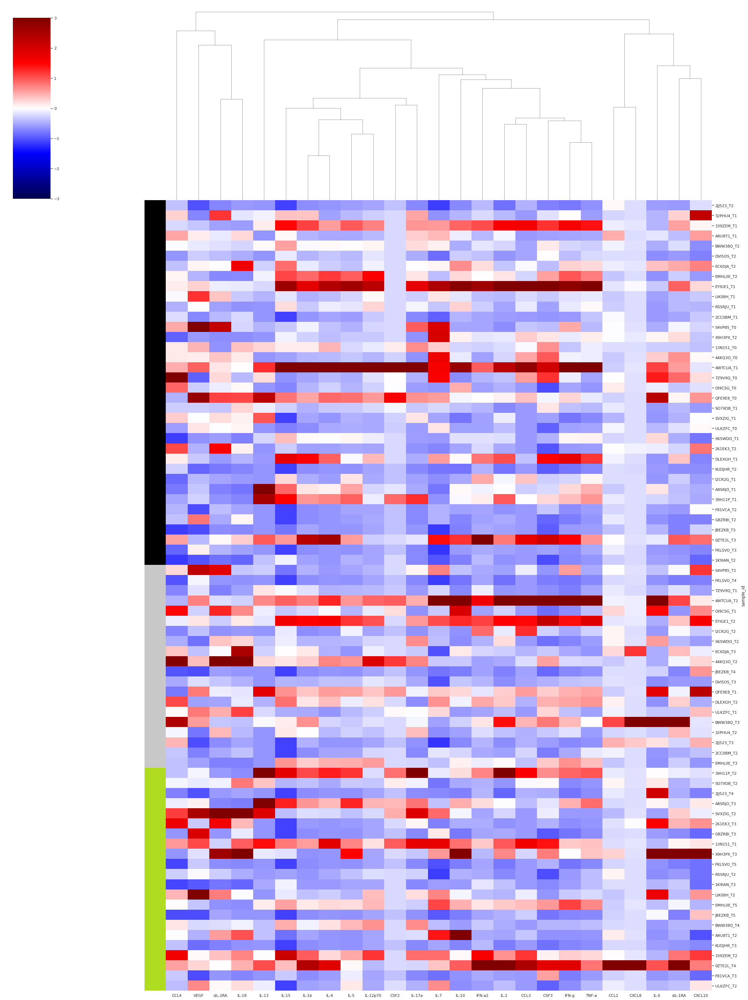

In [50]:
#plot
divnorm = colors.TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3)
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
g = sns.clustermap(JK210728_panel1_2_merge.drop(columns=['timepoint']), cmap='seismic', col_cluster=True,row_cluster=False, figsize=(30,40), 
                   row_colors = JK210728_panel1_2_merge.index.map(time_color_dict), vmax=3, z_score= 1, norm=divnorm) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib


In [51]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,1090.5765,0.0000,2.835,6.700,1.2020,14.665,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.6250,pre
339ZEM_T1,7.120,358.5335,127.360,15.7170,9.5700,60.190,27.6540,1273.495,44.8515,28.660,398.7240,96.6750,12.795,9.220,1.2020,25.805,40.310,639.545,65.930,127.770,7.4590,137.2885,13.3020,421.075,25.2875,pre
ARU8T1_T1,16.290,928.7005,27.710,1.5055,3.2385,7.510,25.3615,408.435,11.8155,2.730,564.5060,0.0000,5.345,0.000,1.2020,3.590,3.330,1526.865,6.365,210.905,5.6230,474.7030,23.9155,184.225,2.1830,pre
BWW38Q_T2,5.805,366.8295,66.330,3.9775,2.5765,14.325,20.9720,585.545,22.6605,5.730,171.5615,3.9975,2.415,8.240,1.2020,9.280,15.860,1443.540,35.600,166.715,5.1000,281.3325,16.2090,269.890,11.6395,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KUDJHR_T3,2.515,248.6855,10.975,1.5520,0.5635,2.865,13.0670,192.520,0.7155,0.570,159.1515,0.0000,0.690,0.000,0.0000,0.000,0.000,211.905,0.000,35.355,0.0000,106.0390,11.1910,0.000,0.0000,post2
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,757.1800,77.2675,6.430,7.695,1.2020,23.635,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.0610,post2
0ZTE2L_T4,53.600,8700.6275,163.585,54.9875,16.9385,66.745,24.4230,4285.820,5423.5185,20.885,625.4080,133.4185,13.240,21.125,1.2020,44.505,16.565,1849.765,135.330,236.860,2.5185,568.3330,24.0920,243.665,2.4935,post2


## Hierarchically clustered z scored

In [52]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,1090.5765,0.0000,2.835,6.700,1.2020,14.665,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.6250,pre
339ZEM_T1,7.120,358.5335,127.360,15.7170,9.5700,60.190,27.6540,1273.495,44.8515,28.660,398.7240,96.6750,12.795,9.220,1.2020,25.805,40.310,639.545,65.930,127.770,7.4590,137.2885,13.3020,421.075,25.2875,pre
ARU8T1_T1,16.290,928.7005,27.710,1.5055,3.2385,7.510,25.3615,408.435,11.8155,2.730,564.5060,0.0000,5.345,0.000,1.2020,3.590,3.330,1526.865,6.365,210.905,5.6230,474.7030,23.9155,184.225,2.1830,pre
BWW38Q_T2,5.805,366.8295,66.330,3.9775,2.5765,14.325,20.9720,585.545,22.6605,5.730,171.5615,3.9975,2.415,8.240,1.2020,9.280,15.860,1443.540,35.600,166.715,5.1000,281.3325,16.2090,269.890,11.6395,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KUDJHR_T3,2.515,248.6855,10.975,1.5520,0.5635,2.865,13.0670,192.520,0.7155,0.570,159.1515,0.0000,0.690,0.000,0.0000,0.000,0.000,211.905,0.000,35.355,0.0000,106.0390,11.1910,0.000,0.0000,post2
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,757.1800,77.2675,6.430,7.695,1.2020,23.635,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.0610,post2
0ZTE2L_T4,53.600,8700.6275,163.585,54.9875,16.9385,66.745,24.4230,4285.820,5423.5185,20.885,625.4080,133.4185,13.240,21.125,1.2020,44.505,16.565,1849.765,135.330,236.860,2.5185,568.3330,24.0920,243.665,2.4935,post2


In [53]:
JK210728_panel1_2_merge[JK210728_panel1_2_merge['timepoint']=='pre']

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,1090.5765,0.0000,2.835,6.700,1.2020,14.665,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.6250,pre
339ZEM_T1,7.120,358.5335,127.360,15.7170,9.5700,60.190,27.6540,1273.495,44.8515,28.660,398.7240,96.6750,12.795,9.220,1.2020,25.805,40.310,639.545,65.930,127.770,7.4590,137.2885,13.3020,421.075,25.2875,pre
ARU8T1_T1,16.290,928.7005,27.710,1.5055,3.2385,7.510,25.3615,408.435,11.8155,2.730,564.5060,0.0000,5.345,0.000,1.2020,3.590,3.330,1526.865,6.365,210.905,5.6230,474.7030,23.9155,184.225,2.1830,pre
BWW38Q_T2,5.805,366.8295,66.330,3.9775,2.5765,14.325,20.9720,585.545,22.6605,5.730,171.5615,3.9975,2.415,8.240,1.2020,9.280,15.860,1443.540,35.600,166.715,5.1000,281.3325,16.2090,269.890,11.6395,pre
DVI5OS_T2,0.000,256.6990,59.440,1.9705,1.1425,10.655,9.0045,228.785,7.5240,6.535,150.7610,3.9975,3.890,0.000,1.2020,3.355,5.685,999.225,15.475,138.280,1.1860,182.6455,7.6295,158.000,7.4300,pre
EC6DJA_T2,32.610,356.5810,36.900,7.4550,2.1770,27.265,20.8025,1218.270,51.9325,12.590,618.6945,25.0550,11.165,4.345,1.2020,7.850,6.970,1810.995,18.460,200.810,4.0265,1084.6205,11.1705,318.590,8.6425,pre
EMHL0E_T2,0.155,126.3570,90.500,5.5820,4.0725,45.270,15.1030,492.345,10.2405,20.260,192.3700,15.2630,7.805,6.885,1.2020,22.435,39.250,325.200,97.350,110.230,4.8765,87.7600,17.2520,357.155,41.8225,pre
EYIGE1_T1,10.880,316.1315,301.835,31.5150,16.5840,91.120,51.4970,1621.080,159.3440,78.255,452.9100,170.5485,27.735,5.060,1.2020,36.445,80.810,1588.970,164.265,241.415,14.1825,321.3775,17.7695,610.305,56.7600,pre


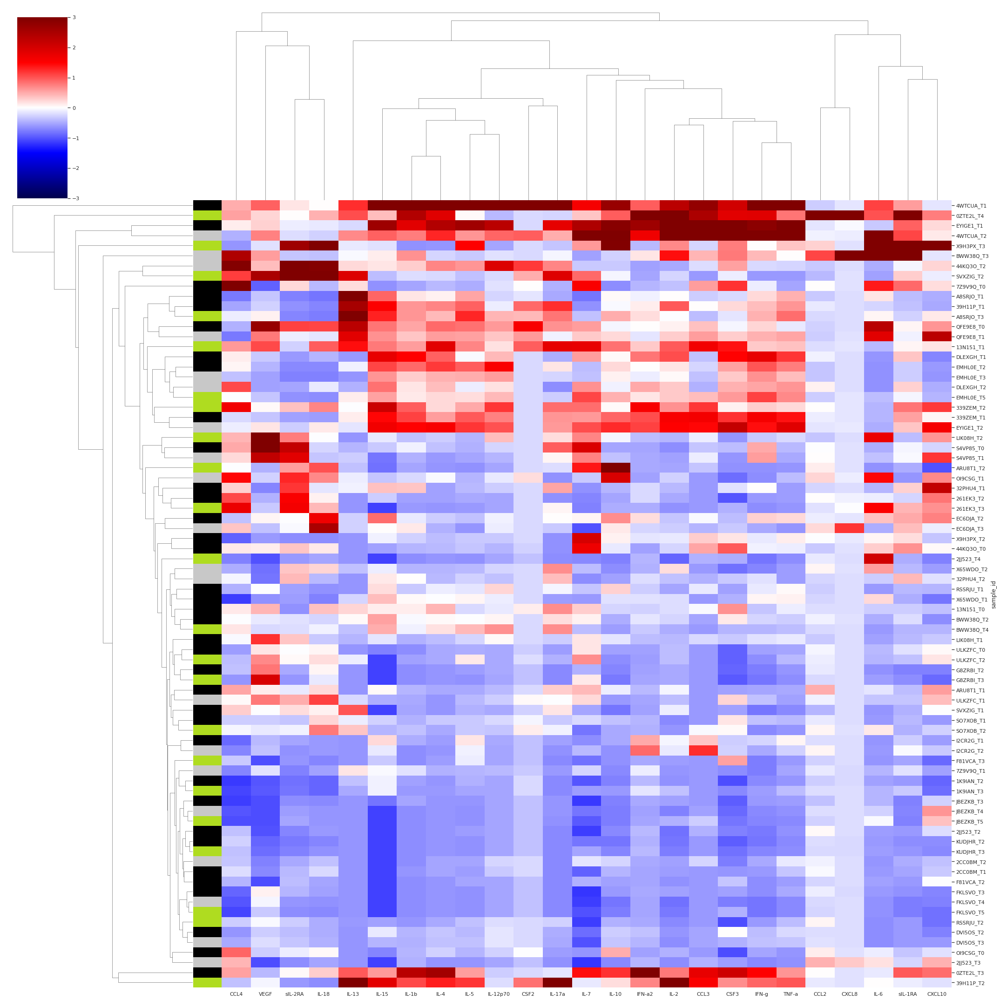

In [54]:
#plot hierarchically clustered
divnorm = colors.TwoSlopeNorm(vmin=-3, vcenter=0, vmax=3)
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
g = sns.clustermap(JK210728_panel1_2_merge.drop(columns=['timepoint']), cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = JK210728_panel1_2_merge.index.map(time_color_dict), vmax=3, z_score= 1, norm=divnorm) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib


## log1p transformed hierarchically clustered

In [55]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,1090.5765,0.0000,2.835,6.700,1.2020,14.665,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.6250,pre
339ZEM_T1,7.120,358.5335,127.360,15.7170,9.5700,60.190,27.6540,1273.495,44.8515,28.660,398.7240,96.6750,12.795,9.220,1.2020,25.805,40.310,639.545,65.930,127.770,7.4590,137.2885,13.3020,421.075,25.2875,pre
ARU8T1_T1,16.290,928.7005,27.710,1.5055,3.2385,7.510,25.3615,408.435,11.8155,2.730,564.5060,0.0000,5.345,0.000,1.2020,3.590,3.330,1526.865,6.365,210.905,5.6230,474.7030,23.9155,184.225,2.1830,pre
BWW38Q_T2,5.805,366.8295,66.330,3.9775,2.5765,14.325,20.9720,585.545,22.6605,5.730,171.5615,3.9975,2.415,8.240,1.2020,9.280,15.860,1443.540,35.600,166.715,5.1000,281.3325,16.2090,269.890,11.6395,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KUDJHR_T3,2.515,248.6855,10.975,1.5520,0.5635,2.865,13.0670,192.520,0.7155,0.570,159.1515,0.0000,0.690,0.000,0.0000,0.000,0.000,211.905,0.000,35.355,0.0000,106.0390,11.1910,0.000,0.0000,post2
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,757.1800,77.2675,6.430,7.695,1.2020,23.635,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.0610,post2
0ZTE2L_T4,53.600,8700.6275,163.585,54.9875,16.9385,66.745,24.4230,4285.820,5423.5185,20.885,625.4080,133.4185,13.240,21.125,1.2020,44.505,16.565,1849.765,135.330,236.860,2.5185,568.3330,24.0920,243.665,2.4935,post2


In [56]:
#log transform
#JK210728_panel1_2_merge = JK210728_panel1_2_merge.drop(columns=['sample_id'])
JK210728_panel1_2_merge_log = JK210728_panel1_2_merge.drop(columns=['timepoint']).applymap(lambda x: math.log(x+1,10))

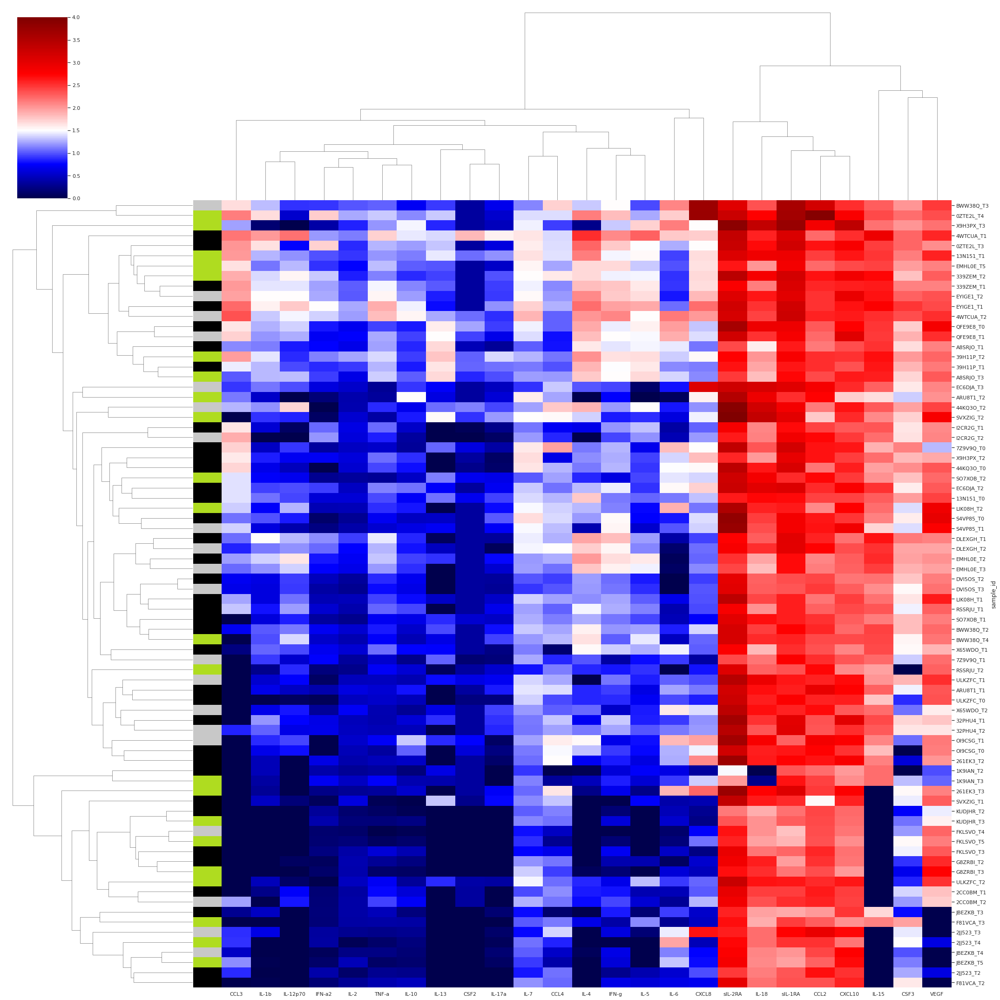

In [57]:
#plot log1p transformed
divnorm = colors.TwoSlopeNorm(vmin=0, vcenter=1.5, vmax=4)
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
g = sns.clustermap(JK210728_panel1_2_merge_log, cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = JK210728_panel1_2_merge.index.map(time_color_dict), z_score= None, norm=divnorm) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib


## Normalized (subtract log1p transformed)

In [58]:
JK210728_panel1_2_merge

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,2.650,488.8080,16.810,1.4880,0.3160,0.910,5.4560,211.265,8.5400,0.930,318.7520,6.3850,0.835,0.000,0.0000,0.000,1.640,296.690,0.000,3.220,0.0000,133.4630,11.2650,0.000,0.0000,pre
32PHU4_T1,7.350,220.2825,49.300,3.4130,1.9255,20.810,11.7625,1017.605,14.1130,1.595,1090.5765,0.0000,2.835,6.700,1.2020,14.665,5.810,4373.180,3.930,60.290,6.9550,315.6115,20.2830,239.920,4.6250,pre
339ZEM_T1,7.120,358.5335,127.360,15.7170,9.5700,60.190,27.6540,1273.495,44.8515,28.660,398.7240,96.6750,12.795,9.220,1.2020,25.805,40.310,639.545,65.930,127.770,7.4590,137.2885,13.3020,421.075,25.2875,pre
ARU8T1_T1,16.290,928.7005,27.710,1.5055,3.2385,7.510,25.3615,408.435,11.8155,2.730,564.5060,0.0000,5.345,0.000,1.2020,3.590,3.330,1526.865,6.365,210.905,5.6230,474.7030,23.9155,184.225,2.1830,pre
BWW38Q_T2,5.805,366.8295,66.330,3.9775,2.5765,14.325,20.9720,585.545,22.6605,5.730,171.5615,3.9975,2.415,8.240,1.2020,9.280,15.860,1443.540,35.600,166.715,5.1000,281.3325,16.2090,269.890,11.6395,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KUDJHR_T3,2.515,248.6855,10.975,1.5520,0.5635,2.865,13.0670,192.520,0.7155,0.570,159.1515,0.0000,0.690,0.000,0.0000,0.000,0.000,211.905,0.000,35.355,0.0000,106.0390,11.1910,0.000,0.0000,post2
339ZEM_T2,6.915,466.2790,63.500,21.1130,5.9595,27.710,30.9525,1505.335,46.4035,12.560,757.1800,77.2675,6.430,7.695,1.2020,23.635,28.610,2624.300,46.430,196.375,8.8035,677.9160,39.7390,527.635,34.0610,post2
0ZTE2L_T4,53.600,8700.6275,163.585,54.9875,16.9385,66.745,24.4230,4285.820,5423.5185,20.885,625.4080,133.4185,13.240,21.125,1.2020,44.505,16.565,1849.765,135.330,236.860,2.5185,568.3330,24.0920,243.665,2.4935,post2


In [59]:
#log transform
columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in JK210728_panel1_2_merge.columns]
JK210728_panel1_2_merge_log = JK210728_panel1_2_merge.drop(columns=columns_to_drop).applymap(lambda x: math.log(x+1,10))

In [60]:
JK210728_panel1_2_merge_log['timepoint'] = JK210728_panel1_2_merge_log.index.map(time_dict)

In [61]:
#normalize to d0 (substract) 
normalized_df = pd.DataFrame(columns= JK210728_panel1_2_merge_log.columns)
JK210728_panel1_2_merge_log['sample_id'] = JK210728_panel1_2_merge_log.index.str.slice(stop=-3)
#loop over and select sample by sample id
for i in set(JK210728_panel1_2_merge_log['sample_id']):
  JK210728_panel1_2_merge_subset = JK210728_panel1_2_merge_log[JK210728_panel1_2_merge_log['sample_id'] == i]  #subset to patient of interest
  JK210728_panel1_2_merge_subset_pre = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='pre'].drop(columns=['timepoint','sample_id']).iloc[0,:] #subset to pre sample
  #subset post1 log1p and substract log1p pre sample
  if 'post1' in list(JK210728_panel1_2_merge_subset['timepoint']) and 'post2' in list(JK210728_panel1_2_merge_subset['timepoint']):
      JK210728_panel1_2_merge_subset_post1 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].index[0],:] = JK210728_panel1_2_merge_subset_post1
      JK210728_panel1_2_merge_subset_post2 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].index[0],:] = JK210728_panel1_2_merge_subset_post2
  #subset post1 log1p and substract log2p pre sample
  elif 'post1' in list(JK210728_panel1_2_merge_subset['timepoint']):
      JK210728_panel1_2_merge_subset_post1 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post1'].index[0],:] = JK210728_panel1_2_merge_subset_post1
  elif 'post2' in list(JK210728_panel1_2_merge_subset['timepoint']):
      JK210728_panel1_2_merge_subset_post2 = JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].drop(columns=['timepoint','sample_id']).iloc[0,:].subtract(JK210728_panel1_2_merge_subset_pre)
      normalized_df.loc[JK210728_panel1_2_merge_subset[JK210728_panel1_2_merge_subset['timepoint']=='post2'].index[0],:] = JK210728_panel1_2_merge_subset_post2
  else:
    print('no post sample detected')

In [62]:
normalized_df = normalized_df.astype(float)

In [63]:
normalized_df

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
X9H3PX_T3,0.762849,0.196492,0.175826,-0.324478,0.248751,0.079062,-0.208973,0.788422,-0.311893,0.106653,0.945362,-0.368595,0.581057,0.857332,0.000000,-0.678666,0.791631,1.311889,-0.898542,0.286896,0.378326,1.361211,0.285902,-0.036909,-0.703033,NaN
QFE9E8_T1,-0.074541,-0.075651,0.131326,-0.107390,0.061333,0.074576,-0.057549,-0.065735,0.070329,0.308604,0.281716,0.083251,0.113769,-0.073450,-0.282265,-0.073074,-0.095890,-0.421907,-0.101347,-0.314238,-0.277739,-0.416846,-0.248748,-0.036226,-0.111204,NaN
EC6DJA_T3,-0.723011,0.279339,0.037679,-0.307968,0.030928,-0.498941,-0.443222,-0.036277,1.355735,-0.830023,-0.242818,-0.506014,-0.181751,0.000000,0.000000,0.149445,-0.775977,-0.020578,-0.290448,-0.206334,-0.210114,0.118217,0.258543,-0.240413,-0.006763,NaN
0ZTE2L_T4,0.479154,1.269987,-0.031387,0.017692,0.378493,0.057676,-0.188519,0.413466,2.220757,0.058545,-0.020245,0.111303,-0.054931,0.013658,0.000000,0.009114,-0.247274,-0.015773,-0.107851,0.311115,-0.063823,0.056335,0.001040,-0.058167,-0.210475,NaN
13N151_T1,-0.162433,0.003851,0.159718,0.409321,0.333605,0.360173,0.248158,0.207546,0.346720,0.229143,0.207562,0.583519,0.405499,0.353607,0.388152,0.196149,0.484442,0.478517,0.366143,0.151669,0.234543,0.159812,0.134077,0.190108,0.218599,NaN
4WTCUA_T2,0.385014,0.350495,0.117147,0.159948,0.090921,0.031913,0.240661,0.138951,0.250151,0.092658,0.102995,0.176530,0.119167,-0.145690,-0.772665,-0.657120,-0.755769,-0.184702,-0.517781,-0.041785,-0.688440,-0.160485,-0.351680,-0.387251,-0.717565,NaN
SO7XOB_T2,0.966306,0.205750,-0.037823,-0.054615,0.056148,-0.464771,-0.240895,-0.049231,0.643263,-0.386862,0.174675,1.411855,-0.134877,0.251227,0.128216,0.131888,0.003146,0.192860,-0.396508,0.083618,0.139529,0.165719,0.099668,-0.088551,-0.149669,NaN
DLEXGH_T2,-0.241909,0.147809,-0.226834,-0.098017,-0.173723,-0.275276,0.014315,-0.025451,0.127347,-0.145389,0.180392,-0.225710,-0.058967,0.409155,0.000000,-0.403164,-0.060590,0.072883,-0.185457,-0.175600,-0.280167,0.218516,0.238579,-0.169902,-0.118354,NaN
SVXZIG_T2,0.227473,0.237720,0.283766,0.043060,-0.065026,0.826075,0.355752,0.463369,1.023902,0.332716,-0.030998,0.000000,0.825101,0.187728,0.633921,0.388860,0.153293,0.754886,1.371068,0.532600,0.428910,0.712956,0.190773,2.068613,0.659879,NaN
1K9IAN_T3,0.280945,0.221292,1.310162,0.295478,0.177071,0.244147,0.219964,0.339038,1.013763,0.376886,0.062369,0.000000,0.225779,-0.237723,0.000000,-0.091314,-0.170933,0.521074,0.443041,0.065839,0.000000,0.267758,0.319314,0.000482,0.000000,NaN


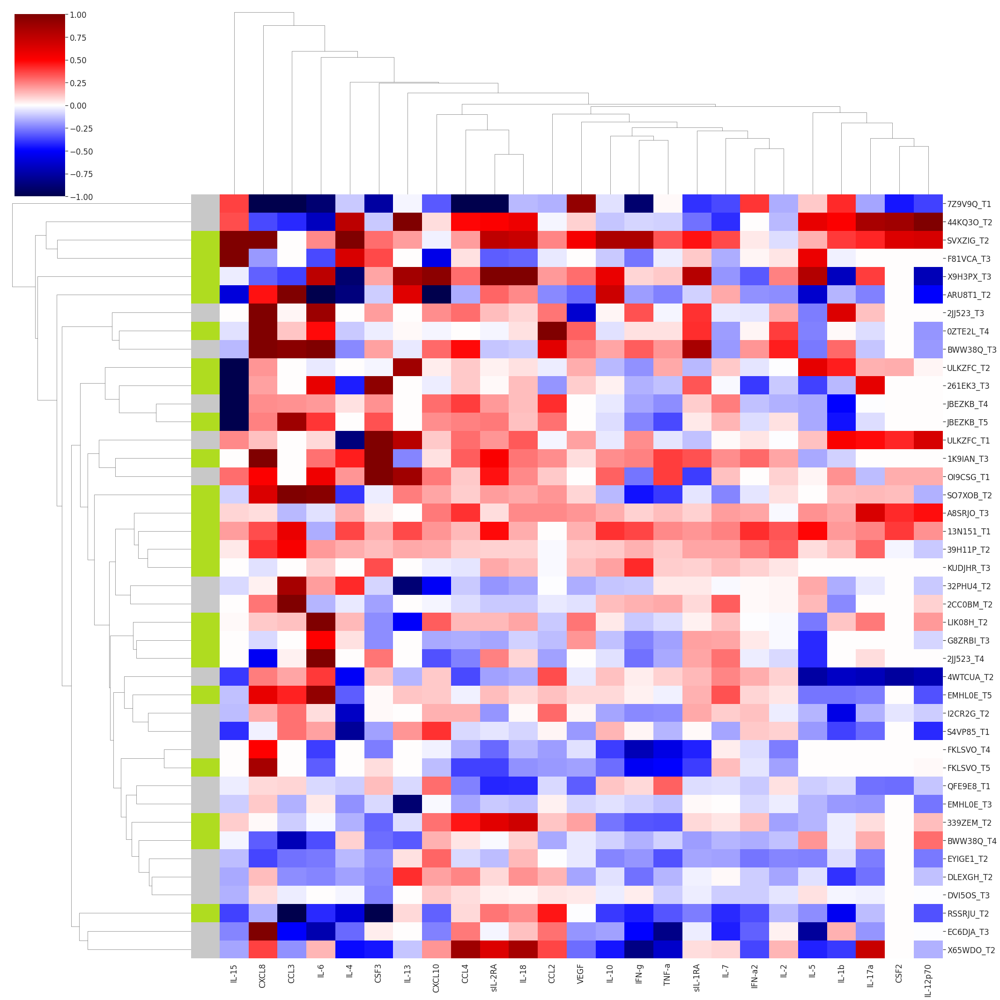

In [64]:
#plot log1p normalized to pre (subtracted)
divnorm = colors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
sns.set(font_scale = 1.5) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
columns_to_drop = [x for x in ['timepoint','patient_id'] if x in normalized_df.columns]
g = sns.clustermap(normalized_df.drop(columns=columns_to_drop), cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = normalized_df.index.map(time_color_dict), z_score= None, norm=divnorm
                   ) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib


# Plot neutralizing antibody concentrations

In [ ]:
#color codes
vaccine_type_dict = {'Comirnaty':blue_blue_red_grey[0],'Moderna':blue_blue_red_grey[1], 'Astra Zeneca':blue_blue_red_grey[2],'heterologous':blue_blue_red_grey[3],'not_defined':'#000000'}

In [ ]:
df = patient_table
#df_save_path = covid_2nd_dose_leuko_path

#function to define nans
def isna(x):
  return x!=x

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if isna(a):
    vaccine_type[i]='NA'
  elif isna(b):
    vaccine_type[i]=a
  elif a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df.index.map(vaccine_type)
#df.to_csv(df_save_path)
df

,Sex,Age_at_inclusion,BMI,Tumor_type,Stage,Therapy_type,vaccinated,First_dose_date,First_dose_vaccine,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,Therapy_Line,color_code,vaccine_type
Patient_ID,,,,,,,,,,,,,,,,,,,
MXSP3T,F,50,29.8,UVM,IV,PD-1,False,NaN,NaN,NaN,NaN,7/13/2020,1/21/2021,8/21/2021,404,NaN,1,#8E2BDD,NA
LH6ZAL,F,64,NaN,ACC,IV,PD-1,False,NaN,NaN,NaN,NaN,7/17/2020,5/6/2021,10/1/2021,441,NaN,2,#6AD4DB,NA
D9SB9D,M,66,NaN,SKCM,IV,CTLA-4/PD-1,False,NaN,NaN,NaN,NaN,7/27/2020,1/29/2021,10/1/2021,431,NaN,1,#513FAA,NA
7O6TMW,M,40,NaN,SKCM,IIIC,CTLA-4/PD-1,False,NaN,NaN,NaN,NaN,8/18/2020,4/21/2021,10/1/2021,409,NaN,1,#61381D,NA
V8LVB1,M,67,20.8,SKCM,IIB,CTLA-4/PD-1,False,NaN,NaN,NaN,NaN,9/16/2020,2/19/2021,8/7/2021,325,NaN,3,#CAB8CD,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
J79PAG,M,70,21.3,LIHC,IV,PD-L1/MAB,True,4/23/2021,Comirnaty,6/6/2021,Comirnaty,4/30/2021,10/1/2021,10/1/2021,154,161.0,1,#E20DC4,Comirnaty
9R3KE7,F,62,NaN,UVM,<IV,PD-1,True,4/7/2021,Comirnaty,5/4/2021,Comirnaty,5/19/2021,10/1/2021,10/1/2021,135,177.0,1,#8F25FC,Comirnaty
19U0MP,M,65,26.2,UVM,IV,PD-1,True,4/29/2021,Comirnaty,6/8/2021,Comirnaty,5/20/2021,8/12/2021,10/1/2021,134,155.0,1,#42A0D7,Comirnaty


In [ ]:
#add vaccine info
covid_antibody_df['patient'] = covid_antibody_df.index.str.slice(stop=-3)
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient
sample,,,,
0ZTE2L_T3,3848559.0,pre,-6,0ZTE2L
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L
13N151_T0,5959513.0,pre,-9,13N151
13N151_T1,52690692.0,post2,33,13N151
13N151_T2,8442583.0,post2,162,13N151
...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV
X65WDO_T1,25620432.0,pre,-81,X65WDO
X65WDO_T3,8506702.5,post2,106,X65WDO


In [ ]:
#add vaccine info
covid_antibody_df['vaccine_type'] = covid_antibody_df['patient'].map(vaccine_type)
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type
sample,,,,,
0ZTE2L_T3,3848559.0,pre,-6,0ZTE2L,Comirnaty
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty
13N151_T0,5959513.0,pre,-9,13N151,Comirnaty
13N151_T1,52690692.0,post2,33,13N151,Comirnaty
13N151_T2,8442583.0,post2,162,13N151,Comirnaty
...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty
X65WDO_T1,25620432.0,pre,-81,X65WDO,Comirnaty
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty


In [ ]:
#set all pre vaccination timepoints to 0

for i in covid_antibody_df.index:
  if covid_antibody_df.loc[i,'timepoint'] == 'pre':
    covid_antibody_df.loc[i,'time_from_vacc'] = 0
  
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type
sample,,,,,
0ZTE2L_T3,3848559.0,pre,0,0ZTE2L,Comirnaty
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty
13N151_T0,5959513.0,pre,0,13N151,Comirnaty
13N151_T1,52690692.0,post2,33,13N151,Comirnaty
13N151_T2,8442583.0,post2,162,13N151,Comirnaty
...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty
X65WDO_T1,25620432.0,pre,0,X65WDO,Comirnaty
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty


In [ ]:
#log1p_transform
covid_antibody_df['neut_antibody_pg_ml_log'] = covid_antibody_df['neut_antibody_pg_ml'].apply(lambda x: math.log(x+1,10))
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type,neut_antibody_pg_ml_log
sample,,,,,,
0ZTE2L_T3,3848559.0,pre,0,0ZTE2L,Comirnaty,6.585298
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty,6.859206
13N151_T0,5959513.0,pre,0,13N151,Comirnaty,6.775211
13N151_T1,52690692.0,post2,33,13N151,Comirnaty,7.721734
13N151_T2,8442583.0,post2,162,13N151,Comirnaty,6.926475
...,...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty,7.081414
X65WDO_T1,25620432.0,pre,0,X65WDO,Comirnaty,7.408586
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty,6.929761


(5.0, 9.0)

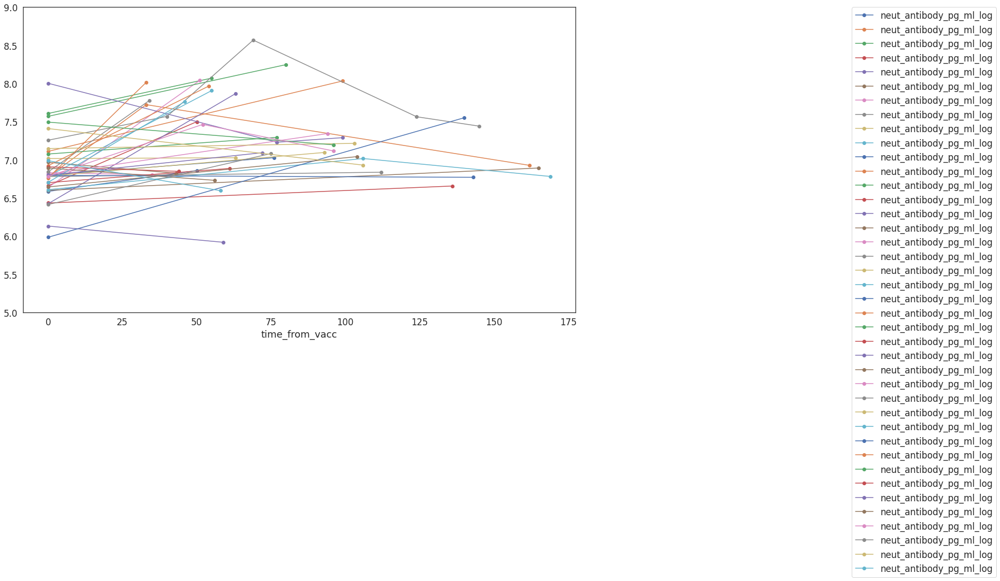

In [ ]:
sns.set_style('white')
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
covid_antibody_df.groupby("patient").plot(x="time_from_vacc", y="neut_antibody_pg_ml_log", marker="o", ax=ax)
ax.legend(list(set(covid_antibody_df['patient'])))
plt.legend(bbox_to_anchor=(1.5,1),loc=2,borderaxespad=0)
plt.axhline(linewidth=2, color='#000000',y=1)
ax.set_ylim([5, 9])


In [ ]:
covid_antibody_df['neut_antibody_ug_ml'] = covid_antibody_df['neut_antibody_pg_ml']/1000000
covid_antibody_df

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type,neut_antibody_pg_ml_log,neut_antibody_ug_ml
sample,,,,,,,
0ZTE2L_T3,3848559.0,pre,0,0ZTE2L,Comirnaty,6.585298,3.848559
0ZTE2L_T4,7231127.0,post2,50,0ZTE2L,Comirnaty,6.859206,7.231127
13N151_T0,5959513.0,pre,0,13N151,Comirnaty,6.775211,5.959513
13N151_T1,52690692.0,post2,33,13N151,Comirnaty,7.721734,52.690692
13N151_T2,8442583.0,post2,162,13N151,Comirnaty,6.926475,8.442583
...,...,...,...,...,...,...,...
VMQLNV_T7,12061851.5,post2,75,VMQLNV,Comirnaty,7.081414,12.061851
X65WDO_T1,25620432.0,pre,0,X65WDO,Comirnaty,7.408586,25.620432
X65WDO_T3,8506702.5,post2,106,X65WDO,Comirnaty,6.929761,8.506702


In [ ]:
min(covid_antibody_df['neut_antibody_ug_ml'])

0.8291695

In [ ]:
covid_antibody_df[covid_antibody_df['neut_antibody_ug_ml']==369.426283]

,neut_antibody_pg_ml,timepoint,time_from_vacc,patient,vaccine_type,neut_antibody_pg_ml_log,neut_antibody_ug_ml
sample,,,,,,,
DEW6IM_T3,369426283.0,post2,69,DEW6IM,Comirnaty,8.567528,369.426283


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

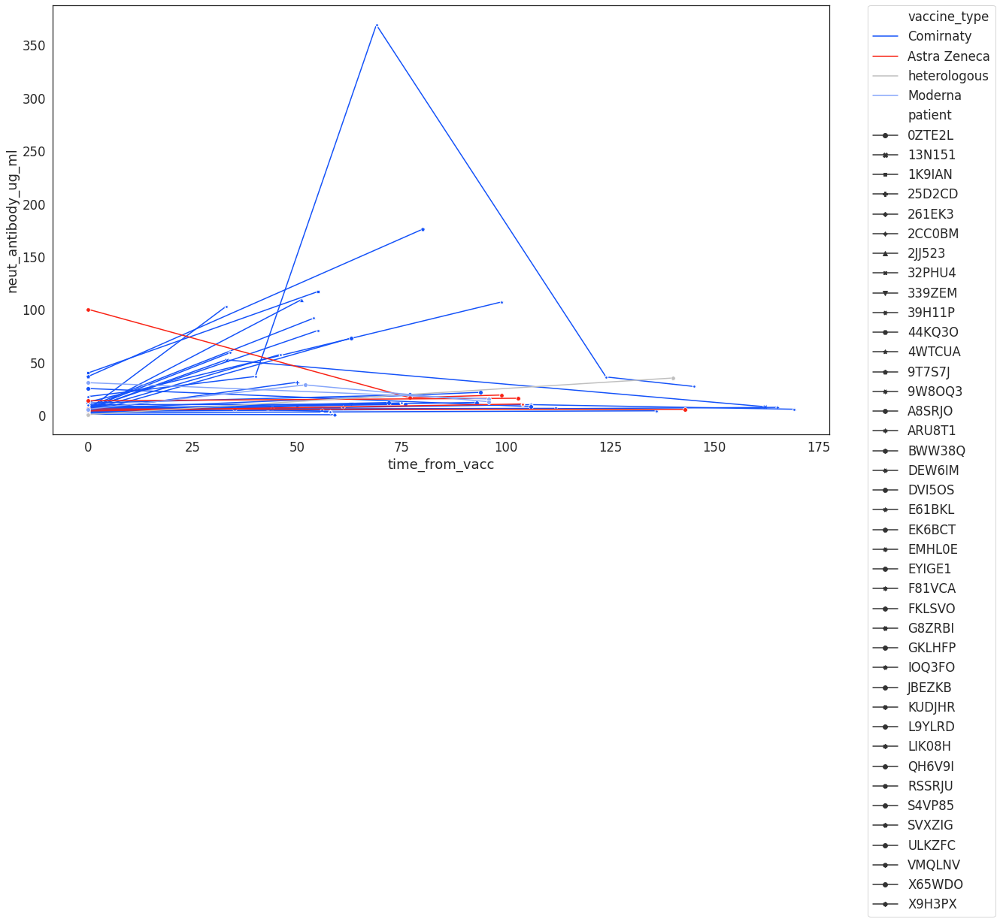

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors
save_name = 'neutralizing_antibodies.svg'


#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df[covid_antibody_df['time_from_vacc']==0]['patient'])
covid_antibody_df_with_baseline = covid_antibody_df[covid_antibody_df['patient'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=True, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
#plt.ylim(0,5)
#plt.xlim(0,30)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_name)
files.download(save_name) 

In [ ]:
#normalize to pre
covid_antibody_df_normalized_list = []
for i in set(covid_antibody_df['patient']):
  covid_antibody_df_subset = covid_antibody_df[covid_antibody_df['patient']==i]
  covid_antibody_df_pre = covid_antibody_df_subset[covid_antibody_df_subset['timepoint']=='pre']['neut_antibody_ug_ml']
  covid_antibody_df_subset_normalized = covid_antibody_df_subset['neut_antibody_ug_ml'].apply(lambda x: x/covid_antibody_df_pre[0])
  covid_antibody_df_normalized_list.append(covid_antibody_df_subset_normalized)

  #concatenate series
covid_antibody_df_normalized = pd.concat(covid_antibody_df_normalized_list)
covid_antibody_df_normalized = pd.DataFrame(covid_antibody_df_normalized)
covid_antibody_df_normalized['patient'] = covid_antibody_df_normalized.index.str.slice(stop=-3)
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient
sample,,
9T7S7J_T1,1.000000,9T7S7J
9T7S7J_T3,4.752650,9T7S7J
25D2CD_T1,1.000000,25D2CD
25D2CD_T3,6.906252,25D2CD
G8ZRBI_T2,1.000000,G8ZRBI
...,...,...
S4VP85_T2,1.965560,S4VP85
VMQLNV_T5,1.000000,VMQLNV
VMQLNV_T7,4.653322,VMQLNV


In [ ]:
#add time 
covid_antibody_df_normalized['time_from_vacc'] =  covid_antibody_df_normalized.index.map(covid_antibody_timepoints_time_dict)
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient,time_from_vacc
sample,,,
9T7S7J_T1,1.000000,9T7S7J,-165
9T7S7J_T3,4.752650,9T7S7J,80
25D2CD_T1,1.000000,25D2CD,-129
25D2CD_T3,6.906252,25D2CD,50
G8ZRBI_T2,1.000000,G8ZRBI,-7
...,...,...,...
S4VP85_T2,1.965560,S4VP85,72
VMQLNV_T5,1.000000,VMQLNV,-70
VMQLNV_T7,4.653322,VMQLNV,75


In [ ]:
covid_antibody_df_normalized['neut_antibody_lg_fc'] = covid_antibody_df_normalized['neut_antibody_ug_ml'].apply(lambda x: math.log(x+1,10))
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient,time_from_vacc,neut_antibody_lg_fc
sample,,,,
9T7S7J_T1,1.000000,9T7S7J,-165,0.301030
9T7S7J_T3,4.752650,9T7S7J,80,0.759868
25D2CD_T1,1.000000,25D2CD,-129,0.301030
25D2CD_T3,6.906252,25D2CD,50,0.897971
G8ZRBI_T2,1.000000,G8ZRBI,-7,0.301030
...,...,...,...,...
S4VP85_T2,1.965560,S4VP85,72,0.472107
VMQLNV_T5,1.000000,VMQLNV,-70,0.301030
VMQLNV_T7,4.653322,VMQLNV,75,0.752304


In [ ]:
#set all pre vaccination timepoints to 0

for i in covid_antibody_df_normalized.index:
  if covid_antibody_df_normalized.loc[i,'time_from_vacc'] < 0:
    covid_antibody_df_normalized.loc[i,'time_from_vacc'] = 0
  
covid_antibody_df_normalized

,neut_antibody_ug_ml,patient,time_from_vacc,neut_antibody_lg_fc
sample,,,,
9T7S7J_T1,1.000000,9T7S7J,0,0.301030
9T7S7J_T3,4.752650,9T7S7J,80,0.759868
25D2CD_T1,1.000000,25D2CD,0,0.301030
25D2CD_T3,6.906252,25D2CD,50,0.897971
G8ZRBI_T2,1.000000,G8ZRBI,0,0.301030
...,...,...,...,...
S4VP85_T2,1.965560,S4VP85,72,0.472107
VMQLNV_T5,1.000000,VMQLNV,0,0.301030
VMQLNV_T7,4.653322,VMQLNV,75,0.752304


In [ ]:
#add vaccine type
covid_antibody_df_normalized['vaccine_type'] = covid_antibody_df_normalized['patient'].map(vaccine_type)
covid_antibody_df_normalized['vaccine_type']

sample
9T7S7J_T1       Comirnaty
9T7S7J_T3       Comirnaty
25D2CD_T1       Comirnaty
25D2CD_T3       Comirnaty
G8ZRBI_T2    Astra Zeneca
                 ...     
S4VP85_T2       Comirnaty
VMQLNV_T5       Comirnaty
VMQLNV_T7       Comirnaty
2JJ523_T2       Comirnaty
2JJ523_T4       Comirnaty
Name: vaccine_type, Length: 87, dtype: object

(-3.0, 7.0)

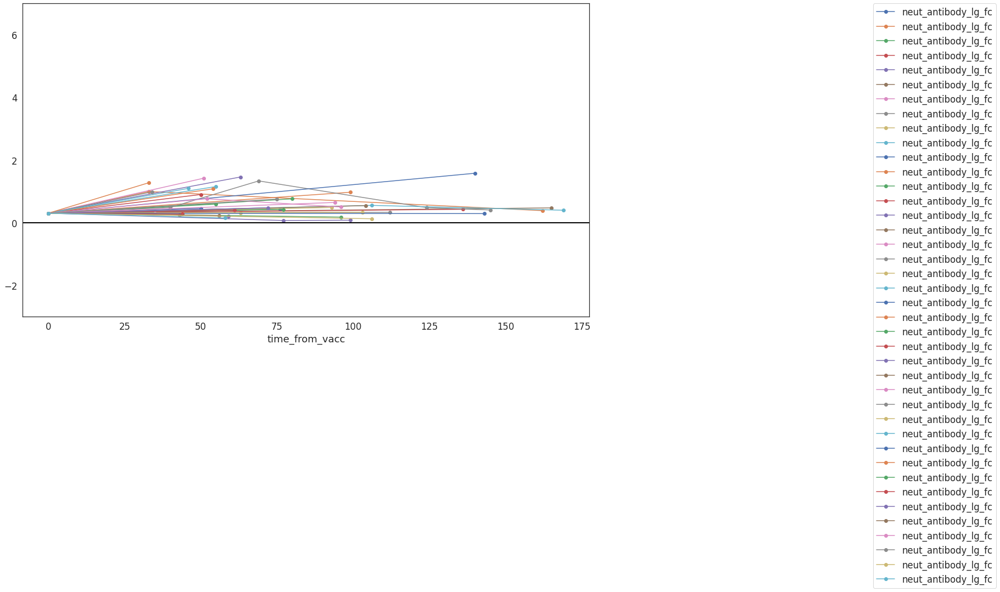

In [ ]:
sns.set_style('white')
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
covid_antibody_df_normalized.groupby("patient").plot(x="time_from_vacc", y="neut_antibody_lg_fc", marker="o", ax=ax)
ax.legend(list(set(covid_antibody_df_normalized['patient'])))
plt.legend(bbox_to_anchor=(1.5,1),loc=2,borderaxespad=0)
plt.axhline(linewidth=2, color='#000000',y=0)
ax.set_ylim([-3, 7])


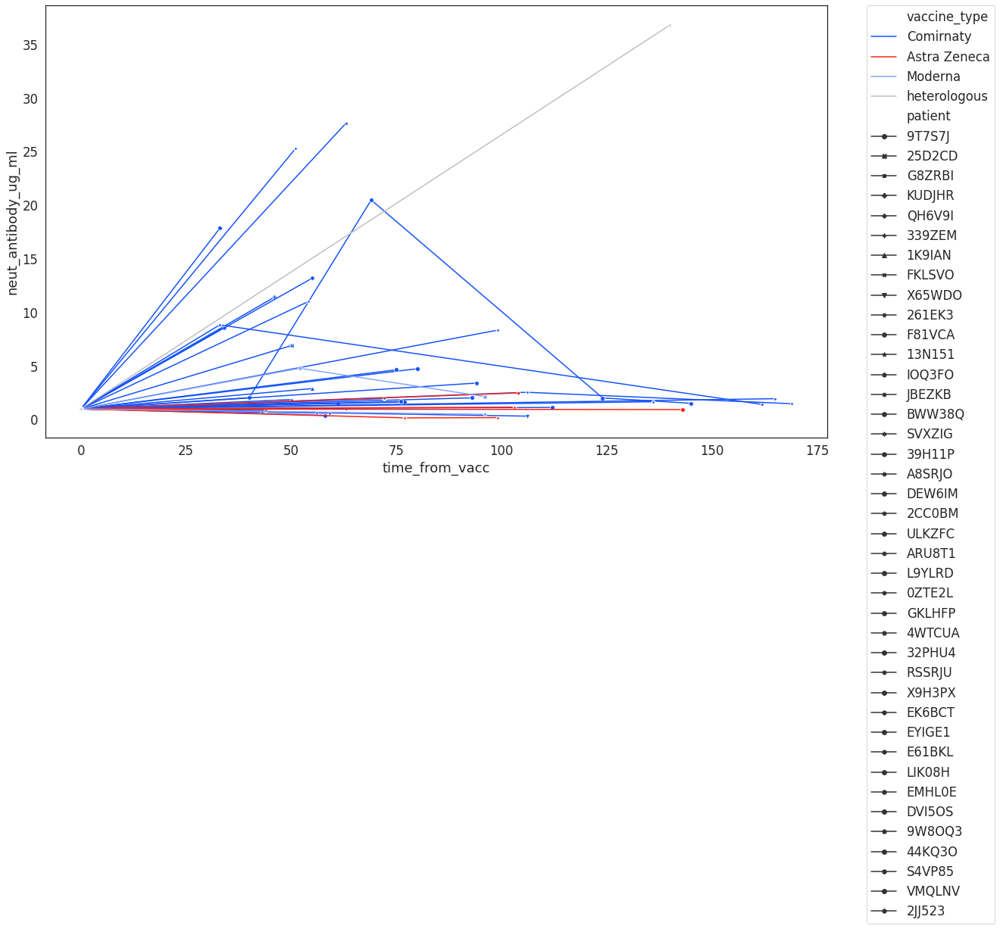

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_antibody_df_normalized[covid_antibody_df_normalized['time_from_vacc']==0]['patient'])
covid_antibody_df_normalized_with_baseline = covid_antibody_df_normalized[covid_antibody_df_normalized['patient'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_antibody_df_normalized_with_baseline,
    x="time_from_vacc", y="neut_antibody_ug_ml", hue="vaccine_type",style="patient",
    markers=True, dashes=False, ax=axis,palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
#plt.ylim(0,5)
#plt.xlim(0,30)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)

In [ ]:
scipy.stats.wilcoxon(covid_antibody_df_normalized_with_baseline['neut_antibody_ug_ml']-1, zero_method='wilcox',correction=False)

WilcoxonResult(statistic=118.0, pvalue=2.3625916352176628e-06)

In [ ]:
#patients with at least 2 fold from baseline:

print('proportion of patients with at least 2fold increase over baseline:', len(set(covid_antibody_df_normalized[covid_antibody_df_normalized['neut_antibody_ug_ml']>2]['patient']))/len(set(covid_antibody_df_normalized['patient'])))
print('proportion of patients with at least 10fold increase over baseline:', len(set(covid_antibody_df_normalized[covid_antibody_df_normalized['neut_antibody_ug_ml']>10]['patient']))/len(set(covid_antibody_df_normalized['patient'])))
print('proportion of patients with at least 20fold increase over baseline:', len(set(covid_antibody_df_normalized[covid_antibody_df_normalized['neut_antibody_ug_ml']>20]['patient']))/len(set(covid_antibody_df_normalized['patient'])))

proportion of patients with at least 2fold increase over baseline: 0.5
proportion of patients with at least 10fold increase over baseline: 0.2
proportion of patients with at least 20fold increase over baseline: 0.1


In [ ]:
len(set(covid_antibody_df_normalized['patient']))

40

# Plot lab values

In [ ]:
vaccine_type_dict = {'Comirnaty':blue_blue_red_grey[0],'Moderna':blue_blue_red_grey[1], 'Astra Zeneca':blue_blue_red_grey[2],'heterologous':blue_blue_red_grey[3],'not_defined':'#000000'}

In [ ]:
vaccine_type_dict

{'Astra Zeneca': '#f92214',
 'Comirnaty': '#1452f9',
 'Moderna': '#85a5fa',
 'heterologous': '#bfbfbf',
 'not_defined': '#000000'}

In [ ]:
blue_blue_red_grey

['#1452f9', '#85a5fa', '#f92214', '#bfbfbf']

## Bilirubin

In [ ]:
covid_bilirubin_1st_dose_df[covid_bilirubin_1st_dose_df['vaccine_type']=='not_defined']

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Unnamed: 0.1.1.1.1,Unnamed: 0.1.1.1.1.1,patient_id,vaccine_type,timepoint,Value
190,190,190,190,190,190,190,W0D7T8,not_defined,0,0.8
191,191,191,191,191,191,191,74WACU,not_defined,0,0.6
192,192,192,192,192,192,192,OI9CSG,not_defined,0,0.3
193,193,193,193,193,193,193,W0D7T8,not_defined,26,0.6
194,194,194,194,194,194,194,74WACU,not_defined,0,0.4
195,195,195,195,195,195,195,OI9CSG,not_defined,8,0.9
196,196,196,196,196,196,196,74WACU,not_defined,8,0.3
197,197,197,197,197,197,197,OI9CSG,not_defined,20,1.6


In [ ]:
#create dictionary patient:color code with color code for vaccines


df_subset = covid_bilirubin_1st_dose_df[['patient_id','vaccine_type']]
df_subset = df_subset.set_index('patient_id')
df_subset.loc[:,'vaccine_type'] = df_subset.loc[:,'vaccine_type'].map(vaccine_type_dict)
patient_vaccine_type_color_dict = df_subset.to_dict()
patient_vaccine_type_color_dict

{'vaccine_type': {'0ZTE2L': '#1452f9',
  '13N151': '#1452f9',
  '19U0MP': '#1452f9',
  '1K9IAN': '#1452f9',
  '261EK3': '#1452f9',
  '2CC0BM': '#1452f9',
  '2JJ523': '#1452f9',
  '32PHU4': '#1452f9',
  '339ZEM': '#1452f9',
  '39H11P': '#1452f9',
  '3R4SN5': '#f92214',
  '44KQ3O': '#1452f9',
  '4EQFBC': '#1452f9',
  '4WTCUA': '#1452f9',
  '688HB6': '#1452f9',
  '74WACU': '#000000',
  '7Z9V9Q': '#f92214',
  '9T7S7J': '#1452f9',
  'A8SRJO': '#f92214',
  'ARU8T1': '#1452f9',
  'BWW38Q': '#1452f9',
  'DEW6IM': '#1452f9',
  'DLEXGH': '#1452f9',
  'DVI5OS': '#1452f9',
  'E61BKL': '#1452f9',
  'EC6DJA': '#1452f9',
  'EK6BCT': '#bfbfbf',
  'EMHL0E': '#1452f9',
  'EYIGE1': '#1452f9',
  'F81VCA': '#1452f9',
  'FKLSVO': '#1452f9',
  'FWO178': '#f92214',
  'G8ZRBI': '#f92214',
  'GKLHFP': '#1452f9',
  'I2CR2G': '#1452f9',
  'IOQ3FO': '#1452f9',
  'IZO4HU': '#1452f9',
  'J79PAG': '#1452f9',
  'J7CXX9': '#1452f9',
  'JBEZKB': '#f92214',
  'KKT25Y': '#1452f9',
  'KUDJHR': '#1452f9',
  'KWO5UQ': '#f922

### 1st dose

In [ ]:
covid_bilirubin_1st_dose_df

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Unnamed: 0.1.1.1.1,Unnamed: 0.1.1.1.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,0,0,VMQLNV,Comirnaty,0,1.00
1,1,1,1,1,1,1,IZO4HU,Comirnaty,0,0.50
2,2,2,2,2,2,2,FKLSVO,Comirnaty,0,0.70
3,3,3,3,3,3,3,E61BKL,Comirnaty,0,0.46
4,4,4,4,4,4,4,KUDJHR,Comirnaty,0,0.50
...,...,...,...,...,...,...,...,...,...,...
193,193,193,193,193,193,193,W0D7T8,not_defined,26,0.60
194,194,194,194,194,194,194,74WACU,not_defined,0,0.40
195,195,195,195,195,195,195,OI9CSG,not_defined,8,0.90
196,196,196,196,196,196,196,74WACU,not_defined,8,0.30


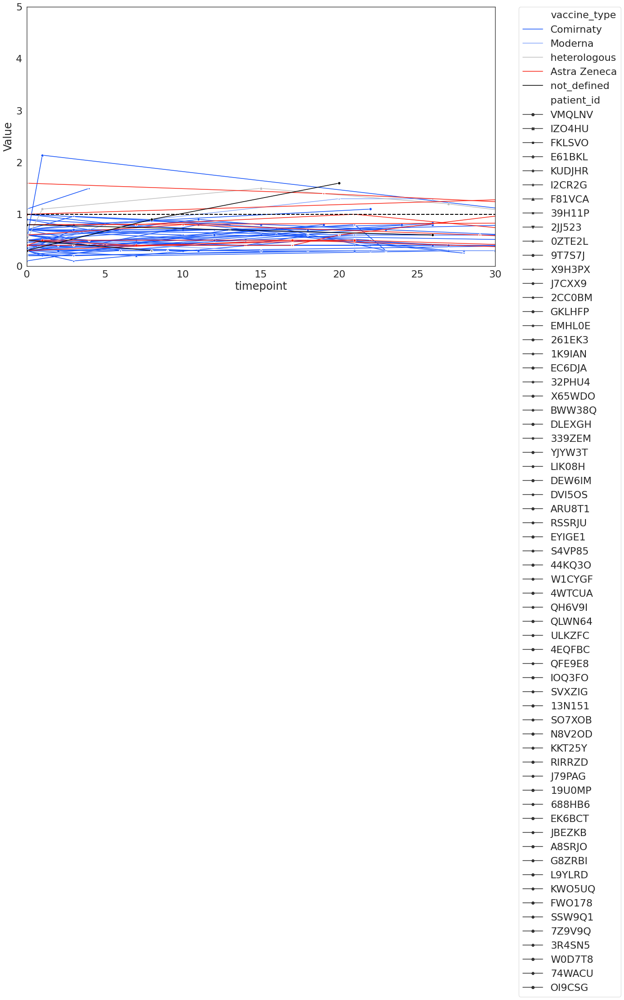

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_bilirubin_1st_dose_df[covid_bilirubin_1st_dose_df['timepoint']==0]['patient_id'])
covid_bilirubin_1st_dose_df_with_baseline = covid_bilirubin_1st_dose_df[covid_bilirubin_1st_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_bilirubin_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis,palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(0,5)
plt.xlim(0,30)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)

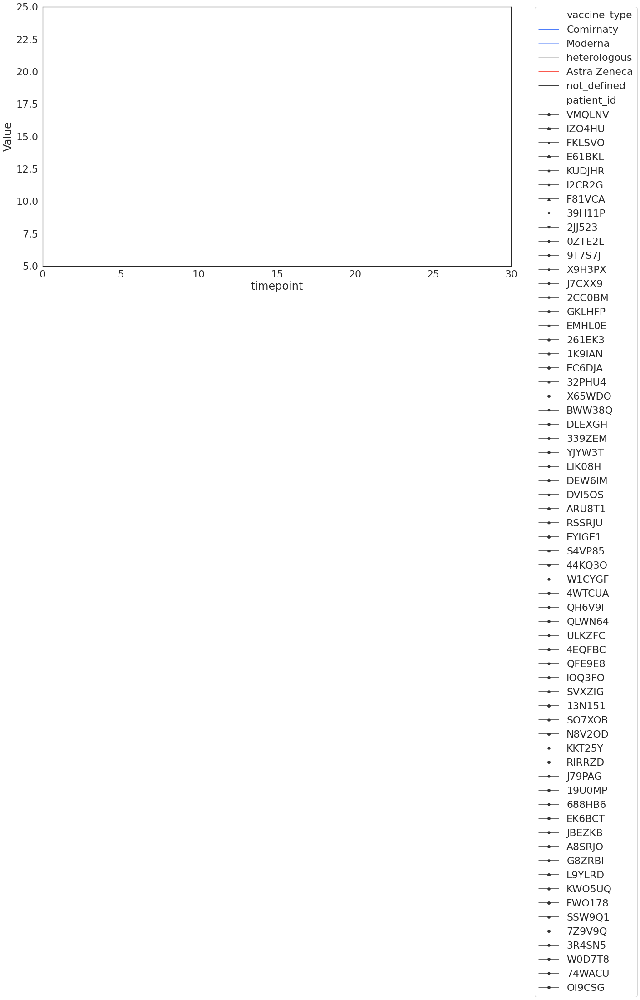

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_bilirubin_1st_dose_df[covid_bilirubin_1st_dose_df['timepoint']==0]['patient_id'])
covid_bilirubin_1st_dose_df_with_baseline = covid_bilirubin_1st_dose_df[covid_bilirubin_1st_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_bilirubin_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis,palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(5,25)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)

### 2nd dose

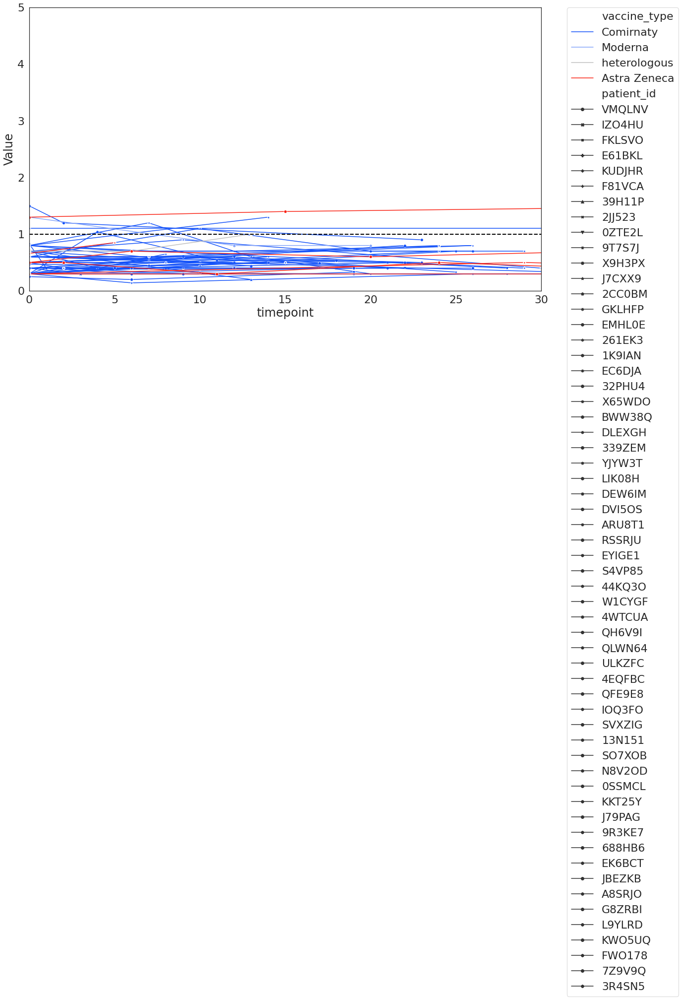

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_bilirubin_2nd_dose_df[covid_bilirubin_2nd_dose_df['timepoint']==0]['patient_id'])
covid_bilirubin_2nd_dose_df_with_baseline = covid_bilirubin_2nd_dose_df[covid_bilirubin_2nd_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_bilirubin_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=1,ls='dashed')
plt.ylim(0,5)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)


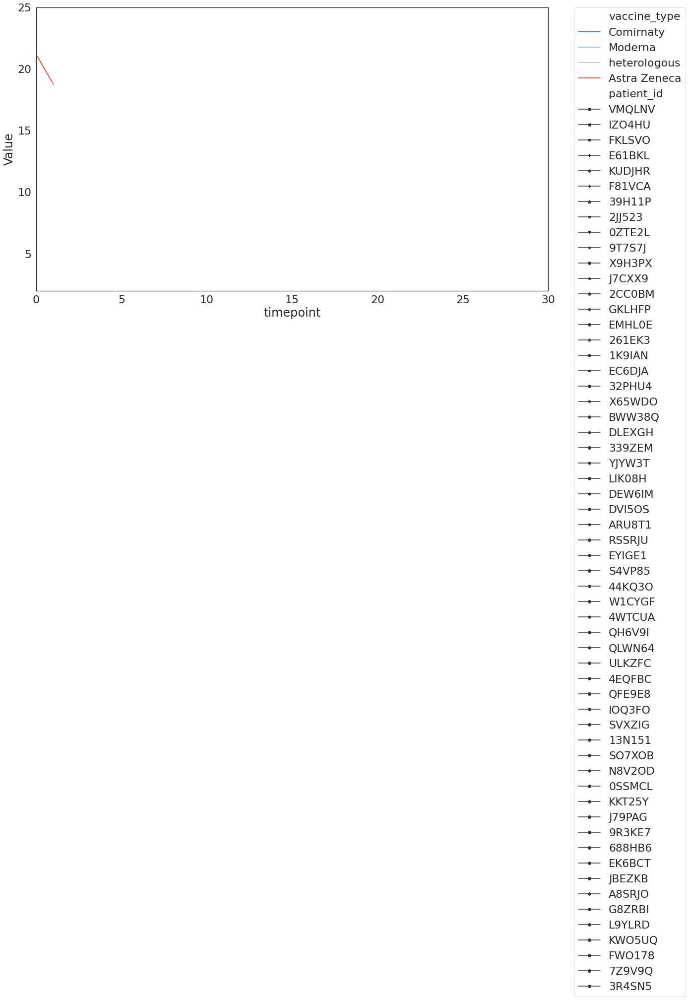

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_bilirubin_2nd_dose_df[covid_bilirubin_2nd_dose_df['timepoint']==0]['patient_id'])
covid_bilirubin_2nd_dose_df_with_baseline = covid_bilirubin_2nd_dose_df[covid_bilirubin_2nd_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_bilirubin_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=1)
plt.ylim(2,25)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)


## creatinine

In [ ]:
#create dictionary patient:color code with color code for vaccines

df_subset = covid_creatinine_1st_dose_df[['patient_id','vaccine_type']]
df_subset = df_subset.set_index('patient_id')
df_subset.loc[:,'vaccine_type'] = df_subset.loc[:,'vaccine_type'].map(vaccine_type_dict)
patient_vaccine_type_color_dict = df_subset.to_dict()
patient_vaccine_type_color_dict

{'vaccine_type': {'0ZTE2L': '#1452f9',
  '13N151': '#1452f9',
  '19U0MP': '#1452f9',
  '1K9IAN': '#1452f9',
  '261EK3': '#1452f9',
  '2CC0BM': '#1452f9',
  '2JJ523': '#1452f9',
  '32PHU4': '#1452f9',
  '339ZEM': '#1452f9',
  '39H11P': '#1452f9',
  '3R4SN5': '#f92214',
  '44KQ3O': '#1452f9',
  '4EQFBC': '#1452f9',
  '4WTCUA': '#1452f9',
  '688HB6': '#1452f9',
  '74WACU': '#000000',
  '7Z9V9Q': '#f92214',
  '9T7S7J': '#1452f9',
  'A8SRJO': '#f92214',
  'ARU8T1': '#1452f9',
  'BWW38Q': '#1452f9',
  'DEW6IM': '#1452f9',
  'DLEXGH': '#1452f9',
  'DVI5OS': '#1452f9',
  'E61BKL': '#1452f9',
  'EC6DJA': '#1452f9',
  'EK6BCT': '#bfbfbf',
  'EMHL0E': '#1452f9',
  'EYIGE1': '#1452f9',
  'F81VCA': '#1452f9',
  'FKLSVO': '#1452f9',
  'FWO178': '#f92214',
  'G8ZRBI': '#f92214',
  'GKLHFP': '#1452f9',
  'I2CR2G': '#1452f9',
  'IOQ3FO': '#1452f9',
  'IZO4HU': '#1452f9',
  'J79PAG': '#1452f9',
  'J7CXX9': '#1452f9',
  'JBEZKB': '#f92214',
  'KKT25Y': '#1452f9',
  'KUDJHR': '#1452f9',
  'KWO5UQ': '#f922

### 1st dose

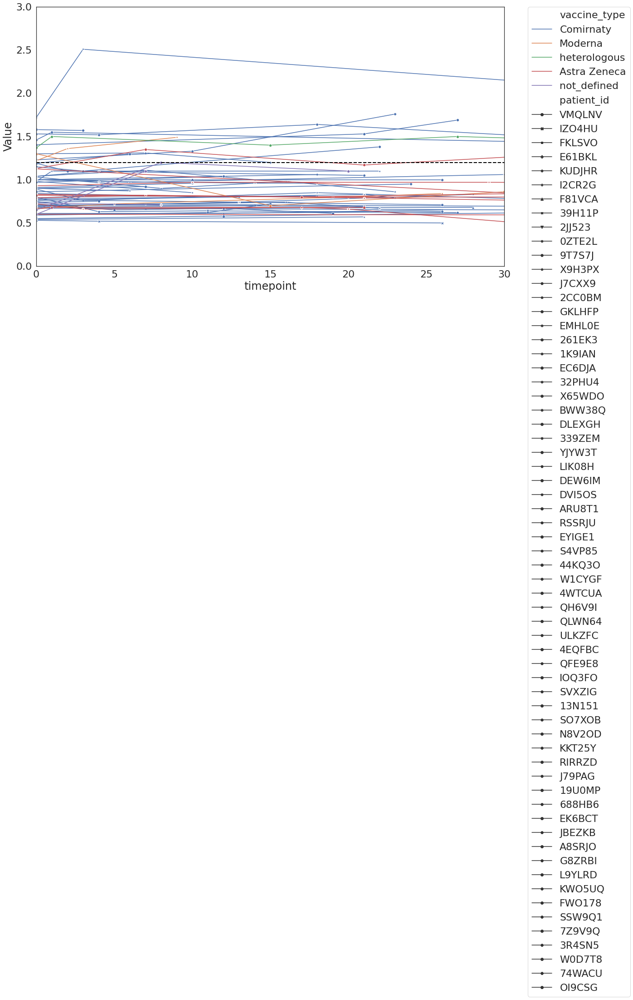

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_creatinine_1st_dose_df[covid_creatinine_1st_dose_df['timepoint']==0]['patient_id'])
covid_creatinine_1st_dose_df_with_baseline = covid_creatinine_1st_dose_df[covid_creatinine_1st_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_creatinine_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis
)
plt.axhline(linewidth=2, color='#000000',y=1.2,ls='dashed')
plt.ylim(0,3)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)



### 2nd dose

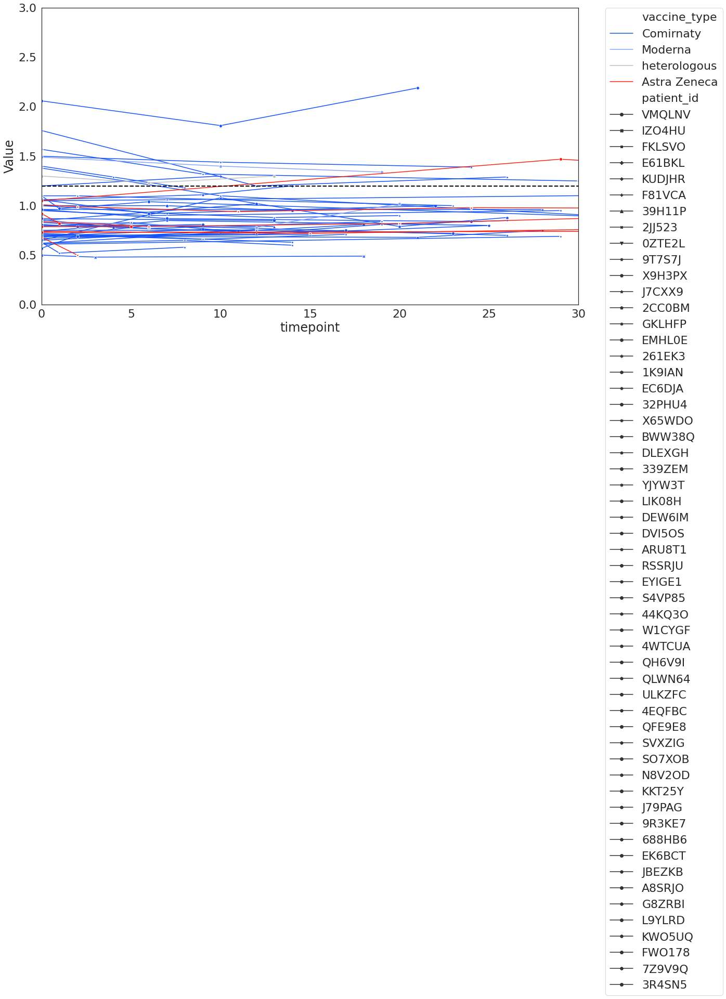

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_creatinine_2nd_dose_df[covid_creatinine_2nd_dose_df['timepoint']==0]['patient_id'])
covid_creatinine_2nd_dose_df_with_baseline = covid_creatinine_2nd_dose_df[covid_creatinine_2nd_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_creatinine_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=1.2,ls='dashed')
plt.ylim(0,3)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)


## crp

### 1st dose

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

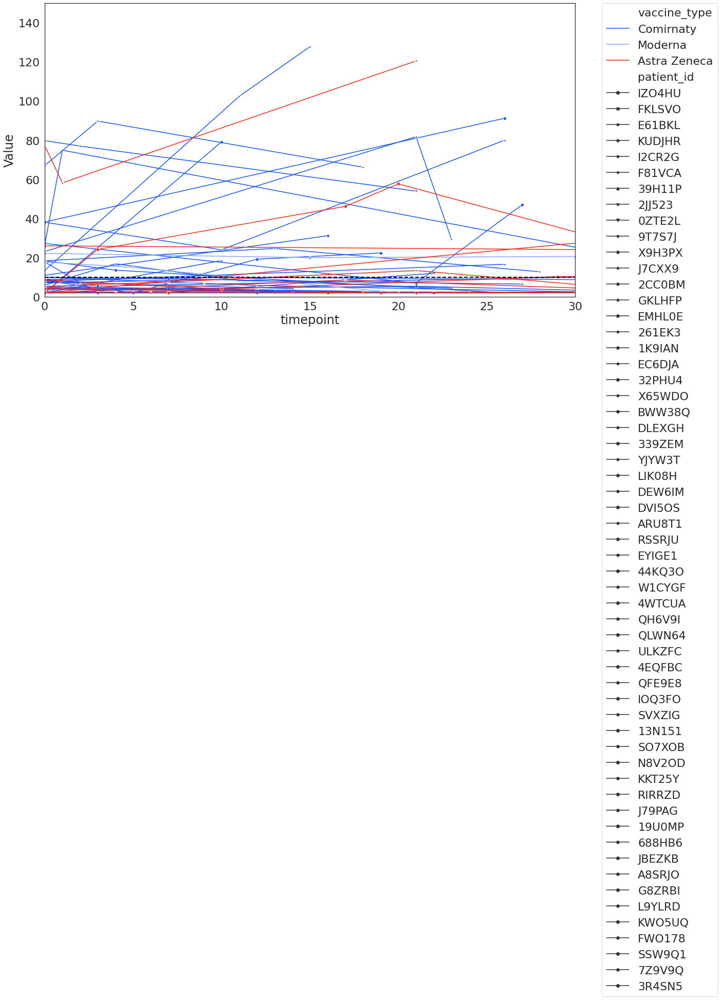

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_1st_dose_df[covid_crp_1st_dose_df['timepoint']==0]['patient_id'])
covid_crp_1st_dose_df_with_baseline = covid_crp_1st_dose_df[covid_crp_1st_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_firstdose_1.svg'


sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')
plt.ylim(0,150)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_name, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(save_name)
files.download(save_name) 


In [ ]:
#patients with upregulation of crp
thresh = 30
fold_thresh = 1.5
df = covid_crp_1st_dose_df_with_baseline.copy()
patients = set(df['patient_id'])

#normalize to pre to get fold change from pre
a = set(df[df['Value']>thresh]['patient_id'])

df_list = []

for i in patients:
  df_patient  = df[df['patient_id']==i]
  timepoints = list(df_patient['timepoint']) 
  if 0 in timepoints:
    df_patient_pre = df_patient[df_patient['timepoint']==0]
    df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0])
    patient_df = pd.DataFrame(df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0]))
    patient_df.loc[:,'patient'] = i
    df_list.append(patient_df)
df_patients = pd.concat(df_list)
df_patients_tresh = df_patients[df_patients['Value']>1.5]
df_patients_tresh_set = set(df_patients_tresh['patient'])

#intersection of patients above absolute thresh and fold change above fold change thresh
patients_with_up = patients.intersection(df_patients_tresh_set)

print('patients with upregulation above', thresh,'and fold change over',fold_thresh,':')
print(patients_with_up)
print('these are:',len(patients_with_up),'patients and', len(patients_with_up)/len(patients)*100,'%')

patients with upregulation above 30 and fold change over 1.5 :
{'0ZTE2L', '39H11P', '7Z9V9Q', 'FWO178', 'EC6DJA', 'J7CXX9', 'ARU8T1', 'LIK08H', 'L9YLRD', '261EK3', '9T7S7J', 'BWW38Q', 'X9H3PX', 'A8SRJO', 'SSW9Q1', 'N8V2OD', 'DEW6IM', '19U0MP', 'KWO5UQ', 'SVXZIG', '4WTCUA', 'G8ZRBI', 'ULKZFC'}
these are: 23 patients and 40.35087719298245 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

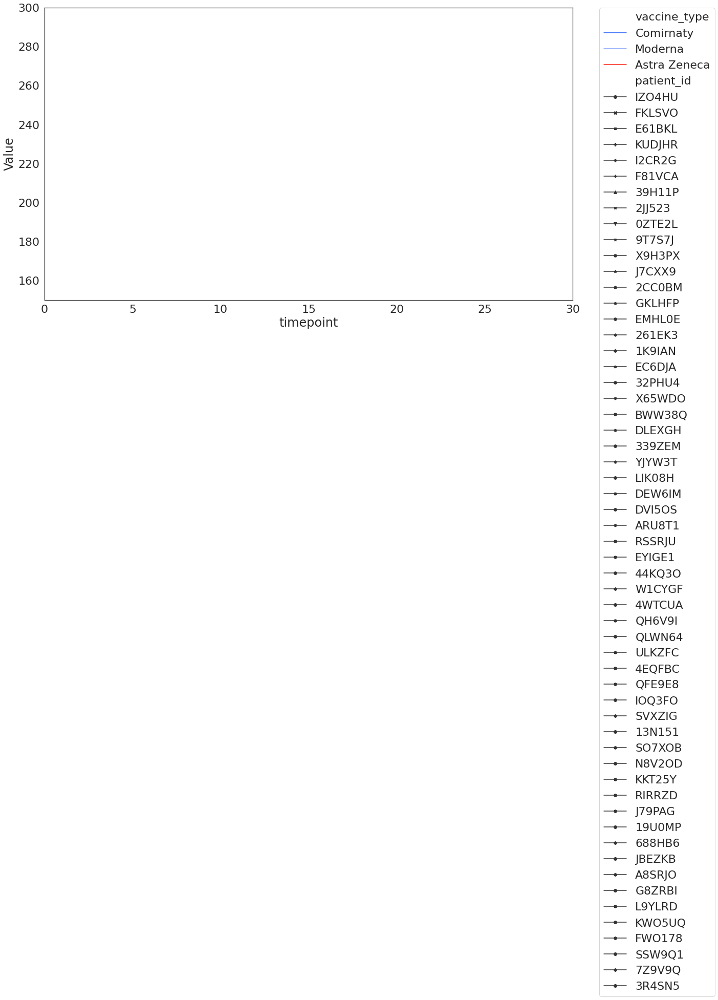

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_1st_dose_df[covid_crp_1st_dose_df['timepoint']==0]['patient_id'])
covid_crp_1st_dose_df_with_baseline = covid_crp_1st_dose_df[covid_crp_1st_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_firstdose_2.svg'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')
plt.ylim(150,300)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_name, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(save_name)
files.download(save_name) 



### 2nd dose

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

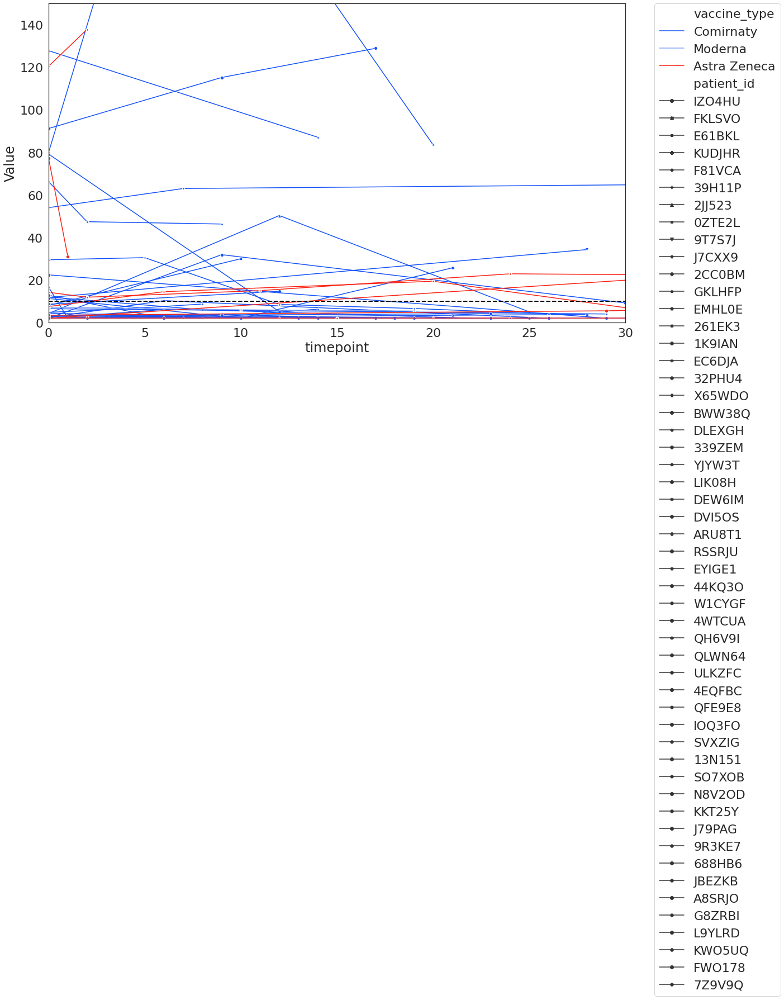

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['timepoint']==0]['patient_id'])
covid_crp_2nd_dose_df_with_baseline = covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_seconddose_1.svg'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')

plt.ylim(0,150)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_name, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(save_name)
files.download(save_name) 



In [ ]:
#patients with upregulation of crp
thresh = 30
fold_thresh = 1.5
df = covid_crp_2nd_dose_df_with_baseline.copy()
patients = set(df['patient_id'])

#normalize to pre to get fold change from pre
a = set(df[df['Value']>thresh]['patient_id'])

df_list = []

for i in patients:
  df_patient  = df[df['patient_id']==i]
  timepoints = list(df_patient['timepoint']) 
  if 0 in timepoints:
    df_patient_pre = df_patient[df_patient['timepoint']==0]
    df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0])
    patient_df = pd.DataFrame(df_patient['Value'].map(lambda x:x/list(df_patient_pre['Value'])[0]))
    patient_df.loc[:,'patient'] = i
    df_list.append(patient_df)
df_patients = pd.concat(df_list)
df_patients_tresh = df_patients[df_patients['Value']>1.5]
df_patients_tresh_set = set(df_patients_tresh['patient'])

#intersection of patients above absolute thresh and fold change above fold change thresh
patients_with_up = patients.intersection(df_patients_tresh_set)

print('patients with upregulation above', thresh,'and fold change over',fold_thresh,':')
print(patients_with_up)
print('these are:',len(patients_with_up),'patients and', len(patients_with_up)/len(patients)*100,'%')

patients with upregulation above 30 and fold change over 1.5 :
{'4EQFBC', 'KWO5UQ', 'L9YLRD', 'A8SRJO', '2JJ523', 'E61BKL', 'EYIGE1', '32PHU4', '9T7S7J', 'FKLSVO', '339ZEM', 'G8ZRBI', '44KQ3O', 'EC6DJA', 'F81VCA', 'DEW6IM', 'DLEXGH'}
these are: 17 patients and 32.69230769230769 %


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

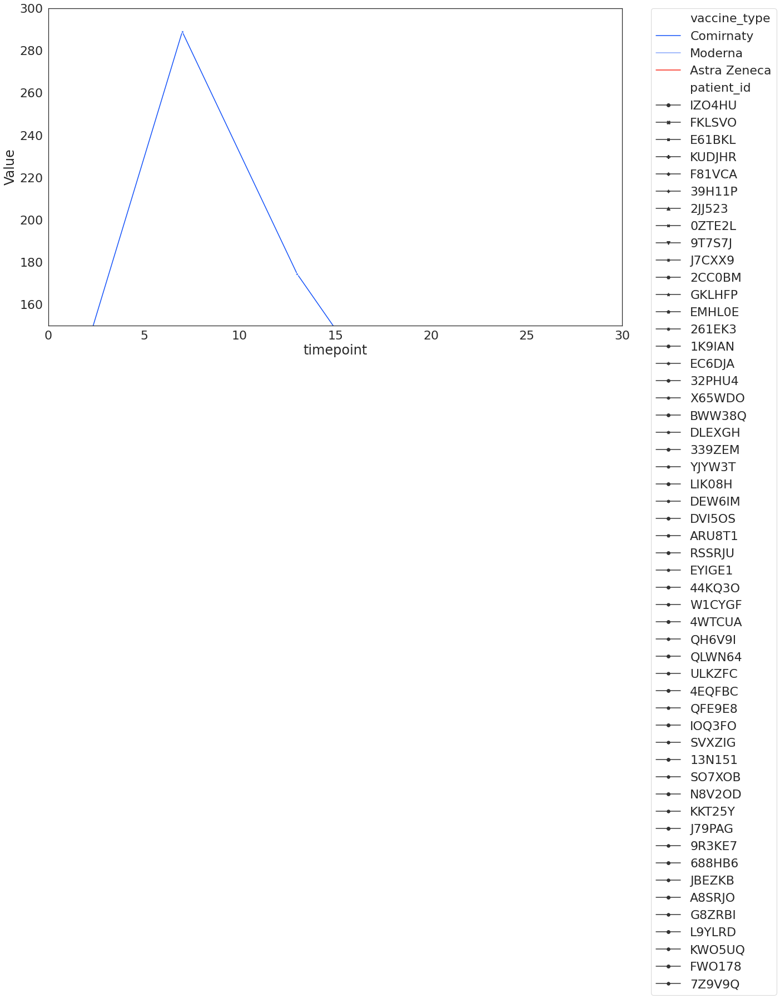

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['timepoint']==0]['patient_id'])
covid_crp_2nd_dose_df_with_baseline = covid_crp_2nd_dose_df[covid_crp_2nd_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'crp_seconddose_2.svg'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_crp_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')
plt.ylim(150,300)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_name, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(save_name)
files.download(save_name) 



## platelets

### 1st dose

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

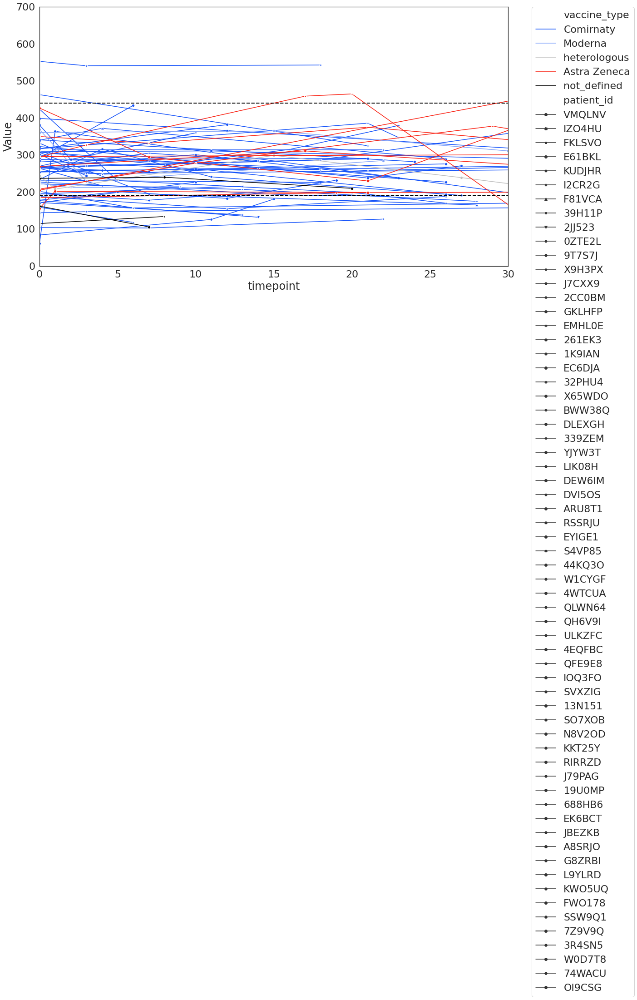

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_platelets_1st_dose_df[covid_platelets_1st_dose_df['timepoint']==0]['patient_id'])
covid_platelets_1st_dose_df_with_baseline = covid_platelets_1st_dose_df[covid_platelets_1st_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'platelets_firstdose_1.svg'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_platelets_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=190,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=440,ls='dashed')

plt.ylim(0,700)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_name, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(save_name)
files.download(save_name) 

### 2nd dose

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "papertype" which is no longer supported as of 3.3 and will become an error two minor releases later
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "frameon" which is no longer supported as of 3.3 and will become an error two minor releases later


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

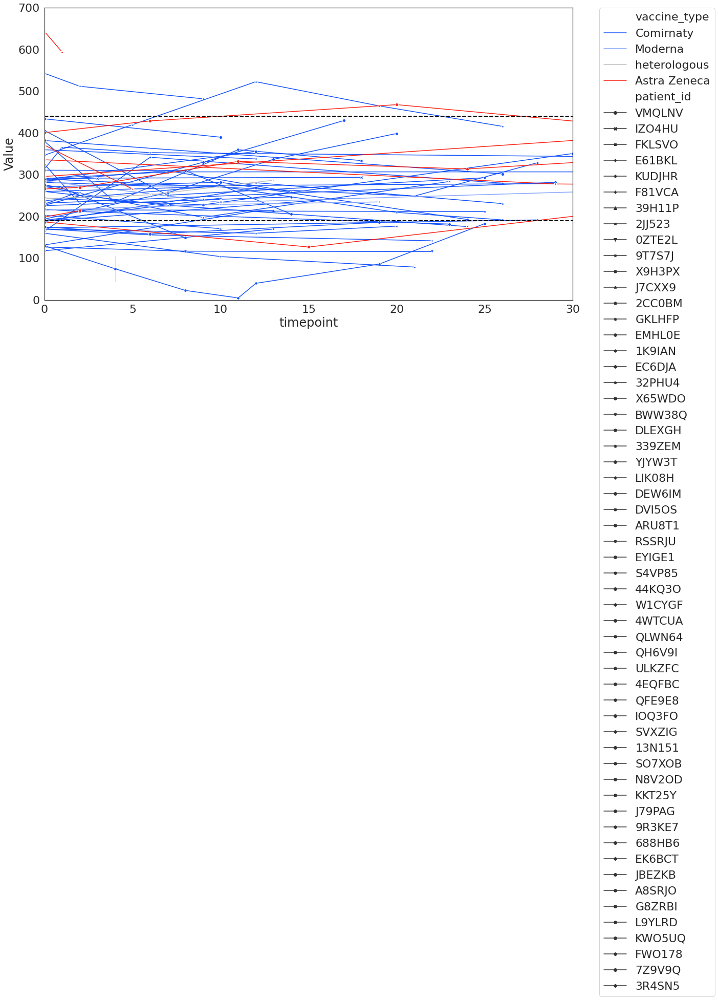

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_platelets_2nd_dose_df[covid_platelets_2nd_dose_df['timepoint']==0]['patient_id'])
covid_platelets_2nd_dose_df_with_baseline = covid_platelets_2nd_dose_df[covid_platelets_2nd_dose_df['patient_id'].isin(baseline_patient_list)]
save_name = 'platelets_seconddose_2.svg'

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_platelets_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=190,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=440,ls='dashed')

plt.ylim(0,700)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.savefig(save_name, dpi=300, facecolor='w', edgecolor='w',
        orientation='portrait', papertype=None, format='svg',
        transparent=False, bbox_inches=None, pad_inches=0.1,
        frameon=None, metadata=None)
plt.savefig(save_name)
files.download(save_name) 

## leuko

### 1st dose

In [ ]:
covid_leuko_1st_dose_df

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,patient_id,vaccine_type,timepoint,Value
0,0,0,0,0,VMQLNV,Comirnaty,0,4.00
1,1,1,1,1,NaN,NaN,0,5.86
2,2,2,2,2,FKLSVO,Comirnaty,0,4.16
3,3,3,3,3,E61BKL,Comirnaty,0,5.00
4,4,4,4,4,KUDJHR,Comirnaty,0,6.59
...,...,...,...,...,...,...,...,...
191,191,191,191,191,OI9CSG,not_defined,0,5.61
192,192,192,192,192,W0D7T8,not_defined,7,8.10
193,193,193,193,193,OI9CSG,not_defined,8,7.65
194,194,194,194,194,74WACU,not_defined,8,5.10


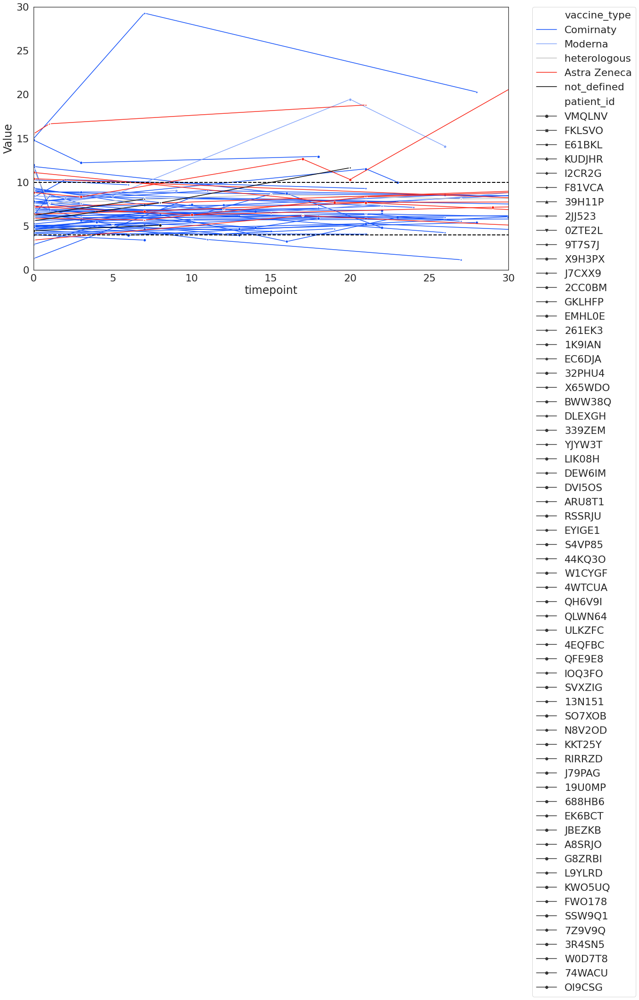

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_leuko_1st_dose_df[covid_leuko_1st_dose_df['timepoint']==0]['patient_id'])
covid_leuko_1st_dose_df_with_baseline = covid_leuko_1st_dose_df[covid_leuko_1st_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_leuko_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=4,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')

plt.ylim(0,30)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)



### 2nd dose

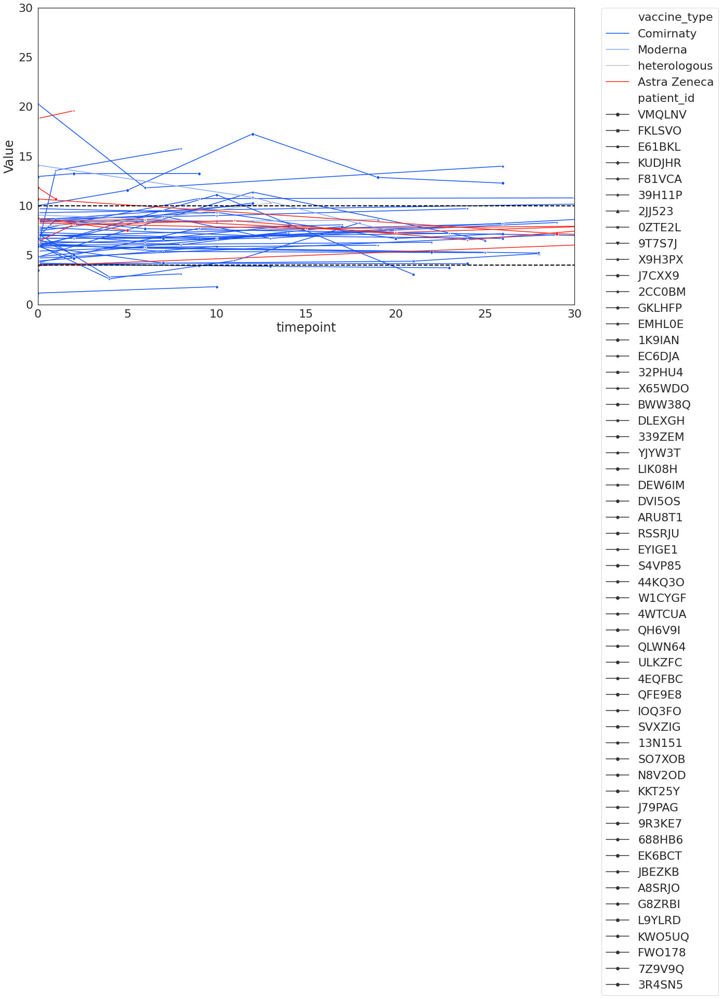

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_leuko_2nd_dose_df[covid_leuko_2nd_dose_df['timepoint']==0]['patient_id'])
covid_leuko_2nd_dose_df_with_baseline = covid_leuko_2nd_dose_df[covid_leuko_2nd_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_leuko_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=4,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=10,ls='dashed')

plt.ylim(0,30)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)



## hb

### 1st dose

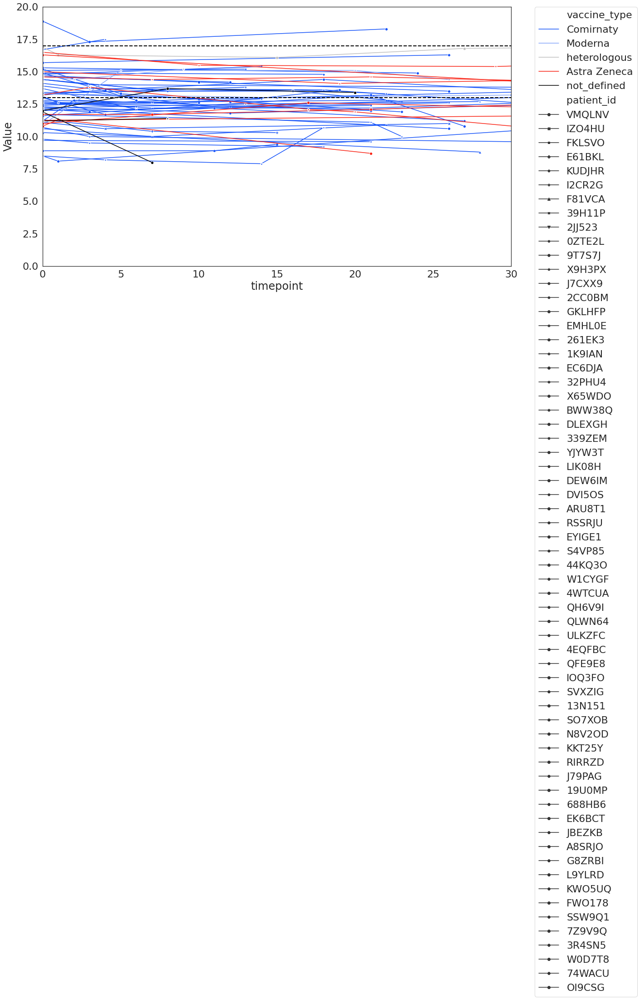

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_hb_1st_dose_df[covid_hb_1st_dose_df['timepoint']==0]['patient_id'])
covid_hb_1st_dose_df_with_baseline = covid_hb_1st_dose_df[covid_hb_1st_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_hb_1st_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=13,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=17,ls='dashed')

plt.ylim(0,20)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)




### 2nd dose

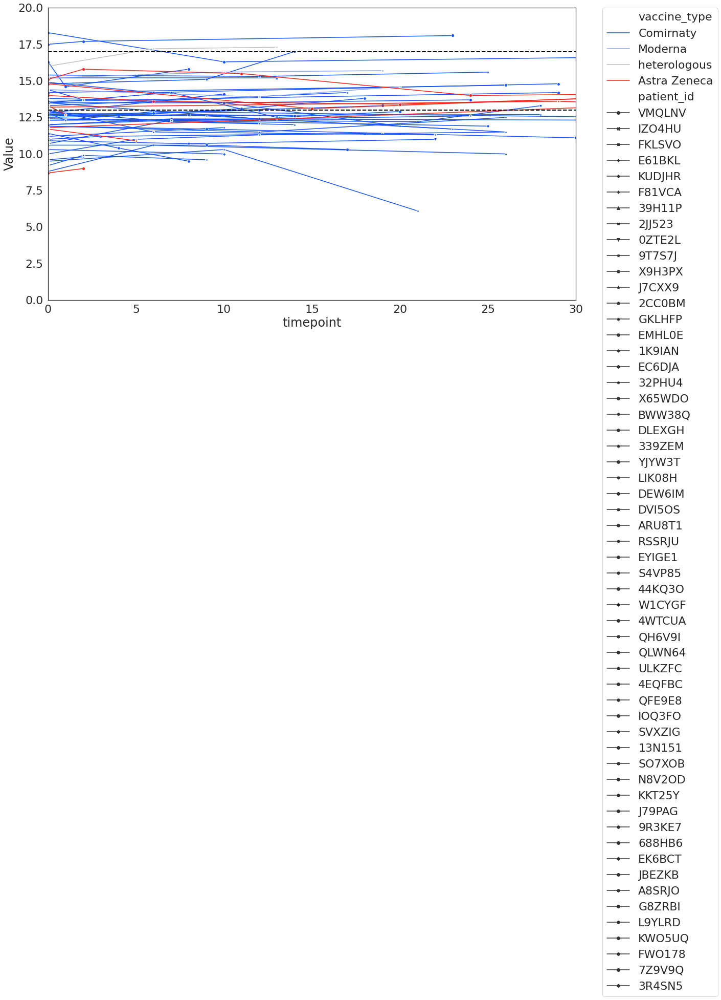

In [ ]:
# Draw a pointplot to show pulse as a function of three categorical factors

#restrict to samples with available baseline
baseline_patient_list = list(covid_hb_2nd_dose_df[covid_hb_2nd_dose_df['timepoint']==0]['patient_id'])
covid_hb_2nd_dose_df_with_baseline = covid_hb_2nd_dose_df[covid_hb_2nd_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_hb_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=13,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=17,ls='dashed')

plt.ylim(0,20)
plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)




## Cytokine program

In [ ]:
cytokine_plot_df = JK210728_panel1_2_merge_log
cytokine_plot_df


,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint,sample_id
sample_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
2JJ523_T2,0.562293,2.690026,1.250664,0.395850,0.119256,0.281033,0.809964,2.326878,0.979548,0.285557,2.504813,0.868350,0.263636,0.000000,0.000000,0.000000,0.421604,2.473764,0.000000,0.625312,0.000000,2.128603,1.088668,0.000000,0.000000,pre,2JJ523
32PHU4_T1,0.921686,2.344947,1.701568,0.644734,0.466200,1.338656,1.105936,3.008006,1.179351,0.414137,3.038054,0.000000,0.583765,0.886491,0.342817,1.194930,0.833147,3.640897,0.692847,1.787390,0.900640,2.500527,1.328033,2.381873,0.750123,pre,32PHU4
339ZEM_T1,0.909556,2.555739,2.108430,1.223158,1.024075,1.786680,1.457185,3.105338,1.661354,1.472171,2.601760,1.989783,1.139722,1.009451,0.342817,1.428216,1.616055,2.806550,1.825621,2.109815,0.927319,2.140786,1.155397,2.625390,1.419749,pre,339ZEM
ARU8T1_T1,1.237795,2.968343,1.458033,0.398894,0.627212,0.929930,1.420970,2.612185,1.107736,0.571709,2.752437,0.000000,0.802432,0.000000,0.342817,0.661813,0.636488,3.184085,0.867173,2.326141,0.821055,2.677336,1.396470,2.267700,0.502837,pre,ARU8T1
BWW38Q_T2,0.832828,2.565647,1.828209,0.697011,0.553458,1.185400,1.341870,2.768301,1.374024,0.828015,2.236944,0.698753,0.533391,0.965672,0.342817,1.011993,1.226858,3.159730,1.563481,2.224572,0.785330,2.450761,1.235756,2.432793,1.101730,pre,BWW38Q
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
KUDJHR_T3,0.545925,2.397393,1.078276,0.406881,0.194098,0.587149,1.148201,2.286726,0.234391,0.195900,2.204531,0.000000,0.227887,0.000000,0.000000,0.000000,0.000000,2.328186,0.000000,1.560564,0.000000,2.029542,1.086039,0.000000,0.000000,post2,KUDJHR
339ZEM_T2,0.898451,2.669576,1.809560,1.344648,0.842578,1.458033,1.504505,3.177922,1.675810,1.132260,2.879772,1.893581,0.870989,0.939270,0.342817,1.391553,1.471438,3.419179,1.676053,2.295292,0.991381,2.831816,1.610010,2.723156,1.544824,post2,339ZEM
0ZTE2L_T4,1.737193,3.939600,2.216390,1.748091,1.253786,1.830877,1.405227,3.632135,3.734361,1.340147,2.796857,2.128459,1.153510,1.344883,0.342817,1.658059,1.244648,3.267351,2.134591,2.376321,0.546358,2.755366,1.399535,2.388572,0.543261,post2,0ZTE2L


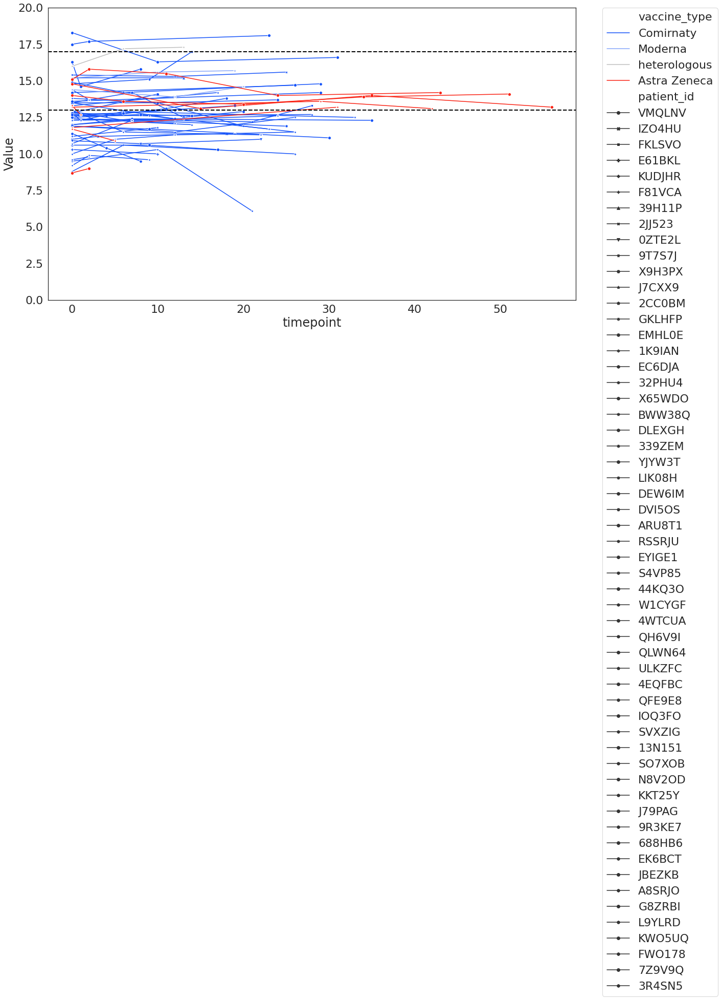

In [ ]:
#restrict to samples with available baseline
baseline_patient_list = list(covid_hb_2nd_dose_df[covid_hb_2nd_dose_df['timepoint']==0]['patient_id'])
covid_hb_2nd_dose_df_with_baseline = covid_hb_2nd_dose_df[covid_hb_2nd_dose_df['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=covid_hb_2nd_dose_df_with_baseline,
    x="timepoint", y="Value", hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
plt.axhline(linewidth=2, color='#000000',y=13,ls='dashed')
plt.axhline(linewidth=2, color='#000000',y=17,ls='dashed')

plt.ylim(0,20)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)




# Plot individual cytokines (line plots)

In [ ]:
#indicate sample timepoint and patient id
JK210728_panel1_2_merge['timepoint'] = JK210728_panel1_2_merge.index.map(time_dict)
JK210728_panel1_2_merge['patient_id'] = JK210728_panel1_2_merge.index.str.slice(stop=-3)

In [ ]:
#flatten dataframe for plotting
JK210728_panel1_2_merge_flat = JK210728_panel1_2_merge.melt(id_vars=['timepoint','patient_id'])
JK210728_panel1_2_merge_flat

,timepoint,patient_id,variable,value
0,pre,2JJ523,IL-6,2.6500
1,pre,32PHU4,IL-6,7.3500
2,pre,339ZEM,IL-6,7.1200
3,pre,ARU8T1,IL-6,16.2900
4,pre,BWW38Q,IL-6,5.8050
...,...,...,...,...
1945,post2,KUDJHR,IL-12p70,0.0000
1946,post2,339ZEM,IL-12p70,34.0610
1947,post2,0ZTE2L,IL-12p70,2.4935
1948,post2,F81VCA,IL-12p70,0.0000


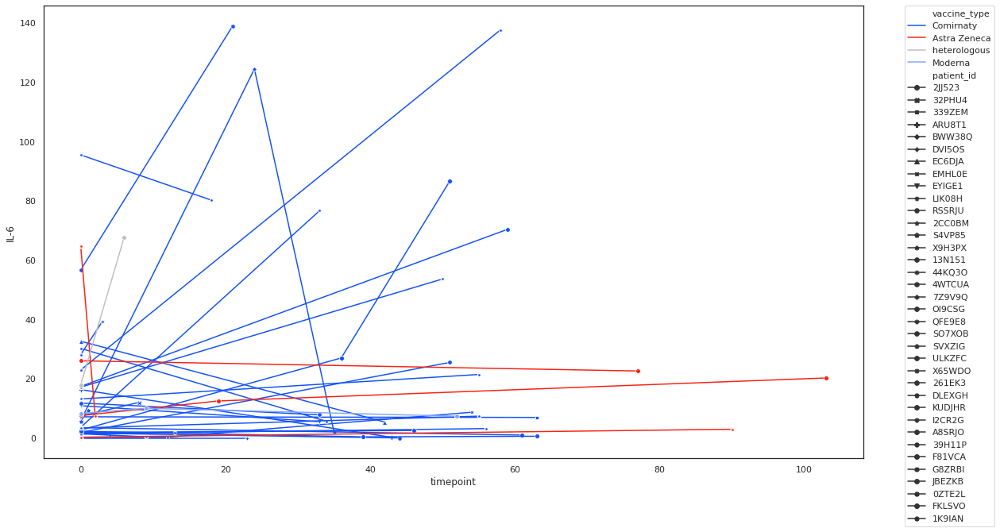

In [ ]:
#plot with timeponts

vaccine_type_dict = {'Comirnaty':blue_blue_red_grey[0],'Moderna':blue_blue_red_grey[1], 'Astra Zeneca':blue_blue_red_grey[2],'heterologous':blue_blue_red_grey[3]}
cytokine_of_interest = 'IL-6'
time_from_first_dict = sample_table['time_from_first'].to_dict()
df_plot = JK210728_panel1_2_merge.copy()
df_plot['timepoint'] = df_plot.index.map(time_from_first_dict)

#map vaccine type
df = df_plot

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df['patient_id'].map(vaccine_type)
df_plot = df


#set all baseline timepoints to 0

adj_time = []
for i in df_plot['timepoint']:
  if i < 0:
    adj_time.append(0)
  else:
    adj_time.append(i)

df_plot['timepoint'] = adj_time

#restrict to samples with available baseline
baseline_patient_list = list(df_plot[df_plot['timepoint']==0]['patient_id'])
df_plot_baseline = df_plot[df_plot['patient_id'].isin(baseline_patient_list)]

sns.set_style('white')
fig, axis = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sns.lineplot(
    data=df_plot,
    x="timepoint", y=cytokine_of_interest, hue="vaccine_type",style="patient_id",
    markers=True, dashes=False, ax=axis, palette=vaccine_type_dict
)
#plt.axhline(linewidth=2, color='#000000',y=13,ls='dashed')
#plt.axhline(linewidth=2, color='#000000',y=17,ls='dashed')

#plt.ylim(0,20)
#plt.xlim(0,30)

plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)


In [ ]:
#get max and min timediff between first and second dose

from datetime import datetime

time_table = patient_table[~patient_table['Second_dose_date'].isna()]
time_table['First_dose_date'] = pd.to_datetime(time_table['First_dose_date'], format="%m/%d/%Y")
time_table['Second_dose_date'] = pd.to_datetime(time_table['Second_dose_date'], format="%m/%d/%Y")
vacc_type_dict = df_plot['vaccine_type'].to_dict()
vacc_type_dict = {x[:-3]:vacc_type_dict[x] for x in vacc_type_dict}
time_table['vaccine_type'] = time_table.index.map(vacc_type_dict)

time_table_comirnaty = time_table[time_table['vaccine_type']=='Comirnaty']
time_table_moderna = time_table[time_table['vaccine_type']=='Moderna']
time_table_az = time_table[time_table['vaccine_type']=='Astra Zeneca']

print('BioNTech/Pfizer')
time_dif = time_table_comirnaty['Second_dose_date'] - time_table_comirnaty['First_dose_date']
print('min time difference between 1st and 2nd dose is:',  min(time_dif))
print('max time difference between 1st and 2nd dose is:', max(time_dif))

print('Moderna')
time_dif = time_table_moderna['Second_dose_date'] - time_table_moderna['First_dose_date']
print('min time difference between 1st and 2nd dose is:',  min(time_dif))
print('max time difference between 1st and 2nd dose is:', max(time_dif))

print('AZ')
time_dif = time_table_az['Second_dose_date'] - time_table_az['First_dose_date']
print('min time difference between 1st and 2nd dose is:',  min(time_dif))
print('max time difference between 1st and 2nd dose is:', max(time_dif))

BioNTech/Pfizer
min time difference between 1st and 2nd dose is: 21 days 00:00:00
max time difference between 1st and 2nd dose is: 45 days 00:00:00
Moderna
min time difference between 1st and 2nd dose is: 35 days 00:00:00
max time difference between 1st and 2nd dose is: 35 days 00:00:00
AZ
min time difference between 1st and 2nd dose is: 42 days 00:00:00
max time difference between 1st and 2nd dose is: 75 days 00:00:00


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [ ]:
#inspect top IL6 patients
JK210728_panel1_2_merge_flat_IL6 = JK210728_panel1_2_merge_flat[JK210728_panel1_2_merge_flat['variable']=='IL-6']
top_IL6 = JK210728_panel1_2_merge_flat_IL6[JK210728_panel1_2_merge_flat_IL6['value']>50].set_index('patient_id').sort_values('value', ascending=False)['value']


#take only patients who show upregulation of IL6 after vaccination

patients_IL6_induction = []
for i in set(top_IL6.index):
  subset_df = JK210728_panel1_2_merge_flat_IL6[JK210728_panel1_2_merge_flat_IL6['patient_id']==i]
  subset_df_pre = subset_df[subset_df['timepoint']=='pre']
  subset_df_post1 = subset_df[subset_df['timepoint']=='post1']
  subset_df_post2 = subset_df[subset_df['timepoint']=='post2']
  if subset_df_post1['patient_id'].shape[0] != 0:  #check if df is empty because the post1 sample was not contained in the data
    if subset_df_post1['value'].iloc[0] > subset_df_pre['value'].iloc[0]:
      patients_IL6_induction.append(i)
  elif subset_df_post2['patient_id'].shape[0] != 0: #check if df is empty because the post1 sample was not contained in the data
    if subset_df_post2['value'].iloc[0] > subset_df_pre['value'].iloc[0]:
      patients_IL6_induction.append(i)

patients_above_50pg = list(dict.fromkeys(set(top_IL6.index).intersection(set(patients_IL6_induction))))

print('patients above 50pg/ml:', patients_above_50pg)

patients above 50pg/ml: ['2JJ523', '0ZTE2L', '261EK3', 'LIK08H', 'OI9CSG', '4WTCUA', 'BWW38Q', 'X9H3PX']


In [ ]:
#set params
sns.set(font_scale=5)
sns.set_style('white')
line_weight = 6
subplot_coordinate_list=[(0,0),(0,1),(0,2),(0,3),(0,4),(0,5),(1,0),(1,1),(1,2),(1,3),(1,4),(1,5),(2,0),(2,1),(2,2),(2,3),(2,4),(2,5),(3,0),(3,1),(3,2),(3,3),(3,4),(3,5),(4,0),(4,1),(4,2),(4,3),(4,4),(4,5),
                         (5,0),(5,1),(5,2),(5,3),(5,4),(5,5)]
fig, axs = plt.subplots(6, 6, figsize=(150,150), sharey=False)

#plot
for j,i in enumerate(set(JK210728_panel1_2_merge_flat['variable'])):
  JK210728_panel1_2_merge_flat_subset = JK210728_panel1_2_merge_flat[JK210728_panel1_2_merge_flat['variable']==i]
  for k in set(JK210728_panel1_2_merge_flat['patient_id']):
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=JK210728_panel1_2_merge_flat_subset[JK210728_panel1_2_merge_flat_subset['patient_id']==k],linewidth=line_weight, linestyle='-',marker='o', color=patient_color_dict[k])
  axs[subplot_coordinate_list[j]].set_title(i)

# Plot covariances

In [ ]:
normalized_df

,IL-6,CCL2,CSF3,IFN-a2,IL-2,IFN-g,IL-7,sIL-1RA,CXCL8,TNF-a,CXCL10,CCL3,IL-10,IL-13,CSF2,IL-1b,IL-5,sIL-2RA,IL-4,VEGF,IL-17a,IL-18,CCL4,IL-15,IL-12p70,timepoint
1K9IAN_T3,0.280945,0.221292,1.310162,0.295478,0.177071,0.244147,0.219964,0.339038,1.013763,0.376886,0.062369,0.000000,0.225779,-0.237723,0.000000,-0.091314,-0.170933,0.521074,0.443041,0.065839,0.000000,0.267758,0.319314,0.000482,0.000000,NaN
QFE9E8_T1,-0.074541,-0.075651,0.131326,-0.107390,0.061333,0.074576,-0.057549,-0.065735,0.070329,0.308604,0.281716,0.083251,0.113769,-0.073450,-0.282265,-0.073074,-0.095890,-0.421907,-0.101347,-0.314238,-0.277739,-0.416846,-0.248748,-0.036226,-0.111204,NaN
2JJ523_T3,0.884167,0.268415,0.189615,-0.049497,0.164949,0.335967,-0.041510,0.405901,1.681123,-0.023106,0.222470,0.015708,0.021921,0.000000,0.000000,0.635484,-0.257251,0.125431,0.000000,-0.625312,0.118265,0.082961,0.284116,0.000000,0.000000,NaN
2JJ523_T4,1.380335,-0.182140,0.266136,-0.033651,-0.077271,-0.281033,0.275898,0.174037,-0.527225,-0.164983,-0.339508,0.025411,-0.062239,0.000000,0.000000,0.000000,-0.421604,0.243594,0.000000,0.000000,0.063146,0.081928,-0.244439,0.000000,0.000000,NaN
EYIGE1_T2,-0.263912,-0.003275,-0.217795,-0.267559,-0.234563,-0.210273,-0.185829,-0.175640,-0.364269,-0.341339,0.296926,-0.279698,-0.239744,0.056376,0.000000,-0.065336,-0.245634,-0.129299,-0.136168,-0.043947,-0.256935,0.134538,-0.071251,-0.131600,-0.258716,NaN
EC6DJA_T3,-0.723011,0.279339,0.037679,-0.307968,0.030928,-0.498941,-0.443222,-0.036277,1.355735,-0.830023,-0.242818,-0.506014,-0.181751,0.000000,0.000000,0.149445,-0.775977,-0.020578,-0.290448,-0.206334,-0.210114,0.118217,0.258543,-0.240413,-0.006763,NaN
S4VP85_T1,0.186955,0.021121,-0.182348,0.102422,0.090095,0.022691,-0.177403,0.008617,-0.029328,-0.141699,0.400246,0.276837,0.141019,0.204120,0.000000,-0.369328,-0.197134,-0.054002,-0.782307,-0.201049,-0.291661,-0.080103,-0.077448,-0.411909,-0.420060,NaN
I2CR2G_T2,0.069326,0.289278,0.008977,0.121779,-0.032723,-0.230168,0.099213,0.169532,0.157890,-0.223239,0.151704,0.280621,-0.179655,0.000000,-0.048830,-0.569374,-0.142580,-0.208925,-0.661339,0.022533,-0.155793,0.009476,0.150364,-0.127529,-0.099508,NaN
X9H3PX_T3,0.762849,0.196492,0.175826,-0.324478,0.248751,0.079062,-0.208973,0.788422,-0.311893,0.106653,0.945362,-0.368595,0.581057,0.857332,0.000000,-0.678666,0.791631,1.311889,-0.898542,0.286896,0.378326,1.361211,0.285902,-0.036909,-0.703033,NaN
4WTCUA_T2,0.385014,0.350495,0.117147,0.159948,0.090921,0.031913,0.240661,0.138951,0.250151,0.092658,0.102995,0.176530,0.119167,-0.145690,-0.772665,-0.657120,-0.755769,-0.184702,-0.517781,-0.041785,-0.688440,-0.160485,-0.351680,-0.387251,-0.717565,NaN


In [ ]:
#cytokine data
#columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in JK210728_panel1_2_merge.columns]
#cov_df = JK210728_panel1_2_merge.drop(columns=columns_to_drop)
columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in normalized_df.columns]
cov_df = normalized_df.drop(columns=columns_to_drop) 
#cytokines
marker_cytokines = list(cov_df.columns)

#which metric
calculate_covariance = 'spearman'  #set to either 'spearman', 'covariance'

#set threshold for heatmap
set_thresholds = True
set_vmax = 1
set_center = 0
set_vmin = -1

#set linkage for hierarchical clustering of heatmap
linkage_distance = 1.6

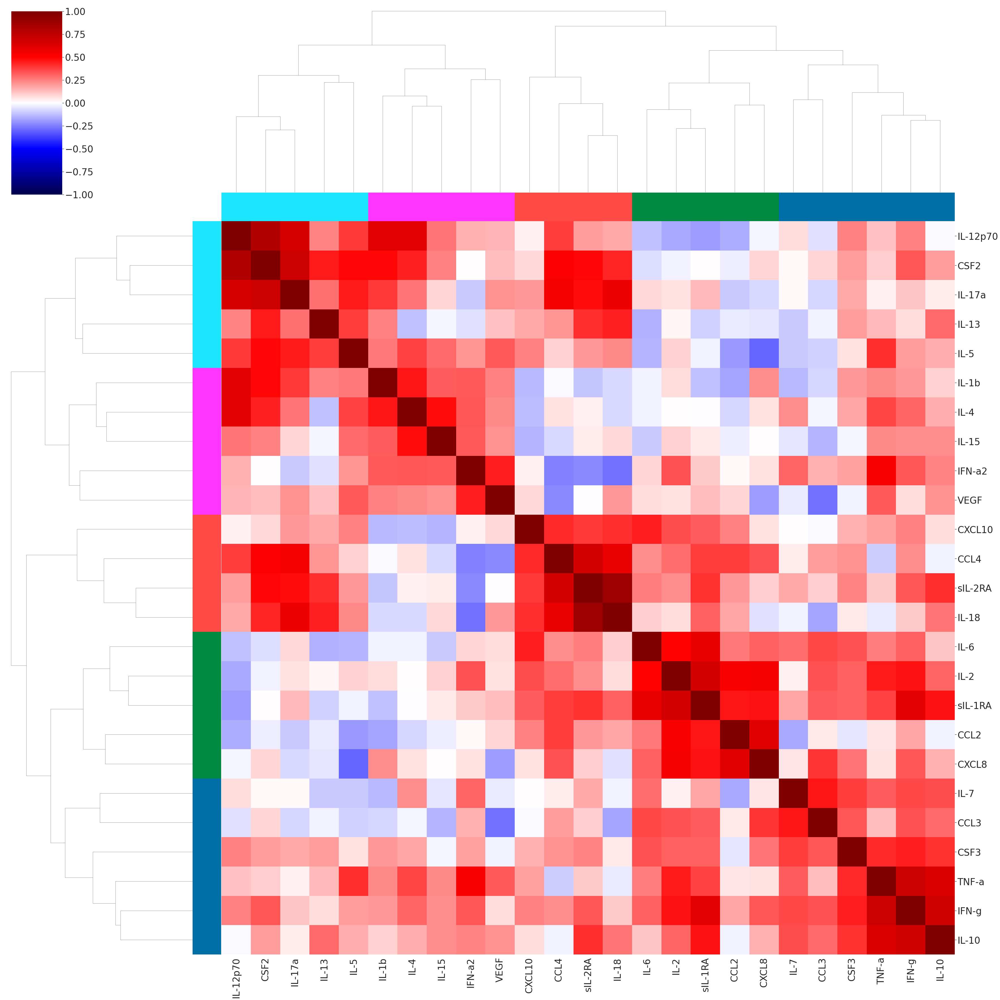

In [ ]:
from scipy.spatial import distance
from scipy.cluster import hierarchy
sns.set(font_scale=3)
  
# Filter out genes not present data
marker_cytokines_filtered = []
for marker in marker_cytokines:
  if marker in cov_df.columns:   
    marker_cytokines_filtered.append(marker)

# Filter out genes not present in data
a = np.std(cov_df.loc[:,cov_df.columns.isin(marker_cytokines_filtered)], axis=0)
b = pd.DataFrame(a.T, index=a[cov_df.columns.isin(marker_cytokines_filtered)].index)
c = b[0]!=0
d = b[c]
e = b[0]==0
f = b[e]
marker_cytokines_filtered_nonzeroSD = d

#marker gene list
marker_cytokines_filtered_nonzeroSD = list(marker_cytokines_filtered_nonzeroSD.index)
    
#calculate covariance or corrcoef 
if calculate_covariance == 'spearman':             
  subsetcluster_cov = np.corrcoef(cov_df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
elif calculate_covariance == 'covariance':            
  subsetcluster_cov = np.cov(cov_df.loc[:,marker_cytokines_filtered_nonzeroSD].T)
else:
  print('please set variable <subsetcluster_cov> to either: spearman, covariance or covariance_log')
subsetcluster_cov_df = pd.DataFrame(subsetcluster_cov, index=marker_cytokines_filtered_nonzeroSD, columns=marker_cytokines_filtered_nonzeroSD)
    
#hierarchically cluster rows and columns    
if True not in np.isnan(subsetcluster_cov):
    #define hierachical clustering
    row_linkage = hierarchy.linkage(distance.pdist(subsetcluster_cov), method='average')
    col_linkage = hierarchy.linkage(distance.pdist(subsetcluster_cov.T), method='average')
    #color side bar according to flat clustering
    row_col = []
    col_col = []
        
    hierarchical_cluster = hierarchy.fcluster(row_linkage, linkage_distance, criterion='distance')
    for j in hierarchical_cluster:
        a = color_map_clusters_nogrey[j]
        row_col.append(a)
        col_col.append(a)
            
    if set_thresholds ==True:
        tmp = sns.clustermap(subsetcluster_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),vmax=set_vmax, center=set_center,vmin=set_vmin, cmap='seismic')
    else:
      tmp = sns.clustermap(subsetcluster_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),cmap='seismic')

In [ ]:
#bootstrap clusterings and plot with flat clusters from original non bootstrapped df
iterations = 10000
bootstrapped_cov_df = boot_corr_cov_matrix_cluster(cov_df, n_iters = iterations,replacement=True,metric='spearman',clustering_method = 'average', linkage_distance=1.6)
#normalize df
bootstrapped_cov_df = bootstrapped_cov_df.applymap(lambda x: (x+1)/iterations)
tmp = sns.clustermap(bootstrapped_cov_df, row_linkage=row_linkage, 
                     col_linkage=col_linkage, col_colors = col_col, row_colors = row_col,
                    figsize=(50,50),vmax=1, center=0.5,vmin=0, cmap='seismic')

bootstrapping
bootstrapping completed
aggregating data


KeyboardInterrupt: ignored

## plot cytokine programs

In [ ]:
#set cytokine program
df_non_log_plot = JK210728_panel1_2_merge
df_plot = normalized_df

#does the data have to be logged for plotting in a heatmap
log_df = False




cytokine_program = ['IL-6','IL-2','sIL-1RA','CXCL8','CCL2']
#cytokine_program = ['IL-7','CCL3','CSF3','TNF-a','IFN-g','IL-10']
#cytokine_program = ['IL-18','sIL-2RA','CCL4','CXCL10']
#cytokine_program = ['IL-15','IL-1b','IL-4','IFN-a2','VEGF']
#cytokine_program = ['IL-13','IL-5','IL-12p70','CSF2','IL-17a']


In [ ]:
#indicate sample timepoint and patient id
df_plot['timepoint'] = df_plot.index.map(time_dict)
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)

#flatten dataframe for plotting
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot_flat = df_plot.melt(id_vars=['timepoint','patient_id'])
df_plot_flat

,timepoint,patient_id,variable,value
0,post2,G8ZRBI,IL-6,0.500971
1,post2,KUDJHR,IL-6,0.091080
2,post2,339ZEM,IL-6,-0.011105
3,post1,FKLSVO,IL-6,-0.377676
4,post2,FKLSVO,IL-6,-0.316700
...,...,...,...,...
1045,post1,44KQ3O,IL-12p70,1.220753
1046,post1,S4VP85,IL-12p70,-0.420060
1047,post1,2JJ523,IL-12p70,0.000000
1048,post2,2JJ523,IL-12p70,0.000000


In [ ]:
#set params
sns.set(font_scale=5)
sns.set_style('white')
line_weight = 6
subplot_coordinate_list=[(0,0),(0,1),(0,2),(0,3),(0,4),(0,5),(1,0),(1,1),(1,2),(1,3),(1,4),(1,5),(2,0),(2,1),(2,2),(2,3),(2,4),(2,5),(3,0),(3,1),(3,2),(3,3),(3,4),(3,5),(4,0),(4,1),(4,2),(4,3),(4,4),(4,5),
                         (5,0),(5,1),(5,2),(5,3),(5,4),(5,5)]
fig, axs = plt.subplots(6, 6, figsize=(150,150), sharey=False)


#plot
for j,i in enumerate(set(cytokine_program)):
  df_plot_flat_subset = df_plot_flat[df_plot_flat['variable']==i]
  for k in set(df_plot_flat['patient_id']):
    axs[subplot_coordinate_list[j]].plot('timepoint', 'value', data=df_plot_flat_subset[df_plot_flat_subset['patient_id']==k],linewidth=line_weight, linestyle='-',marker='o', color=patient_color_dict[k])
  axs[subplot_coordinate_list[j]].set_title(i)
  axs[subplot_coordinate_list[j]].set_ylim(0,)
  #axs[subplot_coordinate_list[j]].set_yscale('log')
  #axs[subplot_coordinate_list[j]].set_ylim(1,)

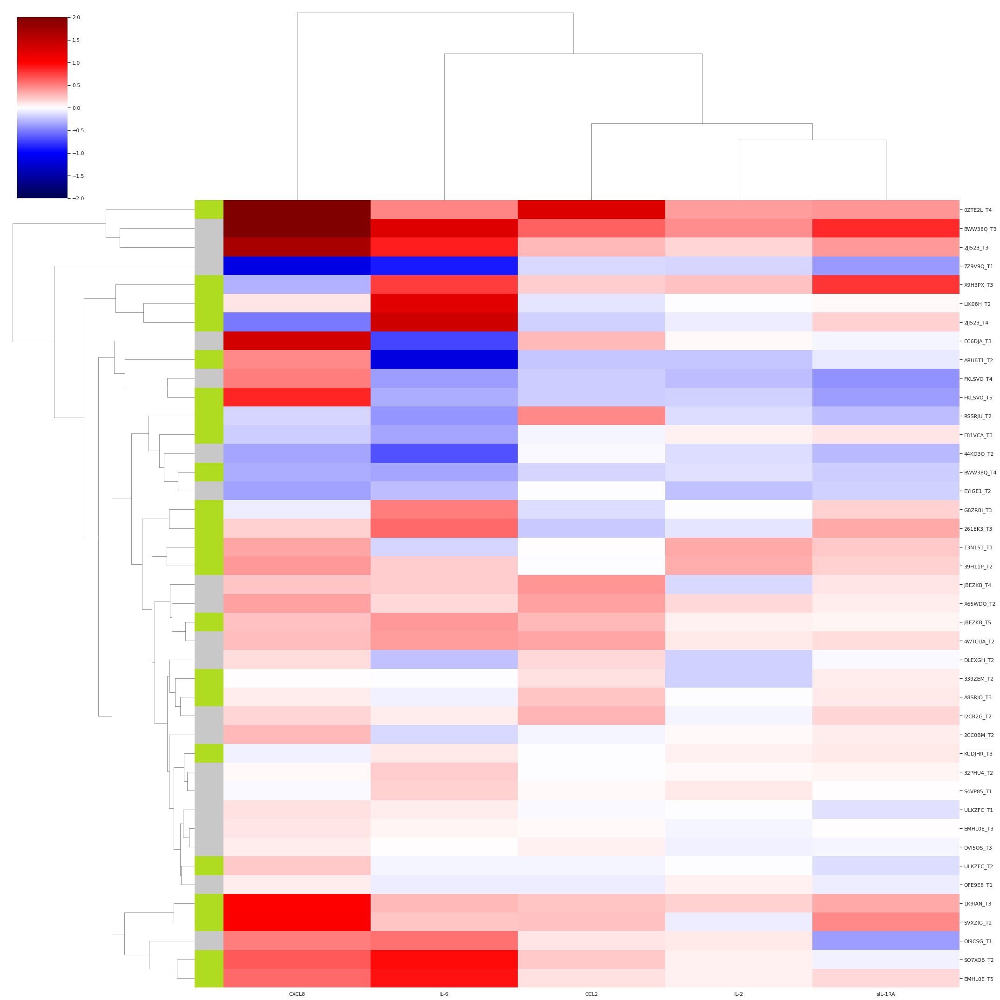

In [ ]:
#log transform
columns_to_drop = [x for x in ['timepoint','sample_id','patient_id'] if x in df_plot.columns]
if log_df ==True:
  df_plot_log = df_plot.drop(columns=columns_to_drop).applymap(lambda x: math.log(x+1,10))
  df_plot_log_subset = df_plot_log.loc[:,cytokine_program]
else:
  df_plot_log = df_plot.drop(columns=columns_to_drop)
  df_plot_log_subset = df_plot_log.loc[:,cytokine_program]
#plot log1p transformed
#divnorm = colors.TwoSlopeNorm(vmin=0, vcenter=2.5, vmax=5)
sns.set(font_scale = 1) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
glog = sns.clustermap(df_plot_log_subset, cmap='seismic', col_cluster=True,row_cluster=True, figsize=(30,30), 
                   row_colors = df_plot.index.map(time_color_dict), z_score= None, vmin=-2, center=0, vmax=2 #norm=divnorm
                   ) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib


In [ ]:
#add average score expression (=average of log fold change)
marker_df_reindex = df_plot_log_subset.copy() #to calculate on data from the heatmap (log transformed normalized)
marker_df_reindex['sample_id'] = marker_df_reindex.index
marker_df_reindex.reset_index(inplace=True)
marker_df_reindex['sum'] =  np.sum(marker_df_reindex.drop(columns=['sample_id']), axis=1) / len(cytokine_program) #zscore sum per sample normalized by length of cyokine set
marker_df_reindex['timepoint'] = marker_df_reindex['sample_id'].map(time_dict)
marker_df_reindex

,index,IL-6,IL-2,sIL-1RA,CXCL8,CCL2,sample_id,sum,timepoint
0,G8ZRBI_T3,0.500971,-0.010405,0.182225,-0.074015,-0.132018,G8ZRBI_T3,0.093351,post2
1,KUDJHR_T3,0.091080,0.053119,0.086793,-0.057865,-0.009041,KUDJHR_T3,0.032817,post2
2,339ZEM_T2,-0.011105,-0.181497,0.072583,0.014457,0.113837,339ZEM_T2,0.001655,post2
3,FKLSVO_T4,-0.377676,-0.257678,-0.437287,0.505990,-0.188845,FKLSVO_T4,-0.151099,post1
4,FKLSVO_T5,-0.316700,-0.187171,-0.382326,0.849903,-0.200300,FKLSVO_T5,-0.047319,post2
5,1K9IAN_T3,0.280945,0.177071,0.339038,1.013763,0.221292,1K9IAN_T3,0.406422,post2
6,X65WDO_T2,0.142129,0.146576,0.065498,0.374089,0.362096,X65WDO_T2,0.218078,post1
7,261EK3_T3,0.589700,-0.102820,0.328895,0.186934,-0.209701,261EK3_T3,0.158602,post2
8,F81VCA_T3,-0.356812,0.054251,0.108293,-0.196358,-0.045479,F81VCA_T3,-0.087221,post2
9,13N151_T1,-0.162433,0.333605,0.207546,0.346720,0.003851,13N151_T1,0.145858,post2


In [ ]:
##reorder dataframe according to order in seaborn clustermap
marker_df_reindex = marker_df_reindex.reindex(glog.dendrogram_row.reordered_ind)
marker_df_reindex.index = marker_df_reindex['sample_id']
marker_df_reindex = marker_df_reindex.drop(columns='sample_id')
marker_df_reindex

,index,IL-6,IL-2,sIL-1RA,CXCL8,CCL2,sum,timepoint
sample_id,,,,,,,,
0ZTE2L_T4,0ZTE2L_T4,0.479154,0.378493,0.413466,2.220757,1.269987,0.952371,post2
BWW38Q_T3,BWW38Q_T3,1.265573,0.442900,0.836819,2.348488,0.614054,1.101567,post1
2JJ523_T3,2JJ523_T3,0.884167,0.164949,0.405901,1.681123,0.268415,0.680911,post1
7Z9V9Q_T1,7Z9V9Q_T1,-0.896226,-0.163848,-0.404889,-1.149611,-0.148757,-0.552666,post1
X9H3PX_T3,X9H3PX_T3,0.762849,0.248751,0.788422,-0.311893,0.196492,0.336924,post2
LIK08H_T2,LIK08H_T2,1.228105,-0.011584,0.027583,0.102125,-0.104240,0.248398,post2
2JJ523_T4,2JJ523_T4,1.380335,-0.077271,0.174037,-0.527225,-0.182140,0.153547,post2
EC6DJA_T3,EC6DJA_T3,-0.723011,0.030928,-0.036277,1.355735,0.279339,0.181343,post1
ARU8T1_T2,ARU8T1_T2,-1.162248,-0.224521,-0.091708,0.466562,-0.228572,-0.248097,post2


Text(0.5, 0, '')

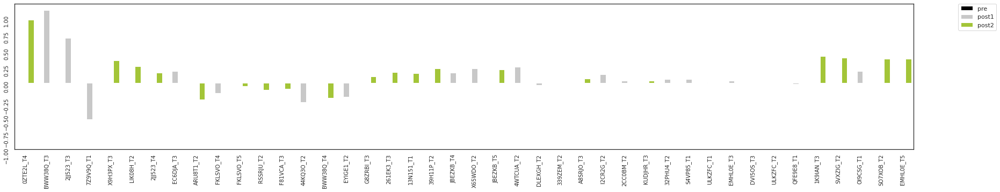

In [ ]:
sns.set_style('white')
fig, axes = plt.subplots(figsize=(30,5))
axes.set_ylim([-1, 1.2])
axes.tick_params(labelsize=10,labelrotation=90)
sns.barplot(x=marker_df_reindex.index, y='sum', hue='timepoint', data=marker_df_reindex, order=None, hue_order=['pre','post1','post2'],palette=timepoint_color_dict)
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
axes.set_ylabel("")
axes.set_xlabel("")


In [ ]:
#get all samples of top 10 patients with highest induction of cytokine programs
top_patients = marker_df_reindex['sum'].sort_values(ascending=False)[0:10].index.str.slice(stop=-3)
sample_df = JK210728_panel1_2_merge_log.copy()
sample_df['patient'] = sample_df.index.str.slice(stop=-3)
sample_df[sample_df['patient'].isin(top_patients)].sort_index().index

Index(['0ZTE2L_T3', '0ZTE2L_T4', '1K9IAN_T2', '1K9IAN_T3', '2JJ523_T2',
       '2JJ523_T3', '2JJ523_T4', '4WTCUA_T1', '4WTCUA_T2', 'BWW38Q_T2',
       'BWW38Q_T3', 'BWW38Q_T4', 'EMHL0E_T2', 'EMHL0E_T3', 'EMHL0E_T5',
       'LIK08H_T1', 'LIK08H_T2', 'SO7XOB_T1', 'SO7XOB_T2', 'SVXZIG_T1',
       'SVXZIG_T2', 'X9H3PX_T2', 'X9H3PX_T3'],
      dtype='object', name='sample_id')

In [ ]:
#how many patients with spec. fold change
len(set(marker_df_reindex[marker_df_reindex['sum']>0.176].index.str.slice(stop=-3)))

15

In [ ]:
#top samples expressing the cytokine program
patient_of_interest = 'EC6DJA'
top_patients = list(marker_df_reindex['sum'].sort_values(ascending=False).index.str.slice(stop= -3))
top_patient_list = list(dict.fromkeys(top_patients))
top_patient_list.index(patient_of_interest)+1 #get the rank of each patient (removed zero index by +1)

14

In [ ]:
#retrieve average fold-change values for gene program
top_patient_subset = top_patient_list[0:20]
sample_df = marker_df_reindex.copy()
sample_df['patient'] = sample_df.index.str.slice(stop=-3)
sample_df_subset = sample_df[sample_df['patient'].isin(top_patient_subset)]
sample_df_subset

,index,IL-6,IL-2,sIL-1RA,CXCL8,CCL2,sum,timepoint,patient
sample_id,,,,,,,,,
0ZTE2L_T4,0ZTE2L_T4,0.479154,0.378493,0.413466,2.220757,1.269987,0.952371,post2,0ZTE2L
BWW38Q_T3,BWW38Q_T3,1.265573,0.442900,0.836819,2.348488,0.614054,1.101567,post1,BWW38Q
2JJ523_T3,2JJ523_T3,0.884167,0.164949,0.405901,1.681123,0.268415,0.680911,post1,2JJ523
X9H3PX_T3,X9H3PX_T3,0.762849,0.248751,0.788422,-0.311893,0.196492,0.336924,post2,X9H3PX
LIK08H_T2,LIK08H_T2,1.228105,-0.011584,0.027583,0.102125,-0.104240,0.248398,post2,LIK08H
2JJ523_T4,2JJ523_T4,1.380335,-0.077271,0.174037,-0.527225,-0.182140,0.153547,post2,2JJ523
EC6DJA_T3,EC6DJA_T3,-0.723011,0.030928,-0.036277,1.355735,0.279339,0.181343,post1,EC6DJA
BWW38Q_T4,BWW38Q_T4,-0.347107,-0.124191,-0.191476,-0.320177,-0.168619,-0.230314,post2,BWW38Q
G8ZRBI_T3,G8ZRBI_T3,0.500971,-0.010405,0.182225,-0.074015,-0.132018,0.093351,post2,G8ZRBI


In [ ]:
#all patients with above median fold change
sample_df = marker_df_reindex.copy()
sample_df['patient'] = sample_df.index.str.slice(stop=-3)
sample_df_subset = sample_df[sample_df['sum'] > 0.12]
sample_df_subset_patients = set(sample_df_subset['patient'])
sample_df_subset_patients

{'0ZTE2L',
 '13N151',
 '1K9IAN',
 '261EK3',
 '2JJ523',
 '39H11P',
 '4WTCUA',
 'BWW38Q',
 'EC6DJA',
 'EMHL0E',
 'I2CR2G',
 'JBEZKB',
 'LIK08H',
 'OI9CSG',
 'SO7XOB',
 'SVXZIG',
 'X65WDO',
 'X9H3PX'}

In [ ]:
len(set(sample_df['patient'] ))

36

In [ ]:
len(sample_df_subset_patients)

18

In [ ]:
marker_df_reindex.sort_values('sum')

,index,IL-6,IL-2,sIL-1RA,CXCL8,CCL2,sum,timepoint
sample_id,,,,,,,,
7Z9V9Q_T1,7Z9V9Q_T1,-0.896226,-0.163848,-0.404889,-1.149611,-0.148757,-0.552666,post1
44KQ3O_T2,44KQ3O_T2,-0.675390,-0.133563,-0.278265,-0.356834,-0.021524,-0.293115,post1
ARU8T1_T2,ARU8T1_T2,-1.162248,-0.224521,-0.091708,0.466562,-0.228572,-0.248097,post2
BWW38Q_T4,BWW38Q_T4,-0.347107,-0.124191,-0.191476,-0.320177,-0.168619,-0.230314,post2
EYIGE1_T2,EYIGE1_T2,-0.263912,-0.234563,-0.175640,-0.364269,-0.003275,-0.208332,post1
FKLSVO_T4,FKLSVO_T4,-0.377676,-0.257678,-0.437287,0.505990,-0.188845,-0.151099,post1
RSSRJU_T2,RSSRJU_T2,-0.419129,-0.135402,-0.251914,-0.161341,0.456863,-0.102185,post2
F81VCA_T3,F81VCA_T3,-0.356812,0.054251,0.108293,-0.196358,-0.045479,-0.087221,post2
FKLSVO_T5,FKLSVO_T5,-0.316700,-0.187171,-0.382326,0.849903,-0.200300,-0.047319,post2


Text(0.5, 1.0, 'logged')

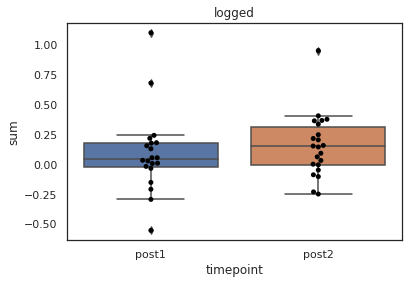

In [ ]:
#plot logged
order_by = ['post1','post2']
sns.boxplot(data=marker_df_reindex,x='timepoint', y='sum', order=order_by)
sns.swarmplot(data=marker_df_reindex,x='timepoint', y='sum',color='#000000',order=order_by )
plt.title('logged')

In [ ]:
scipy.stats.wilcoxon(marker_df_reindex['sum']-0, zero_method='wilcox',correction=False)

WilcoxonResult(statistic=232.0, pvalue=0.006059315021914235)

In [ ]:
post1_scores = np.array(marker_df_reindex[marker_df_reindex['timepoint']=='post1']['sum'])
post2_scores = np.array(marker_df_reindex[marker_df_reindex['timepoint']=='post2']['sum'])
print('one sample wilcoxon test post1 result (expected fold change is 0 = log(1)):',scipy.stats.wilcoxon(post1_scores-0, zero_method='wilcox',correction=False))
print('one sample wilcoxon test post2 result (expected fold change is 0 = log(1)):',scipy.stats.wilcoxon(post2_scores-0, zero_method='wilcox',correction=False))

one sample wilcoxon test post1 result (expected fold change is 0 = log(1)): WilcoxonResult(statistic=67.0, pvalue=0.16495704650878906)
one sample wilcoxon test post2 result (expected fold change is 0 = log(1)): WilcoxonResult(statistic=49.0, pvalue=0.010324478149414062)


In [ ]:
len(set(marker_df_reindex['index'].str.slice(stop=-3)))

36

# Correlation with clinical data

In [ ]:
#patient metadata
patient_table[patient_table['Second_dose_vaccine'].isna()]

,Sex,Age_at_inclusion,BMI,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,First_dose_date,First_dose_vaccine,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,color_code,Survival_01.10.21
Patient_ID,,,,,,,,,,,,,,,,,,,
MXSP3T,F,50,29.8,UVM,IV,PD-1/PD-L1,1,False,NaN,NaN,NaN,NaN,7/13/2020,1/21/2021,8/21/2021,404,NaN,#8E2BDD,1
LH6ZAL,F,64,NaN,ACC,IV,PD-1/PD-L1,2,False,NaN,NaN,NaN,NaN,7/17/2020,5/6/2021,10/1/2021,441,NaN,#6AD4DB,0
D9SB9D,M,66,NaN,SKCM,IV,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,7/27/2020,1/29/2021,10/1/2021,431,NaN,#513FAA,0
7O6TMW,M,40,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,8/18/2020,4/21/2021,10/1/2021,409,NaN,#61381D,0
V8LVB1,M,67,20.8,SKCM,IIB,CTLA-4+PD-1,3,False,NaN,NaN,NaN,NaN,9/16/2020,2/19/2021,8/7/2021,325,NaN,#CAB8CD,1
C1ABPH,M,69,18.7,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2,False,NaN,NaN,NaN,NaN,9/25/2020,1/28/2021,10/1/2021,371,NaN,#F1FE76,0
H42U5T,F,53,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,9/28/2020,7/20/2021,7/20/2021,295,NaN,#3E5446,0
KQQNSB,M,60,30.9,KIRC,III,PD-1/PD-L1+TKI,1,False,NaN,NaN,NaN,NaN,10/2/2020,8/10/2021,10/1/2021,364,NaN,#BC41A1,0
XL3D1Y,M,70,27.8,KIRC,I,PD-1/PD-L1,3,False,NaN,NaN,NaN,NaN,10/14/2020,2/24/2021,10/1/2021,352,NaN,#CAA0E0,0


In [ ]:
#patient above median cytokine program expression (calculated above)
sample_df_subset_patients

{'0ZTE2L',
 '13N151',
 '1K9IAN',
 '261EK3',
 '2JJ523',
 '39H11P',
 '4WTCUA',
 'BWW38Q',
 'EC6DJA',
 'EMHL0E',
 'I2CR2G',
 'JBEZKB',
 'LIK08H',
 'OI9CSG',
 'SO7XOB',
 'SVXZIG',
 'X65WDO',
 'X9H3PX'}

In [ ]:
df = patient_table
#df_save_path = covid_2nd_dose_leuko_path

#function to define nans
def isna(x):
  return x!=x

vaccine_type = {}
for i in patient_table.index: 
  a = patient_table.loc[i,'First_dose_vaccine']
  b = patient_table.loc[i,'Second_dose_vaccine']
  if isna(a):
    vaccine_type[i]='NA'
  elif isna(b):
    vaccine_type[i]=a
  elif a==b:
      vaccine_type[i]=a
  else:
    vaccine_type[i]='heterologous'

df['vaccine_type'] = df.index.map(vaccine_type)
#df.to_csv(df_save_path)
df

,Sex,Age_at_inclusion,BMI,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,First_dose_date,First_dose_vaccine,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,color_code,Survival_01.10.21,vaccine_type
Patient_ID,,,,,,,,,,,,,,,,,,,,
MXSP3T,F,50,29.8,UVM,IV,PD-1/PD-L1,1,False,NaN,NaN,NaN,NaN,7/13/2020,1/21/2021,8/21/2021,404,NaN,#8E2BDD,1,NA
LH6ZAL,F,64,NaN,ACC,IV,PD-1/PD-L1,2,False,NaN,NaN,NaN,NaN,7/17/2020,5/6/2021,10/1/2021,441,NaN,#6AD4DB,0,NA
D9SB9D,M,66,NaN,SKCM,IV,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,7/27/2020,1/29/2021,10/1/2021,431,NaN,#513FAA,0,NA
7O6TMW,M,40,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,8/18/2020,4/21/2021,10/1/2021,409,NaN,#61381D,0,NA
V8LVB1,M,67,20.8,SKCM,IIB,CTLA-4+PD-1,3,False,NaN,NaN,NaN,NaN,9/16/2020,2/19/2021,8/7/2021,325,NaN,#CAB8CD,1,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
J79PAG,M,70,21.3,LIHC,IV,PD-1/PD-L1+anti-VEGF,1,True,4/23/2021,Comirnaty,6/6/2021,Comirnaty,4/30/2021,10/1/2021,10/1/2021,154,161.0,#E20DC4,0,Comirnaty
9R3KE7,F,62,NaN,UVM,<IV,PD-1/PD-L1,1,True,4/7/2021,Comirnaty,5/4/2021,Comirnaty,5/19/2021,10/1/2021,10/1/2021,135,177.0,#8F25FC,0,Comirnaty
19U0MP,M,65,26.2,UVM,IV,PD-1/PD-L1,1,True,4/29/2021,Comirnaty,6/8/2021,Comirnaty,5/20/2021,8/12/2021,10/1/2021,134,155.0,#42A0D7,0,Comirnaty


Wilcoxon signed rank for Comirnaty is: WilcoxonResult(statistic=146.0, pvalue=0.009594191207355557)
Wilcoxon signed rank for Moderna is: WilcoxonResult(statistic=1.0, pvalue=1.0)
Wilcoxon signed rank for Astra Zeneca is: WilcoxonResult(statistic=5.0, pvalue=0.625)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

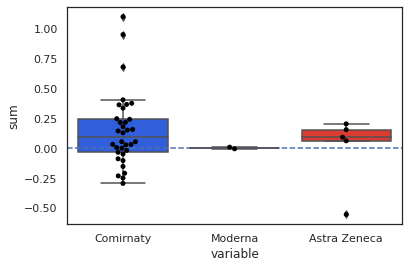

In [ ]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = vaccine_type
order_by = ['Comirnaty','Moderna','Astra Zeneca']
save_name = 'vaccine_type.svg'

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)

#plot

sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,palette=vaccine_type_dict)
sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
plt.axhline(y=0, ls='dashed')
for i in order_by:
  print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.savefig(save_name)
files.download(save_name)

In [ ]:
#dictionaries for relevant clinical variables
therapy_dict = patient_table['Therapy_type'].to_dict()
tumor_dict  = patient_table['Tumor_type'].to_dict()
sex_dict  = patient_table['Sex'].to_dict()
line_dict  = patient_table['Therapy_Line'].to_dict()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

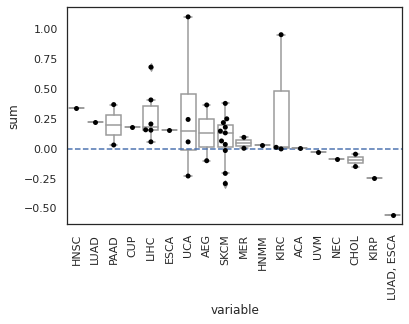

In [ ]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = tumor_dict
order_variables = False
#order_by = ['Comirnaty','Moderna','Astra Zeneca']
sort_values = True
save_name = 'tumor_type.svg'

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)

#sort
if sort_values:
  order_list = list(df_plot.groupby('variable').median().sort_values('sum',ascending=False).index)

#plot
if order_variables:
  sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            palette=vaccine_type_dict
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  if sort_values:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_list,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_list)

plt.axhline(y=0, ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.savefig(save_name)
plt.xticks(rotation='vertical')
files.download(save_name)

Wilcoxon signed rank for F is: WilcoxonResult(statistic=26.0, pvalue=0.33935546875)
Wilcoxon signed rank for M is: WilcoxonResult(statistic=104.0, pvalue=0.008216736457590426)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

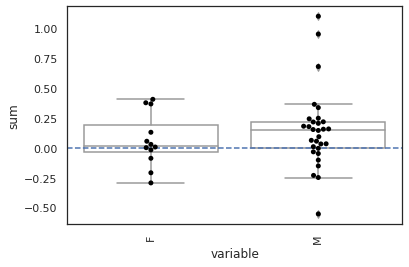

In [ ]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = sex_dict
order_variables = True
order_by = ['F','M']
sort_values = True
save_name = 'sex.svg'

give_color_dict = False
color_dict = vaccine_type_dict

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)

#sort
if sort_values:
  order_list = list(df_plot.groupby('variable').median().sort_values('sum',ascending=False).index)

#plot
if order_variables:
  if give_color_dict:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            palette=vaccine_type_dict
            )
  else:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            color='#FFFFFF'
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  if sort_values:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_list,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_list)

plt.axhline(y=0, ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.savefig(save_name)
plt.xticks(rotation='vertical')
files.download(save_name)

In [ ]:
scipy.stats.wilcoxon(df_plot[df_plot['variable']=='F']['sum']-df_plot[df_plot['variable']=='M']['sum'], zero_method='wilcox',correction=False)

WilcoxonResult(statistic=0.0, pvalue=1.6479364449501875e-08)

In [ ]:
#merge some values
line_dict_simplified = line_dict.copy()
for i,v in line_dict.items():
  if v >3:
    line_dict_simplified[i] = '>3'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

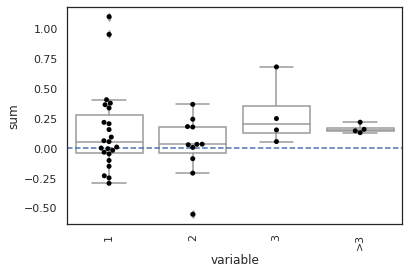

In [ ]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = line_dict_simplified
order_variables = False
order_by = [1,2,3,'>3']
sort_values = False
save_name = 'line.svg'

give_color_dict = False
color_dict = vaccine_type_dict

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = pd.Categorical(df_plot['patient_id'].map(variable_dict))

#sort
if sort_values:
  order_list = list(df_plot.groupby('variable').median().sort_values('sum',ascending=False).index)

#plot
if order_variables:
  if give_color_dict:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            palette=vaccine_type_dict
            )
  else:
    sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            color='#FFFFFF'
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  if sort_values:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_list,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_list)
  else:
    sns.boxplot(data=df_plot,x='variable', y='sum',order=order_by,color='#FFFFFF')
    sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by)

plt.axhline(y=0
            , ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.savefig(save_name)
plt.xticks(rotation='vertical')
files.download(save_name)

In [ ]:
#adjust therapy dict:
set(therapy_dict.values())

{'CTLA-4',
 'CTLA-4+PD-1/PD-L1',
 'ICT-->CTX',
 'PD-1/PD-L1',
 'PD-1/PD-L1+CTX',
 'PD-1/PD-L1+RTX',
 'PD-1/PD-L1+TKI',
 'PD-1/PD-L1+anti-VEGF',
 'other'}

In [ ]:
therapy_dict = {'CTLA-4':'CTLA-4',
 'CTLA-4/PD-1':'CTLA-4+PD-1/PD-L1',
 'CTLA-4/PD-1 -> CTH': 'ICT-->CTX',
 'CTLA-4/PD-1/CCR5':'other',
 'PD-1':'PD-1/PD-L1',
 'PD-1 -> CTH':'ICT-->CTX',
 'PD-1/CTH':'PD-1/PD-L1+CTX',
 'PD-1/MAB':'PD-1/PD-L1+anti-VEGF',
 'PD-1/RTX':'PD-1/PD-L1+RTX',
 'PD-1/TA':'other',
 'PD-1/TKI':'PD-1/PD-L1+TKI',
 'PD-1/TKI -> PD-1/CTH':'PD-1/PD-L1+CTX',
 'PD-L1':'PD-1/PD-L1',
 'PD-L1 -> MAB':'other',
 'PD-L1/CTH':'PD-1/PD-L1+CTX',
 'PD-L1/CTH -> CTH':'ICT-->CTX',
 'PD-L1/MAB':'PD-1/PD-L1+anti-VEGF',
 'PD-L1/RTX':'PD-1/PD-L1+RTX',
 'PD-L1/TKI':'PD-1/PD-L1+TKI'}

In [ ]:
patient_table['Therapy_type']

Patient_ID
MXSP3T           PD-1
LH6ZAL           PD-1
D9SB9D    CTLA-4/PD-1
7O6TMW    CTLA-4/PD-1
V8LVB1    CTLA-4/PD-1
             ...     
J79PAG      PD-L1/MAB
9R3KE7           PD-1
19U0MP           PD-1
688HB6    CTLA-4/PD-1
ZGNF1D    CTLA-4/PD-1
Name: Therapy_type, Length: 96, dtype: object

In [ ]:
for i,v in therapy_dict.items():
  

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

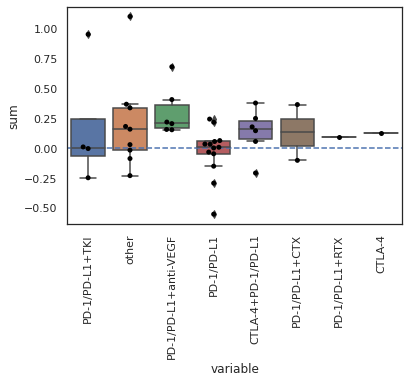

In [ ]:
#plot by subgroup
df_plot = marker_df_reindex
variable_dict = therapy_dict
order_variables = False
#order_by = ['Comirnaty','Moderna','Astra Zeneca']
save_name = 'therapy_type.svg'

#add variable data to df
df_plot['patient_id'] = df_plot.index.str.slice(stop=-3)
df_plot['variable'] = df_plot['patient_id'].map(variable_dict)

#plot
if order_variables:
  sns.boxplot(data=df_plot,x='variable', y='sum', order=order_by,
            palette=vaccine_type_dict
            )
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000',order=order_by )
else:
  sns.boxplot(data=df_plot,x='variable', y='sum')
  sns.swarmplot(data=df_plot,x='variable', y='sum',color='#000000')

plt.axhline(y=0, ls='dashed')
if order_variables:
  for i in order_by:
    print('Wilcoxon signed rank for',i,'is:',scipy.stats.wilcoxon(df_plot[df_plot['variable']==i]['sum']-0, zero_method='wilcox',correction=False))
plt.savefig(save_name)
plt.xticks(rotation='vertical')
files.download(save_name)

# Survival analysis

In [ ]:
#this section with code adapted from https://medium.com/towards-artificial-intelligence/survival-analysis-with-python-tutorial-how-what-when-and-why-19a5cfb3c312
import lifelines
from lifelines import KaplanMeierFitter

In [ ]:
os_time_column = 'follow_up_from_ICT_days'
os_status_column = 'Survival_01.10.21'

In [ ]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'Tumor_type', 'Stage', 'Therapy_type',
       'Therapy_Line', 'vaccinated', 'First_dose_date', 'First_dose_vaccine',
       'Second_dose_date', 'Second_dose_vaccine', 'date_inclusion',
       'last_immunotherapy', 'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days', 'color_code',
       'Survival_01.10.21'],
      dtype='object')

In [ ]:
#create an object for kaplan-meier-fitter
kmf= KaplanMeierFitter()

In [ ]:
#fit the parameter values
kmf.fit(durations = patient_table[os_time_column], event_observed = patient_table[os_status_column])

<lifelines.KaplanMeierFitter:"KM_estimate", fitted with 96 total observations, 81 right-censored observations>

In [ ]:
#generate event table
kmf.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,96,96
30.0,2,2,0,0,96
44.0,1,1,0,0,94
61.0,1,1,0,0,93
62.0,1,1,0,0,92
...,...,...,...,...,...
451.0,1,0,1,0,5
463.0,1,0,1,0,4
470.0,1,0,1,0,3


Text(0, 0.5, 'probability of survival')

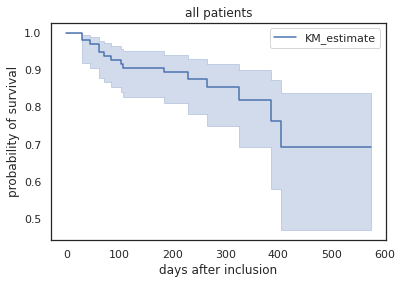

In [ ]:
#plot all patients
kmf.plot()
plt.title('all patients')
plt.xlabel('days after inclusion')
plt.ylabel('probability of survival')

In [ ]:
#split data
patients_vacc = patient_table[patient_table['vaccinated']]
patients_novacc = patient_table[~patient_table['vaccinated']]

In [ ]:
print('all patients:', patient_table.shape[0])
print('vaccinated patients', patients_vacc.shape[0])
print('unvaccinated patients', patients_novacc.shape[0])

all patients: 96
vaccinated patients 70
unvaccinated patients 26


In [ ]:
#fit the parameter values
kmf_high = KaplanMeierFitter()
kmf_low = KaplanMeierFitter()

kmf_high.fit(durations = patients_vacc[os_time_column], event_observed = patients_vacc[os_status_column],label='vac')
kmf_low.fit(durations = patients_novacc[os_time_column], event_observed = patients_novacc[os_status_column],label='novacc')

<lifelines.KaplanMeierFitter:"novacc", fitted with 26 total observations, 17 right-censored observations>

In [ ]:
kmf_high.event_table

,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,70,70
44.0,1,1,0,0,70
62.0,1,1,0,0,69
85.0,1,1,0,0,68
107.0,1,1,0,0,67
...,...,...,...,...,...
451.0,1,0,1,0,5
463.0,1,0,1,0,4
470.0,1,0,1,0,3


Text(0, 0.5, 'probability of survival')

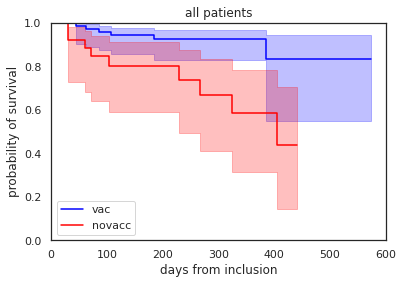

In [ ]:
#plot all patients
X = np.linspace(-6, 6, 1024)
plt.ylim(0, 1)
plt.xlim(0,600)
kmf_high.plot(ci_show=True, color='blue')
kmf_low.plot(ci_show=True, color='red')
plt.title('all patients')
plt.xlabel('days from inclusion')
plt.ylabel('probability of survival')

In [ ]:
#variables for logrank
Time_A = patients_vacc[os_time_column]
Event_A = patients_vacc[os_status_column]

Time_B = patients_novacc[os_time_column]
Event_B = patients_novacc[os_status_column]

In [ ]:
#logrank
from lifelines.statistics import logrank_test

results = logrank_test(Time_A, Time_B, event_observed_A=Event_A, event_observed_B=Event_B)
results.print_summary()
print('P value is:', results.p_value)

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
           8.73 <0.005      8.32

P value is: 0.003138468535301976


## cox model

In [ ]:
patient_table

,Sex,Age_at_inclusion,BMI,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,First_dose_date,First_dose_vaccine,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,color_code,Survival_01.10.21
Patient_ID,,,,,,,,,,,,,,,,,,,
MXSP3T,F,50,29.8,UVM,IV,PD-1/PD-L1,1,False,NaN,NaN,NaN,NaN,7/13/2020,1/21/2021,8/21/2021,404,NaN,#8E2BDD,1
LH6ZAL,F,64,NaN,ACC,IV,PD-1/PD-L1,2,False,NaN,NaN,NaN,NaN,7/17/2020,5/6/2021,10/1/2021,441,NaN,#6AD4DB,0
D9SB9D,M,66,NaN,SKCM,IV,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,7/27/2020,1/29/2021,10/1/2021,431,NaN,#513FAA,0
7O6TMW,M,40,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,8/18/2020,4/21/2021,10/1/2021,409,NaN,#61381D,0
V8LVB1,M,67,20.8,SKCM,IIB,CTLA-4+PD-1,3,False,NaN,NaN,NaN,NaN,9/16/2020,2/19/2021,8/7/2021,325,NaN,#CAB8CD,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
J79PAG,M,70,21.3,LIHC,IV,PD-1/PD-L1+anti-VEGF,1,True,4/23/2021,Comirnaty,6/6/2021,Comirnaty,4/30/2021,10/1/2021,10/1/2021,154,161.0,#E20DC4,0
9R3KE7,F,62,NaN,UVM,<IV,PD-1/PD-L1,1,True,4/7/2021,Comirnaty,5/4/2021,Comirnaty,5/19/2021,10/1/2021,10/1/2021,135,177.0,#8F25FC,0
19U0MP,M,65,26.2,UVM,IV,PD-1/PD-L1,1,True,4/29/2021,Comirnaty,6/8/2021,Comirnaty,5/20/2021,8/12/2021,10/1/2021,134,155.0,#42A0D7,0


In [ ]:
from lifelines import CoxPHFitter

In [ ]:
set(patient_table['Tumor_type'])

{'ACA',
 'ACC',
 'AEG',
 'BRCA',
 'CHOL',
 'CUP',
 'DSCC',
 'ESCA',
 'HNMM',
 'HNSC',
 'KIRC',
 'KIRP',
 'LIHC',
 'LUAD',
 'LUAD, ESCA',
 'MER',
 'NEC',
 'NET',
 'NSCLC, HNSC',
 'OSCC',
 'PAAD',
 'RCC',
 'SKCM',
 'STAD',
 'UCA',
 'UVM'}

In [ ]:
patient_table.shape

(96, 19)

In [ ]:
#adjest categories for cox model
tumor_type_fine = False #if split all major tumor types in dummy variables (this is very ineffective bc of broad array of tumor types)
data = patient_table.copy()

stage_dict = {'<IV':0, 'I':0, 'IB':0, 'II':0, 'IIA':0, 'IIB':0, 'III':0, 'IIIB':0, 
 'IIIC':0, 'IV':1, 'IVA':1}
sex_dict = {'F':1,'M':0}
vaccinated_dict = {True:1,False:0}
if tumor_type_fine ==True:
  tumor_type_dict = {'ACA':'GI',
 'ACC':'other',
 'AEG':'GI',
 'BRCA':'GYN',
 'CHOL':'GI',
 'CUP':'other',
 'DSCC':'DERM',
 'ESCA':'GI',
 'HNMM':'HN',
 'HNSC':'HN',
 'KIRC':'URO',
 'KIRP':'URO',
 'LIHC':'GI',
 'LUAD':'other',
 'LUAD, ESCA':'GI',
 'MER':'DERM',
 'NEC':'other',
 'NET':'other',
 'NSCLC, HNSC':'other',
 'OSCC':'HN',
 'PAAD':'GI',
 'RCC':'URO',
 'SKCM':'DERM',
 'STAD':'GI',
 'UCA':'URO',
 'UVM':'DERM'}


data['Stage'] = data['Stage'].map(stage_dict).astype(float)
data['Sex'] = data['Sex'].map(sex_dict).astype(float)
data['vaccinated'] = data['vaccinated'].map(vaccinated_dict).astype(float)
data['Tumor_type'] = data['Tumor_type'].map(tumor_type_dict)

columns_to_drop = ['First_dose_date', 'First_dose_vaccine',
       'Second_dose_date', 'Second_dose_vaccine', 'date_inclusion',
       'last_immunotherapy', 'last_follow_up',
       'follow_up_from_first_dose_vaccine_days', 'color_code',
       'BMI','Tumor_type','Therapy_type']

if tumor_type_fine ==True:
  columns_to_drop = columns_to_drop +['other']

#convert categories into dummy columns
if tumor_type_fine ==True:
  data = pd.concat([pd.get_dummies(data['Tumor_type']),data],axis=1)
data = data.drop(columns=columns_to_drop)
data=data.dropna()
data

,Sex,Age_at_inclusion,Stage,Therapy_Line,vaccinated,follow_up_from_ICT_days,Survival_01.10.21
Patient_ID,,,,,,,
MXSP3T,1.0,50,1.0,1,0.0,404,1
LH6ZAL,1.0,64,1.0,2,0.0,441,0
D9SB9D,0.0,66,1.0,1,0.0,431,0
7O6TMW,0.0,40,0.0,1,0.0,409,0
V8LVB1,0.0,67,0.0,3,0.0,325,1
...,...,...,...,...,...,...,...
J79PAG,0.0,70,1.0,1,1.0,154,0
9R3KE7,1.0,62,0.0,1,1.0,135,0
19U0MP,0.0,65,1.0,1,1.0,134,0


In [ ]:
data.loc['J79PAG',:]

Sex                          0.0
Age_at_inclusion            70.0
Stage                        1.0
Therapy_Line                 1.0
vaccinated                   1.0
follow_up_from_ICT_days    154.0
Survival_01.10.21            0.0
Name: J79PAG, dtype: float64

In [ ]:
#fit data
kmf=KaplanMeierFitter()
kmf.fit(durations = data[os_time_column],event_observed= data[os_status_column])
kmf.event_table


,removed,observed,censored,entrance,at_risk
event_at,,,,,
0.0,0,0,0,96,96
30.0,2,2,0,0,96
44.0,1,1,0,0,94
61.0,1,1,0,0,93
62.0,1,1,0,0,92
...,...,...,...,...,...
451.0,1,0,1,0,5
463.0,1,0,1,0,4
470.0,1,0,1,0,3


In [ ]:
#get the summary using CoxPH Fitter:
cph = CoxPHFitter()
cph.fit(data, os_time_column, event_col=os_status_column)
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 96 total observations, 81 right-censored observations>
             duration col = 'follow_up_from_ICT_days'
                event col = 'Survival_01.10.21'
      baseline estimation = breslow
   number of observations = 96
number of events observed = 15
   partial log-likelihood = -54.77
         time fit was run = 2021-11-13 15:46:40 UTC

---
                   coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                
Sex                0.38       1.46       0.59            -0.78             1.54                 0.46                 4.68
Age_at_inclusion   0.03       1.03       0.03            -0.03             0.08                 0.97                 1.09
Stage             -0.27       0.76       0.56            -1.36             0.82                 0.26                 2.27
Therapy_Line       0.26       1.30       0.14            -0.02             0.54                 0.98                 1.71
vaccinated        -1.47       0.23       0.53            -2.51            -0.43                 0.08                 0.65

                     z    p   -log2(p)
covariate                             
Sex               0.64 0.52       0.94
Age_at_inclusion  0.87 0.39       1.38
Stage            -0.49 0.62       0.68
Therapy_Line      1.85 0.06       3.95
vaccinated       -2.76 0.01       7.45
---
Concordance = 0.78
Partial AIC = 119.53
log-likelihood ratio test = 12.03 on 5 df
-log2(p) of ll-ratio test = 4.86

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

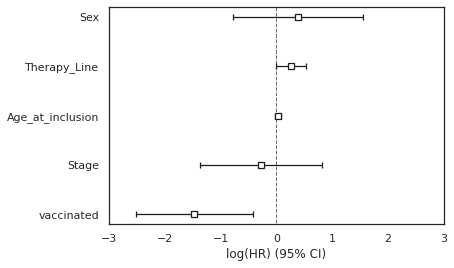

In [ ]:
save_name = 'cox.svg'
fig, axes = plt.subplots()
fig = cph.plot()
axes.set_xlim([-3, 3])
plt.savefig(save_name)
files.download(save_name)

# propensity score matching

In [18]:
#unfortunately we have to downgrade pandas for this package
%pip install pandas==0.23.4

     |████████████████████████████████| 8.8 MB 8.0 MB/s 
  Attempting uninstall: pandas
    Found existing installation: pandas 1.1.5
    Uninstalling pandas-1.1.5:
      Successfully uninstalled pandas-1.1.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xarray 0.18.2 requires pandas>=1.0, but you have pandas 0.23.4 which is incompatible.
pymc3 3.11.4 requires pandas>=0.24.0, but you have pandas 0.23.4 which is incompatible.
plotnine 0.6.0 requires pandas>=0.25.0, but you have pandas 0.23.4 which is incompatible.
mizani 0.6.0 requires pandas>=0.25.0, but you have pandas 0.23.4 which is incompatible.
google-colab 1.0.0 requires pandas~=1.1.0; python_version >= "3.0", but you have pandas 0.23.4 which is incompatible.
fbprophet 0.7.1 requires pandas>=1.0.4, but you have pandas 0.23.4 which is incompatible.
anndata 0.7.5 requires pandas!=1.1,>=1.0, but you have p

In [81]:
import warnings
warnings.filterwarnings('ignore')
from pymatch.Matcher import Matcher
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from google.colab import files

In [60]:
DATA_DIR = '/content/drive/My Drive/infergnostics/clinical_trials/ANTICIPATE/covid/'
patient_table_path = DATA_DIR + 'ANTICIPATE_cohort1_patient_info_all_v3.csv'

In [61]:
patient_table = pd.read_csv(patient_table_path,index_col='Patient_ID')
patient_table

,Sex,Age_at_inclusion,BMI,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,First_dose_date,First_dose_vaccine,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,color_code,Survival_01.10.21
Patient_ID,,,,,,,,,,,,,,,,,,,
MXSP3T,F,50,29.8,UVM,IV,PD-1/PD-L1,1,False,NaN,NaN,NaN,NaN,7/13/2020,1/21/2021,8/21/2021,404,NaN,#8E2BDD,1
LH6ZAL,F,64,NaN,ACC,IV,PD-1/PD-L1,2,False,NaN,NaN,NaN,NaN,7/17/2020,5/6/2021,10/1/2021,441,NaN,#6AD4DB,0
D9SB9D,M,66,NaN,SKCM,IV,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,7/27/2020,1/29/2021,10/1/2021,431,NaN,#513FAA,0
7O6TMW,M,40,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,8/18/2020,4/21/2021,10/1/2021,409,NaN,#61381D,0
V8LVB1,M,67,20.8,SKCM,IIB,CTLA-4+PD-1,3,False,NaN,NaN,NaN,NaN,9/16/2020,2/19/2021,8/7/2021,325,NaN,#CAB8CD,1
C1ABPH,M,69,18.7,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2,False,NaN,NaN,NaN,NaN,9/25/2020,1/28/2021,10/1/2021,371,NaN,#F1FE76,0
H42U5T,F,53,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaN,NaN,NaN,NaN,9/28/2020,7/20/2021,7/20/2021,295,NaN,#3E5446,0
KQQNSB,M,60,30.9,KIRC,III,PD-1/PD-L1+TKI,1,False,NaN,NaN,NaN,NaN,10/2/2020,8/10/2021,10/1/2021,364,NaN,#BC41A1,0
XL3D1Y,M,70,27.8,KIRC,I,PD-1/PD-L1,3,False,NaN,NaN,NaN,NaN,10/14/2020,2/24/2021,10/1/2021,352,NaN,#CAA0E0,0


In [62]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'Tumor_type', 'Stage', 'Therapy_type',
       'Therapy_Line', 'vaccinated', 'First_dose_date', 'First_dose_vaccine',
       'Second_dose_date', 'Second_dose_vaccine', 'date_inclusion',
       'last_immunotherapy', 'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days', 'color_code',
       'Survival_01.10.21'],
      dtype='object')

In [63]:
#calculate vacc timepoint from inclusion
patient_table['First_dose_date'] = pd.to_datetime(patient_table['First_dose_date'],format="%m/%d/%Y")
patient_table['date_inclusion'] = pd.to_datetime(patient_table['date_inclusion'],format="%m/%d/%Y")

In [64]:
#calculate vacc timepoint from inclusion
patient_table['first_vacc_from_inclusion'] = patient_table['First_dose_date'] - patient_table['date_inclusion'] 

In [65]:
data = patient_table.copy()
data['Patient_ID'] = patient_table.index
fields = ['Sex','vaccinated','Age_at_inclusion','Patient_ID']
# 'Therapy_type',,'Stage''Therapy_Line']

In [66]:
#adjust data and remove variable with low variation bc these will confound the regression
stage_dict = {'<IV':0, 'I':0, 'IB':0, 'II':0, 'IIA':0, 'IIB':0, 'III':0, 'IIIB':0, 
 'IIIC':0, 'IV':1, 'IVA':1}
line_dict = {1:1, 2:2, 3:3, 4:4, 5:4, 6:4, 7:4, 8:4}
data['Stage'] = pd.Categorical(data['Stage'].map(stage_dict))
data['Therapy_Line'] = pd.Categorical(data['Therapy_Line'].map(line_dict))

In [67]:
data = data[fields]
data

,Sex,vaccinated,Age_at_inclusion,Patient_ID
Patient_ID,,,,
MXSP3T,F,False,50,MXSP3T
LH6ZAL,F,False,64,LH6ZAL
D9SB9D,M,False,66,D9SB9D
7O6TMW,M,False,40,7O6TMW
V8LVB1,M,False,67,V8LVB1
C1ABPH,M,False,69,C1ABPH
H42U5T,F,False,53,H42U5T
KQQNSB,M,False,60,KQQNSB
XL3D1Y,M,False,70,XL3D1Y


In [68]:
test = data[data.vaccinated == True]
control = data[data.vaccinated == False]
test.loc[:,'vaccinated'] = 0
control.loc[:,'vaccinated'] = 1

In [69]:
m = Matcher(test, control, yvar="vaccinated", exclude=['Patient_ID'])

Formula:
vaccinated ~ Sex+Age_at_inclusion
n majority: 70
n minority: 26


In [70]:
np.random.seed(20170925)
m.fit_scores(balance=True, 
                                     #nmodels=100
                                     )

Fitting Models on Balanced Samples: 10\10
Average Accuracy: 52.31%


In [71]:
#assign propensity scores
m.predict_scores()

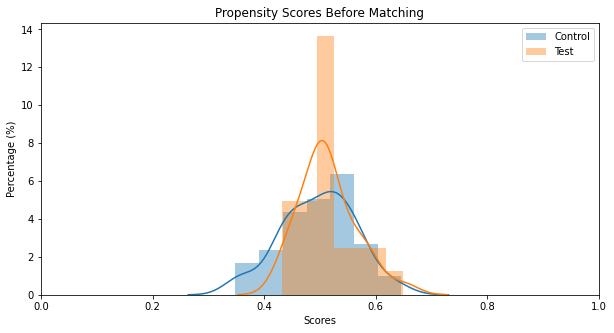

In [72]:
#plot propensity scores
m.plot_scores()

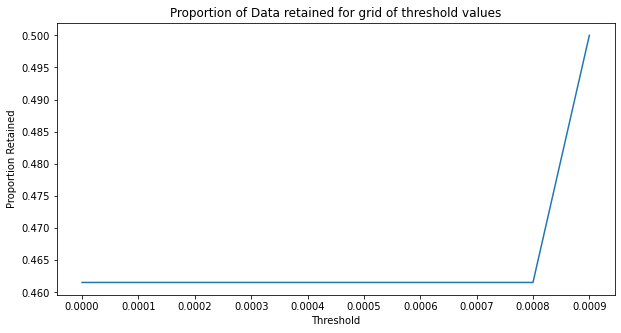

In [73]:
#method min looks for nearest neighbor/propensity score, greedy method random looks for any neighbor within a defined threshold
m.tune_threshold(method='random')

In [74]:
m.match(method="min", nmatches=1)
m.record_frequency()

,freq,n_records
0,1,40
1,2,4
2,4,1


In [75]:
m.assign_weight_vector()

In [76]:
m.matched_data.sort_values("match_id").head(6)

,record_id,weight,Sex,vaccinated,Age_at_inclusion,Patient_ID,scores,match_id
2,1,1.0,F,0,50,VMQLNV,0.524926,0
26,70,1.0,F,1,50,MXSP3T,0.524926,0
19,57,1.0,M,0,79,3LPKO0,0.442537,1
27,71,1.0,F,1,64,LH6ZAL,0.444062,1
28,72,1.0,M,1,66,D9SB9D,0.516770,2
23,67,0.5,M,0,65,19U0MP,0.522608,2


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

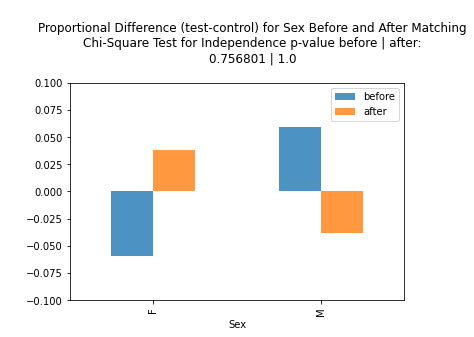

In [82]:
savename = 'matching_sex.svg'
categorical_results = m.compare_categorical(return_table=True)
plt.savefig(savename)
files.download(savename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

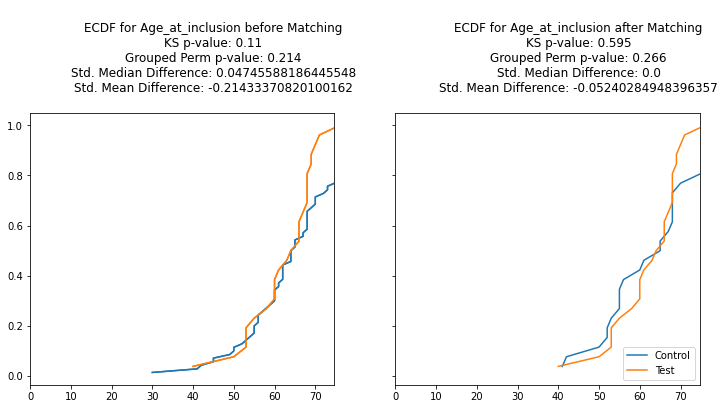

In [83]:
savename = 'matching_age.svg'
cc = m.compare_continuous(return_table=True)
plt.savefig(savename)
files.download(savename)

In [23]:
m.matched_data

,record_id,weight,Sex,vaccinated,Age_at_inclusion,Patient_ID,scores,match_id
0,0,0.50,M,0,75,EK6BCT,0.464666,19
1,0,0.50,M,0,75,EK6BCT,0.464666,23
2,1,1.00,F,0,50,VMQLNV,0.524926,0
3,3,1.00,M,0,55,NQ46IB,0.579095,25
4,23,0.50,F,0,55,EMHL0E,0.496273,5
5,23,0.50,F,0,55,EMHL0E,0.496273,21
6,25,0.25,M,0,68,261EK3,0.505076,11
7,25,0.25,M,0,68,261EK3,0.505076,14
8,25,0.25,M,0,68,261EK3,0.505076,15
9,25,0.25,M,0,68,261EK3,0.505076,22


In [24]:
control = control.drop(columns=['Patient_ID'])
control = control.reset_index()

In [25]:
#create matching dict
match_dict = control['Patient_ID'].to_dict()
match_dict

#convert matching Ids to patient ids
matched_patients = pd.DataFrame(m.matched_data)
matched_patients['match_id']= matched_patients['match_id'].map(match_dict)
matched_patients

,record_id,weight,Sex,vaccinated,Age_at_inclusion,Patient_ID,scores,match_id
0,0,0.50,M,0,75,EK6BCT,0.464666,J2Z8MC
1,0,0.50,M,0,75,EK6BCT,0.464666,7F3S4X
2,1,1.00,F,0,50,VMQLNV,0.524926,MXSP3T
3,3,1.00,M,0,55,NQ46IB,0.579095,RWCFP8
4,23,0.50,F,0,55,EMHL0E,0.496273,C1ABPH
5,23,0.50,F,0,55,EMHL0E,0.496273,36O7LQ
6,25,0.25,M,0,68,261EK3,0.505076,X06IIV
7,25,0.25,M,0,68,261EK3,0.505076,Y0MJKV
8,25,0.25,M,0,68,261EK3,0.505076,DF2YRV
9,25,0.25,M,0,68,261EK3,0.505076,VNW7NT


In [29]:
['261EK3']*4 + 3*['test']

['261EK3', '261EK3', '261EK3', '261EK3', 'test', 'test', 'test']

In [32]:
#get number of times patients have been included (sampling is done with replacement)
matched_patient_frequencies = matched_patients['Patient_ID'].value_counts()

#get a list with sample IDs of patients (including patients included multiple times) this will be used to retrieve relevant info from AE table
matched_patient_list = []
for i,v in matched_patient_frequencies.iteritems():
  matched_patient_list = matched_patient_list + ([i]*v)

matched_patient_list

['261EK3',
 '261EK3',
 '261EK3',
 '261EK3',
 'QLWN64',
 'QLWN64',
 'EK6BCT',
 'EK6BCT',
 '19U0MP',
 '19U0MP',
 'EMHL0E',
 'EMHL0E',
 'LH6ZAL',
 'D9SB9D',
 '6XW7QX',
 '2TSZNX',
 '6MLHCE',
 '7F3S4X',
 'ROAJMS',
 'X06IIV',
 '9J5YFK',
 'Y0MJKV',
 'VMQLNV',
 '36O7LQ',
 'DF2YRV',
 '4WTCUA',
 'EYIGE1',
 'NQ46IB',
 'V8LVB1',
 'KQQNSB',
 '7Z9V9Q',
 'MXSP3T',
 'RIRRZD',
 '13N151',
 'KWO5UQ',
 'C1ABPH',
 'E4MQ91',
 'J2Z8MC',
 '3R4SN5',
 'QH6V9I',
 '1K9IAN',
 'XL3D1Y',
 'L5ZXEF',
 'H42U5T',
 '7O6TMW',
 '2DP8J8',
 '688HB6',
 'VNW7NT',
 'RWCFP8',
 '2FH9M5',
 'LIK08H',
 '3LPKO0']

In [33]:
patient_table.columns

Index(['Sex', 'Age_at_inclusion', 'BMI', 'Tumor_type', 'Stage', 'Therapy_type',
       'Therapy_Line', 'vaccinated', 'First_dose_date', 'First_dose_vaccine',
       'Second_dose_date', 'Second_dose_vaccine', 'date_inclusion',
       'last_immunotherapy', 'last_follow_up', 'follow_up_from_ICT_days',
       'follow_up_from_first_dose_vaccine_days', 'color_code',
       'Survival_01.10.21', 'first_vacc_from_inclusion'],
      dtype='object')

In [34]:
#vaccination
first_vacc_dict = patient_table['first_vacc_from_inclusion'].to_dict()
matched_patients['virtual_first_vaccination'] = matched_patients['Patient_ID'].map(first_vacc_dict)
#get dict mapping unvaccinated patient to 'virtual vaccination date' (vacc date from matched patient)
matched_patients = matched_patients.set_index('match_id')
matched_patients = matched_patients[~matched_patients['virtual_first_vaccination'].isna()]
virtual_vacc = matched_patients['virtual_first_vaccination'].to_dict()
virtual_vacc

{'2DP8J8': Timedelta('38 days 00:00:00'),
 '2FH9M5': Timedelta('129 days 00:00:00'),
 '2TSZNX': Timedelta('12 days 00:00:00'),
 '36O7LQ': Timedelta('163 days 00:00:00'),
 '6MLHCE': Timedelta('39 days 00:00:00'),
 '6XW7QX': Timedelta('-24 days +00:00:00'),
 '7F3S4X': Timedelta('405 days 00:00:00'),
 '7O6TMW': Timedelta('41 days 00:00:00'),
 '9J5YFK': Timedelta('39 days 00:00:00'),
 'C1ABPH': Timedelta('163 days 00:00:00'),
 'D9SB9D': Timedelta('-21 days +00:00:00'),
 'DF2YRV': Timedelta('105 days 00:00:00'),
 'E4MQ91': Timedelta('6 days 00:00:00'),
 'H42U5T': Timedelta('-56 days +00:00:00'),
 'J2Z8MC': Timedelta('405 days 00:00:00'),
 'KQQNSB': Timedelta('-12 days +00:00:00'),
 'L5ZXEF': Timedelta('-21 days +00:00:00'),
 'LH6ZAL': Timedelta('-75 days +00:00:00'),
 'MXSP3T': Timedelta('367 days 00:00:00'),
 'ROAJMS': Timedelta('43 days 00:00:00'),
 'RWCFP8': Timedelta('312 days 00:00:00'),
 'V8LVB1': Timedelta('37 days 00:00:00'),
 'VNW7NT': Timedelta('105 days 00:00:00'),
 'X06IIV': Tim

In [35]:
#create virtual vacc date in patient table df
patient_table_unvacc = patient_table[patient_table['first_vacc_from_inclusion'].isna()]
patient_table_vacc = patient_table[~patient_table['first_vacc_from_inclusion'].isna()]

patient_table_vacc['virtual_first_vacc'] = patient_table_vacc['first_vacc_from_inclusion']
patient_table_unvacc['virtual_first_vacc'] = patient_table_unvacc.index.map(virtual_vacc)

In [36]:
#concatenate
patient_table_virt_vacc = pd.concat([patient_table_unvacc,patient_table_vacc])

In [37]:
#convert time diff to date
patient_table_virt_vacc['virtual_first_vacc'] = patient_table_virt_vacc['date_inclusion'] + patient_table_virt_vacc['virtual_first_vacc']

In [38]:
patient_table_virt_vacc

,Sex,Age_at_inclusion,BMI,Tumor_type,Stage,Therapy_type,Therapy_Line,vaccinated,First_dose_date,First_dose_vaccine,Second_dose_date,Second_dose_vaccine,date_inclusion,last_immunotherapy,last_follow_up,follow_up_from_ICT_days,follow_up_from_first_dose_vaccine_days,color_code,Survival_01.10.21,first_vacc_from_inclusion,virtual_first_vacc
Patient_ID,,,,,,,,,,,,,,,,,,,,,
MXSP3T,F,50,29.8,UVM,IV,PD-1/PD-L1,1,False,NaT,NaN,NaN,NaN,2020-07-13,1/21/2021,8/21/2021,404,NaN,#8E2BDD,1,NaT,2021-07-15
LH6ZAL,F,64,NaN,ACC,IV,PD-1/PD-L1,2,False,NaT,NaN,NaN,NaN,2020-07-17,5/6/2021,10/1/2021,441,NaN,#6AD4DB,0,NaT,2020-05-03
D9SB9D,M,66,NaN,SKCM,IV,CTLA-4+PD-1,1,False,NaT,NaN,NaN,NaN,2020-07-27,1/29/2021,10/1/2021,431,NaN,#513FAA,0,NaT,2020-07-06
7O6TMW,M,40,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaT,NaN,NaN,NaN,2020-08-18,4/21/2021,10/1/2021,409,NaN,#61381D,0,NaT,2020-09-28
V8LVB1,M,67,20.8,SKCM,IIB,CTLA-4+PD-1,3,False,NaT,NaN,NaN,NaN,2020-09-16,2/19/2021,8/7/2021,325,NaN,#CAB8CD,1,NaT,2020-10-23
C1ABPH,M,69,18.7,"NSCLC, HNSC",II,PD-1/PD-L1+CTX,2,False,NaT,NaN,NaN,NaN,2020-09-25,1/28/2021,10/1/2021,371,NaN,#F1FE76,0,NaT,2021-03-07
H42U5T,F,53,NaN,SKCM,IIIC,CTLA-4+PD-1,1,False,NaT,NaN,NaN,NaN,2020-09-28,7/20/2021,7/20/2021,295,NaN,#3E5446,0,NaT,2020-08-03
KQQNSB,M,60,30.9,KIRC,III,PD-1/PD-L1+TKI,1,False,NaT,NaN,NaN,NaN,2020-10-02,8/10/2021,10/1/2021,364,NaN,#BC41A1,0,NaT,2020-09-20
XL3D1Y,M,70,27.8,KIRC,I,PD-1/PD-L1,3,False,NaT,NaN,NaN,NaN,2020-10-14,2/24/2021,10/1/2021,352,NaN,#CAA0E0,0,NaT,2020-10-23


In [39]:
#save
patient_table_virt_vacc.to_csv(patient_table_path[:-4] + '_virtual_vacc.csv')

In [40]:
#virtual vacc date for all patients (=real date for vaccinated patients, and date of matched vacc patient for unvacc patients)
virtual_vacc_dict = patient_table_virt_vacc['virtual_first_vacc'].to_dict()
virtual_vacc_dict

{'0SSMCL': Timestamp('2021-03-03 00:00:00'),
 '0ZTE2L': Timestamp('2021-04-15 00:00:00'),
 '13N151': Timestamp('2021-03-28 00:00:00'),
 '19U0MP': Timestamp('2021-04-29 00:00:00'),
 '1K9IAN': Timestamp('2021-04-30 00:00:00'),
 '25D2CD': Timestamp('2021-05-20 00:00:00'),
 '261EK3': Timestamp('2021-04-19 00:00:00'),
 '2CC0BM': Timestamp('2021-03-26 00:00:00'),
 '2DP8J8': Timestamp('2021-03-18 00:00:00'),
 '2FH9M5': Timestamp('2021-02-28 00:00:00'),
 '2JJ523': Timestamp('2021-05-05 00:00:00'),
 '2TSZNX': Timestamp('2020-12-01 00:00:00'),
 '32PHU4': Timestamp('2021-04-09 00:00:00'),
 '339ZEM': Timestamp('2021-04-19 00:00:00'),
 '36O7LQ': Timestamp('2021-11-06 00:00:00'),
 '39H11P': Timestamp('2021-04-08 00:00:00'),
 '3LPKO0': Timestamp('2021-03-04 00:00:00'),
 '3R4SN5': Timestamp('2021-05-03 00:00:00'),
 '44KQ3O': Timestamp('2021-04-15 00:00:00'),
 '4EQFBC': Timestamp('2021-01-18 00:00:00'),
 '4WTCUA': Timestamp('2021-04-21 00:00:00'),
 '688HB6': Timestamp('2021-03-26 00:00:00'),
 '6MLHCE':

In [46]:
#set virtual vacc diff from inclusion
long_term_ae['virtual_first_vacc'] = long_term_ae['Patient_ID'].map(virtual_vacc_dict)
long_term_ae

,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc
0,EK6BCT,Bilirubin_increase,3/20/2021,1.0,1.0,2021-04-15
1,EK6BCT,Creatinine_increase,5/4/2021,1.0,2.0,2021-04-15
2,EK6BCT,Muscle_cramps,7/27/2021,1.0,1.0,2021-04-15
3,EK6BCT,Creatinine_Increase,4/16/2021,1.0,1.0,2021-04-15
4,EK6BCT,Bilirubin_Increase,4/30/2021,1.0,1.0,2021-04-15
5,EK6BCT,Thrombocytopenia,5/31/2021,1.0,1.0,2021-04-15
6,VMQLNV,Alopecia,5/15/2021,1.0,3.0,2021-04-26
7,VMQLNV,Erythema,6/22/2020,1.0,2.0,2021-04-26
8,VMQLNV,Muscle_cramps,7/16/2020,1.0,1.0,2021-04-26
9,VMQLNV,Autoimmune_Disorder-Pneumonitis,10/5/2020,3.0,4.0,2021-04-26


In [47]:
#convert to datetime
long_term_ae['Date_AE'] = pd.to_datetime(long_term_ae['Date_AE'], format="%m/%d/%Y")
long_term_ae['virtual_first_vacc'] = pd.to_datetime(long_term_ae['virtual_first_vacc'], format="%m/%d/%Y")

In [48]:
import datetime

In [49]:
#restrict to AEs happening after vaccination
long_term_ae['AE_time_from_vacc'] = long_term_ae['Date_AE'] - long_term_ae['virtual_first_vacc'] 
long_term_ae_after_vacc = long_term_ae[long_term_ae['AE_time_from_vacc']>=datetime.timedelta(days=0)]
long_term_ae_after_vacc

,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,AE_time_from_vacc
1,EK6BCT,Creatinine_increase,2021-05-04,1.0,2.0,2021-04-15,19 days
2,EK6BCT,Muscle_cramps,2021-07-27,1.0,1.0,2021-04-15,103 days
3,EK6BCT,Creatinine_Increase,2021-04-16,1.0,1.0,2021-04-15,1 days
4,EK6BCT,Bilirubin_Increase,2021-04-30,1.0,1.0,2021-04-15,15 days
5,EK6BCT,Thrombocytopenia,2021-05-31,1.0,1.0,2021-04-15,46 days
6,VMQLNV,Alopecia,2021-05-15,1.0,3.0,2021-04-26,19 days
12,VMQLNV,Headache,2021-05-21,1.0,1.0,2021-04-26,25 days
16,IZO4HU,Fatigue,2021-02-10,2.0,4.0,2021-01-15,26 days
17,IZO4HU,Neutropenia,2021-07-16,3.0,1.0,2021-01-15,182 days
18,IZO4HU,Constipation,2021-07-26,1.0,1.0,2021-01-15,192 days


,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,AE_time_from_vacc
49,I2CR2G,Diarrhea,2021-05-10,2.0,4.0,2021-04-13,27 days
50,I2CR2G,Vomiting,2021-05-10,2.0,4.0,2021-04-13,27 days
51,I2CR2G,Autoimmune_disorder-Colitis,2021-05-10,3.0,4.0,2021-04-13,27 days
52,I2CR2G,Thrombocytopenia,2021-04-26,1.0,2.0,2021-04-13,13 days


In [51]:
#retrieve matched patients, list patients who were matched multiple times

df_list = []
for i in matched_patient_list:
  df_subset = long_term_ae_after_vacc[long_term_ae_after_vacc['Patient_ID']==i]
  df_list.append(df_subset)

long_term_ae_after_vacc_matched = pd.concat(df_list)

long_term_ae_after_vacc_matched

,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,AE_time_from_vacc
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days
106,261EK3,Nausea,2021-06-28,3.0,1.0,2021-04-19,70 days
107,261EK3,Bilirubin_Increase,2021-06-08,1.0,1.0,2021-04-19,50 days
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days
106,261EK3,Nausea,2021-06-28,3.0,1.0,2021-04-19,70 days
107,261EK3,Bilirubin_Increase,2021-06-08,1.0,1.0,2021-04-19,50 days
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days


In [55]:
#add vacc status
long_term_ae_after_vacc_matched['vaccinated'] = long_term_ae_after_vacc_matched['Patient_ID'].map(patient_table['vaccinated'].to_dict())
long_term_ae_after_vacc_matched

,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,AE_time_from_vacc,vaccinated
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days,True
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days,True
106,261EK3,Nausea,2021-06-28,3.0,1.0,2021-04-19,70 days,True
107,261EK3,Bilirubin_Increase,2021-06-08,1.0,1.0,2021-04-19,50 days,True
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days,True
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days,True
106,261EK3,Nausea,2021-06-28,3.0,1.0,2021-04-19,70 days,True
107,261EK3,Bilirubin_Increase,2021-06-08,1.0,1.0,2021-04-19,50 days,True
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days,True
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days,True


In [56]:
long_term_ae_after_vacc_matched[long_term_ae_after_vacc_matched['vaccinated']==True]

,Patient_ID,Long_Term_AE_1,Date_AE,CTCAE_grade,IrAE.RS,virtual_first_vacc,AE_time_from_vacc,vaccinated
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days,True
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days,True
106,261EK3,Nausea,2021-06-28,3.0,1.0,2021-04-19,70 days,True
107,261EK3,Bilirubin_Increase,2021-06-08,1.0,1.0,2021-04-19,50 days,True
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days,True
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days,True
106,261EK3,Nausea,2021-06-28,3.0,1.0,2021-04-19,70 days,True
107,261EK3,Bilirubin_Increase,2021-06-08,1.0,1.0,2021-04-19,50 days,True
104,261EK3,Lymphedema,2021-05-28,2.0,1.0,2021-04-19,39 days,True
105,261EK3,Hypokalemia,2021-06-16,1.0,1.0,2021-04-19,58 days,True


In [57]:
#save
long_term_ae_after_vacc_matched.to_csv(long_term_ae_path[:-4]+'_AE_after_virtual_vacc_matched.csv')

# Estimate CRS frequency

In [ ]:
from scipy.stats import beta

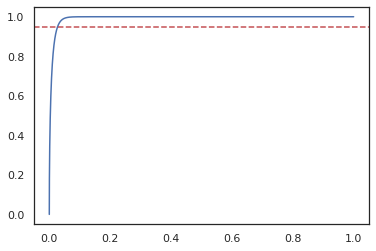

0.027354027354027352

In [ ]:
x = np.linspace(0,1,1000000)
outs = beta.cdf(x, a= 0.5, b= 69.5)
plt.plot(x, outs)
plt.axhline(0.95, c= 'r', linestyle ='--')
plt.show()
max(x[outs<0.95])

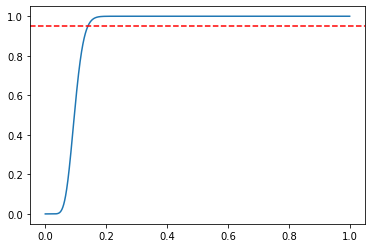

0.13991399139913993

In [ ]:
x = np.linspace(0,1,10000)
outs = beta.cdf(x, a= 14.5, b= 134.5)
plt.plot(x, outs)
plt.axhline(0.95, c= 'r', linestyle ='--')
plt.show()
max(x[outs<0.95])

In [ ]:
import statsmodels.stats.proportion
statsmodels.stats.proportion.proportion_confint(0,70,alpha=0.05, method='jeffrey')

(6.989747078072788e-06, 0.035124876297179475)